In [1]:
import os
import csv
import optuna
import numpy as np
import pandas as pd
from tensorflow import keras
from tensorflow.keras.optimizers import Adam, RMSprop, SGD
import tensorflow as tf
from keras.models import Sequential
from keras.layers import Input, LSTM, Dense, Activation, Dropout
from pandas import DataFrame
from pandas import Series
from pandas import concat
from pandas import read_csv
from datetime import datetime
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import KFold
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from math import sqrt
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
from numpy import array
import keras.backend as K
import itertools
#!pip install pydot

# date-time parsing function for loading the dataset
def parser(x):
    return datetime.strptime('190'+x, '%Y-%m')
    
def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))
    
def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
    
# convert time series into a supervised learning problem
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
# convert time series into a supervised learning problem
def series_to_supervised(data, n_in=1, n_out=1, dropnan=True):

    n_vars = 1 if type(data) is list else data.shape[1]
    cols, names = list(), list()
    df = DataFrame(data)
    # input sequence (t-n, ... t-1)
    for i in range(n_in, 0, -1):
    	cols.append(df.shift(i))
    	names += [('var%d(t-%d)' % (j+1, i)) for j in range(n_vars)]
    # forecast sequence (t, t+1, ... t+n)
    for i in range(0, n_out):
        cols.append(df[0].shift(-i)) # df[0] for temperatures
        if i == 0:
            names += [('var%d(t)' % (1))] # % (1) for temperatures
        else:            
            names += [('var%d(t+%d)' % (1, i))] # % (1) for temperatures
    
    # put it all together
    agg = concat(cols, axis=1)

    if dropnan:
        #Drop rows containing NaN
        agg.dropna(inplace=True)

    agg.columns = names

    return agg
     
# create a differenced series
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def difference(dataset, interval=1):
    diff = list()
    for i in range(interval, len(dataset)):
        value = dataset[i] - dataset[i - interval]
        diff.append(value)
    return Series(diff)
     
# transform series into training sets for supervised learning
def prepare_training_data(data, n_lag, n_seq, n_time_steps):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(84):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)
    
    # rescale values to 0, 1
    scaler_all_features =  MinMaxScaler(feature_range=(0, 1))
    scaler =  MinMaxScaler(feature_range=(0, 1))
    train_scaled_values = scaler_all_features.fit_transform(diff_values)
    response_train_values = []
    for i in range(len(diff_values)):
        response_train_values.append(diff_values[i][0]) # Uses first column (temperatures) as response variable
    response_train_values = np.array(response_train_values)
    response_train_values = response_train_values.reshape(len(response_train_values), 1)

    # Fit the scaler for just the response variable for use later when forecasting
    response_scaled_values = scaler.fit_transform(response_train_values) 
    scaled_values = scaler_all_features.transform(diff_values)

    train = []

    # Transform each weather station as a separate "batch"
    for ws in range(84):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        train.append([supervised_values])
    
    return scaler, scaler_all_features, train

# transform series into testing and validation sets for supervised learning
def prepare_testing_and_validation_data(data, n_lag, n_seq, n_time_steps, scaler_all_features):
    
    #Prepare data for time series forecasting.
        
    #Parameters:
    #x (array-like): Input features.
    #y (array-like): Target values.
    #n_test (int): Number of test samples (rows).
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations.
    #n_train (int): Number of training samples (rows).
        
    #Returns:
    #tuple: Training and test datasets.
    
    n_vars = len(data[0][0])

    # Each weather station has 227 time steps (the first 180 have no nan values)
    # Loop through data, grabbing one weather station (ws) at a time, 
    # differencing on each ws and separating by training (first 226-n_lag-n_seq-n_test time steps) 
    # and testing (n_test time steps) to scale data on training only.
    # We then recombine the training and testing datasets to change each ws to a supervised learning problem by taking all the first 180 time steps for all 12 predictors
    # and changing these to (t-n_lag) to (t-1) since we lose one row through differencing. We then shift forward only one dependent variable (temperature or specific humidity)
    # for time steps t to (t+n_seq)


    diff_values = []
    
    for ws in range(21):
        
        # transform data to be stationary
        diff_series = difference(data[ws], 1)
        for i in range(len(diff_series)):
            diff_values_row = []
            for j in range(len(diff_series[0])):
                diff_values_row.append(diff_series[i][j])
            diff_values.append(diff_values_row)

    # rescale values to 0, 1
    scaled_values = scaler_all_features.transform(diff_values)

    validation = []
    test = []

    # Transform each weather station as a separate "batch"
    for ws in range(21):
        # transform into supervised learning problem X, y
        first = (n_time_steps-1)*ws
        last = (n_time_steps-1)*ws+(n_time_steps-2)
        scaled_values_batch = scaled_values[first:last]
        supervised = series_to_supervised(scaled_values_batch, n_lag, n_seq)
        supervised_values = supervised.values
        # training/test/validation split is 80%/10%/10%
        if ws < 11:
            test.append([supervised_values])
        else:
            validation.append([supervised_values])
    
    return validation, test
    
def plot_kfold(cv, X, y, ax, n_splits, xlim_max=105):
    
    #Plots the indices for a cross-validation object.
    #Taken from https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
    #Parameters:
    #cv: Cross-validation object
    #X: Feature set
    #y: Target variable
    #ax: Matplotlib axis object
    #n_splits: Number of folds in the cross-validation
    #xlim_max: Maximum limit for the x-axis
        
    # Set color map for the plot
    cmap_cv = plt.cm.coolwarm
    cv_split = cv.split(X=X, y=y)
        
    for i_split, (train_idx, test_idx) in enumerate(cv_split):
        # Create an array of NaNs and fill in training/testing indices
        indices = np.full(len(X), np.nan)
        indices[test_idx], indices[train_idx] = 1, 0
            
        # Plot the training and testing indices
        ax_x = range(len(indices))
        ax_y = [i_split + 0.5] * len(indices)
        ax.scatter(ax_x, ax_y, c=indices, marker="_", 
                   lw=10, cmap=cmap_cv, vmin=-0.2, vmax=1.2)
    
        # Set y-ticks and labels
        y_ticks = np.arange(n_splits) + 0.5
        ax.set(yticks=y_ticks, yticklabels=range(n_splits),
               xlabel="Weather Station index (file_id)", ylabel="Fold",
               ylim=[n_splits, -0.2], xlim=[0, xlim_max])
    
        # Set plot title and create legend
        ax.set_title("KFold", fontsize=14)
        legend_patches = [Patch(color=cmap_cv(0.8), label="Testing set"), 
                          Patch(color=cmap_cv(0.02), label="Training set")]
        ax.legend(handles=legend_patches, loc=(1.03, 0.8))
    
#Main

#Configure
n_seq = 12
if n_seq > 46:
    n_lag = 179 - n_seq + 46
else:
    n_lag = 179
n_time_steps = 227
n_test = 1

print("Model Parameters:")
print("n_lag (number of input time steps): "+str(n_lag))
print("n_seq (number of output/future prediction time steps): "+str(n_seq))

# Create 2D array with file_ids to use for sample creation
array = np.array([
    6501, 6541, 6640, 6668, 6678, 
    6687, 6697, 6714, 6744, 6772, 
    6783, 6840, 6844, 6854, 6870, 
    6891, 6895, 6899, 6901, 6909, 
    6929, 6950, 6963, 6969, 6994, 
    7032, 7057, 7094, 7095, 7100, 
    7108, 7116, 7119, 7131, 7139, 
    7152, 7155, 7156, 7182, 7193, 
    7202, 7239, 7280, 7286, 7287, 
    7311, 7321, 7329, 7347, 7350, 
    7354, 7357, 7361, 7414, 7423, 
    7424, 7432, 7463, 7482, 7489, 
    7528, 7531, 7534, 7538, 7549, 
    7553, 7555, 7562, 7571, 7573, 
    7574, 7575, 7585, 7599, 7603, 
    7606, 7622, 7652, 7671, 7704, 
    7786, 7805, 7816, 7838, 7861, 
    7862, 7863, 7870, 7892, 7907, 
    7938, 7962, 7979, 7987, 7999, 
    8000, 8034, 8083, 8120, 8133, 
    8184, 8186, 8247, 8248, 9858])
    
#Create arrays holding the 5-fold cross-validation indices gathered for consistency across models
train_array = []
test_array = []
    
train_array.append([1, 2, 3, 5, 6, 7, 8, 9, 11, 13, 14, 15, 16, 17, 19, 20, 21, 22, 
                        23, 24, 25, 27, 28, 29, 32, 34, 35, 36, 37, 38, 39, 40, 41, 42, 
                        43, 44, 46, 48, 49, 50, 51, 52, 54, 55, 56, 57, 58, 59, 60, 61, 
                        62, 63, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 79, 81, 
                        82, 83, 84, 85, 86, 87, 88, 90, 91, 92, 93, 95, 97, 98, 100, 101, 102, 103])
test_array.append([0, 4, 10, 12, 18, 26, 30, 31, 33, 45, 47, 53, 64, 65, 77, 80, 89, 94, 96, 99, 104])
    
train_array.append([0, 1, 2, 3, 4, 6, 7, 8, 10, 12, 13, 14, 17, 18, 19, 20, 21, 23, 
                        24, 25, 26, 27, 29, 30, 31, 32, 33, 34, 36, 37, 38, 41, 43, 45, 
                        46, 47, 48, 49, 50, 51, 52, 53, 54, 57, 58, 59, 60, 61, 63, 64, 
                        65, 66, 67, 68, 69, 70, 71, 73, 74, 75, 77, 80, 81, 82, 83, 84, 
                        86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 104])
test_array.append([5, 9, 11, 15, 16, 22, 28, 35, 39, 40, 42, 44, 55, 56, 62, 72, 76, 78, 79, 85, 103])
    
train_array.append([0, 1, 2, 4, 5, 9, 10, 11, 12, 14, 15, 16, 18, 20, 21, 22, 23, 26, 
                    28, 29, 30, 31, 32, 33, 35, 36, 37, 39, 40, 41, 42, 44, 45, 46, 47, 
                    48, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 
                    70, 71, 72, 74, 75, 76, 77, 78, 79, 80, 82, 83, 85, 86, 87, 88, 89, 
                    90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104])
test_array.append([3, 6, 7, 8, 13, 17, 19, 24, 25, 27, 34, 38, 43, 49, 66, 67, 68, 69, 73, 81, 84])
    
train_array.append([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 
                        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 33, 34, 
                        35, 37, 38, 39, 40, 42, 43, 44, 45, 47, 49, 51, 52, 53, 55, 56, 
                        60, 62, 64, 65, 66, 67, 68, 69, 71, 72, 73, 74, 76, 77, 78, 79, 
                        80, 81, 82, 84, 85, 86, 87, 88, 89, 92, 93, 94, 95, 96, 99, 102, 103, 104])
test_array.append([32, 36, 41, 46, 48, 50, 54, 57, 58, 59, 61, 63, 70, 75, 83, 90, 91, 97, 98, 100, 101])
    
train_array.append([0, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15, 16, 17, 18, 19, 22,
                        24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 38, 39, 40, 41, 
                        42, 43, 44, 45, 46, 47, 48, 49, 50, 53, 54, 55, 56, 57, 58, 59, 
                        61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 72, 73, 75, 76, 77, 78, 
                        79, 80, 81, 83, 84, 85, 89, 90, 91, 94, 96, 97, 98, 99, 100, 101, 103, 104])
test_array.append([1, 2, 14, 20, 21, 23, 29, 37, 51, 52, 60, 71, 74, 82, 86, 87, 88, 92, 93, 95, 102])
    
# Equations for three Principal Components from PCA using response variables combined with other predictors
#PC1=-0.0002714X1+0.02612X2+0.03858X3-0.007658X4+0.001592X5-0.02087X6+0.8564X7-0.1468X8+0.01192X9-0.0001049X10+0.01913X11+0.02076X12
#PC2=0.0003944X1+0.002204X2+0.01052X3+0.3248X4-0.0009976X5-0.04421X6+2.3406X7+0.06103X8+0.08841X9+0.00009018X10+0.05678X11-0.002022X12
#PC3=-0.00007998X1-0.0006124X2-0.001063X3-0.01855X4+0.00001956X5+0.01170X6+0.6076X7+0.4664X8-0.002995X9+0.008185X10+0.8815X11-0.0004730X12
    
# Equations for three Principal Components from PCA omitting both response variables,
#PC-1=-0.0004514X1+0.03194X2-0.04343X3+0.002243X4-0.02252X5+0.9877X6-0.2265X7+0.006144X8-0.0001488X9+0.02943X10
#PC-2=0.0001702X1+0.005484X2+0.2057X3-0.0003188X4-0.02584X5+1.6963X6-0.05890X7+0.05809X8+1.9748X9+0.03686X10
#PC-3=-0.00006323X1-0.001180X2-0.02384X3-0.00002833X4+0.01170X5+0.5204X6+0.4791X7-0.004318X8+0.008271X9+0.8765X10
    
# Get the current working directory 
current_directory = os.getcwd() 
    
# Print the current working directory 
print(current_directory)
    
# Define the directory containing the files 
path = current_directory+"\\Modeling\\"
print(path)
    
filename = path + 'Final_Monthly_Dataset.csv'
    
# load dataset
df = read_csv(filename, header=0, parse_dates=[0], index_col=0, date_format='%Y-%m')

print(df)
    
df = df.rename(columns={'Unnamed: 0' : 'indices'})
    
#Remove unused columns
df = df.drop(['Day', 'vapor_pressure'], axis=1)
    
# Round numbers in columns to reasonable precision,
df['temperatures'] = np.round(df['temperatures'], 2)
df['slp'] = np.round(df['slp'], 2)
df['wet_bulb_temperature'] = np.round(df['wet_bulb_temperature'], 2)
df['specific_humidity'] = np.round(df['specific_humidity'], 2)
df['GHI'] = np.round(df['GHI'], 2)
df['PRCP'] = np.round(df['PRCP'], 2)
df['SNDP'] = np.round(df['SNDP'], 2)
df['solar_activity'] = np.round(df['solar_activity'], 2)
df['ONI'] = np.round(df['ONI'], 2)
df['water'] = np.round(df['water'], 0)
df['region'] = np.round(df['region'], 0)
    
df_trimmed = df[df['file_id'] != 7533] # Remove file_id 7533 so there are 105 weather stations for 5-fold CV
df_trimmed = df_trimmed.drop(['Year', 'Month', 'date', 'latitude', 'longitude', 'elevation'], axis=1)

#Test model and accuracy when solar activity is removed as a predictor
df_trimmed = df_trimmed.drop(['solar_activity'], axis=1)

n_vars = df_trimmed.shape[1]-1
    
X = []
y = []
    
for i in array:
    add_to_X = [] # create list to store each column to add to X
    new_df = df_trimmed[df_trimmed['file_id'] == i].drop(['file_id'], axis=1)
    #new_df = new_df.iloc[:180, :]
    add_to_y = []
    for j in range(new_df.shape[0]):
        add_to_y.append(new_df['temperatures'].iloc[j])
    y.append(add_to_y)
    #new_df = new_df.drop(['temperatures'], axis=1)
    columns_list = new_df.columns.tolist()
    for j in range(new_df.shape[0]):
        l=0
        new_row = []
        for m in columns_list:
            new_row.append(new_df.iloc[j, l])
            l += 1
        add_to_X.append(new_row)
    X.append(add_to_X)
    
#Perform k-fold cross-validation
#Taken from: https://www.geeksforgeeks.org/cross-validation-using-k-fold-with-scikit-learn/
    
#k = 5  # Number of folds
#kf = KFold(n_splits=k, shuffle=True, random_state=42)
    
#for i, (train_index, test_index) in enumerate(kf.split(X)):
#    print(f"Fold {i}:")
#    print(f"  Training dataset index: {train_index}")
#    print(f"  Test dataset index: {test_index}")
    
#for train_indices, test_indices in kf.split(X):
#    print('Train: %s | test: %s' % (train_indices, test_indices))
    
# Create figure and axis
#fig, ax = plt.subplots(figsize=(6, 3))
#plot_kfold(kf, X, y, ax, k)
#plt.tight_layout()
#fig.subplots_adjust(right=0.6)
    
#Create train and test sets for each cross-validation split
train_X = []
train_y = []
val_X = []
val_y = []
for i in range(5):
    print(f"Fold {i+1}")
    #Add each corresponding sample for each entry of train index 
    train_X_rows = [] # Stores all the samples for one fold of train_X
    train_y_rows = [] # Stores all the samples for one fold of train_y
    for j in train_array[i]:
        train_X_rows.append(X[j])
        train_y_rows.append(y[j])
    # Stores one fold of train dataset
    train_X.append(train_X_rows)
    train_y.append(train_y_rows)
    #Add each corresponding sample for each entry of the validation index 
    val_X_rows = [] # Stores all the samples for one fold of val_X
    val_y_rows = [] # Stores all the samples for one fold of val_y
    for j in test_array[i]: 
            val_X_rows.append(X[j])
            val_y_rows.append(y[j])
    # Stores one fold of validation dataset
    val_X.append(val_X_rows)
    val_y.append(val_y_rows) 
    
#Convert 3D arrays to DataFrames
df_X = []
df_y = []
val_df_X = []
val_df_y = []
dataset = []
dataset_test = []
scaler = []
scaler_all_features = []
train = []
test = []
validation = []

for i in range(5):
    dataset_scaling = [] # Holds all 84 weather station rows to train the scaling function
    dataset_testing = [] # Holds remaining 21 weather station rows for testing and validation
    print("Fold "+str(i+1)+":")
    #Transform train_X to the correct format
    df1 = []
    dataset_df = [] # captures each weather station's dataset as values for training scaler mapping
    df_X.append(pd.DataFrame(train_X[i]))
    X_t = df_X[i].transpose()
    for k in range(84):
        X = np.array(X_t.iloc[:, k])
        df = pd.DataFrame()
        for j in range(n_time_steps):
            new_row = pd.DataFrame(X[j]).transpose()
            new_row.columns = new_df.columns
            # Add the new row
            df = pd.concat([df, new_row], ignore_index=True)
        df.columns = new_df.columns
        df1.append(df)
        dataset_df.append(df.values)
        dataset_scaling.append(df.values)
    df_X[i] = df1
    dataset.append(dataset_df)

    #print(len(dataset))
    #print(len(dataset[0]))
    #print(len(dataset_scaling))
    #print(len(dataset_scaling[:][0]))
    #print("Stop")
    
    #Transform train_y to the correct format
    df2 = []
    df_y.append(pd.DataFrame(train_y[i]))
    y_t = df_y[i].transpose()
    
    for j in range(84):
        y = np.array(y_t.iloc[:, j])
        y = pd.DataFrame(y)
        y.columns = ['temperatures']
        df2.append(y)
    df_y[i] = df2

    #Transform val_X to the correct format
    df3 = []
    dataset_vl_df = [] # captures each weather station's dataset as values for training scaler mapping
    val_df_X.append(pd.DataFrame(val_X[i]))
    val_X_t = val_df_X[i].transpose()
    for k in range(21):
        vl_X = np.array(val_X_t.iloc[:, k])
        vl_df = pd.DataFrame()
        for j in range(n_time_steps):
            new1_row = pd.DataFrame(vl_X[j]).transpose()
            new1_row.columns = new_df.columns
            # Add the new row
            vl_df = pd.concat([vl_df, new1_row], ignore_index=True)
        vl_df.columns = new_df.columns
        df3.append(vl_df)
        dataset_vl_df.append(vl_df.values)
        dataset_testing.append(vl_df.values)
    val_df_X[i] = df3
    dataset_test.append(dataset_vl_df)

    #Transform val_y to the correct format
    df4 = []
    val_df_y.append(pd.DataFrame(train_y[i]))
    val_y_t = val_df_y[i].transpose()
    
    for j in range(21):
        v_y = np.array(val_y_t.iloc[:, j])
        v_y = pd.DataFrame(v_y)
        v_y.columns = ['temperatures']
        df4.append(v_y)
    val_df_y[i] = df4
    
    scaler.append(MinMaxScaler(feature_range=(0, 1)))
    scaler_all_features.append(MinMaxScaler(feature_range=(0, 1)))
    train.append([1])
    test.append([1])
    validation.append([1])
    
    # prepare data
    scaler[i], scaler_all_features[i], train[i] = prepare_training_data(dataset_scaling, n_lag, n_seq, n_time_steps)

    validation[i], test[i] = prepare_testing_and_validation_data(dataset_testing, n_lag, n_seq, n_time_steps, scaler_all_features[i])

    #Reshape dimensionality
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]
    print(np.array(train1).shape)
    print(np.array(test1).shape)
    print(np.array(validation1).shape)
    train2 = []
    test2 = []
    validation2 = []

    for k in range(84):
        train2.append(train1[k][0])
        
    for k in range(11):
        test2.append(test1[k][0])

    for k in range(10):
        validation2.append(validation1[k][0])

    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2

    #Reshape dimensionality (again)
    dim_size = n_seq + n_vars*n_lag
    train1 = np.array(train[i]).reshape(84, dim_size)
    test1 = np.array(test[i]).reshape(11, dim_size)
    validation1 = np.array(validation[i]).reshape(10, dim_size)
    train2 = pd.DataFrame(train1).values
    test2 = pd.DataFrame(test1).values
    validation2 = pd.DataFrame(validation1).values
    print(np.array(train2).shape)
    print(np.array(test2).shape)
    print(np.array(validation2).shape)

    print(train2)

    train[i] = train2
    test[i] = test2
    validation[i] = validation2
    
    #X_train = train1[:][:-n_seq]
    #y_train = train1[:][-n_seq:]
    #X_test = test1[:][:-n_seq]
    #y_test = test1[:][-n_seq:]

print("Finished")

Model Parameters:
n_lag (number of input time steps): 179
n_seq (number of output/future prediction time steps): 12
C:\Users\User
C:\Users\User\Modeling\
             date  file_id  temperatures          slp  vapor_pressure  \
0      2006-01-31     6501     12.209677  1018.534543        8.674922   
1      2006-02-28     6501      8.174541  1021.230347        6.942276   
2      2006-03-31     6501     15.676613  1018.968548       10.468176   
3      2006-04-30     6501     22.464167  1014.686944       16.358802   
4      2006-05-31     6501     23.657258  1014.236828       18.798749   
...           ...      ...           ...          ...             ...   
24057  2024-07-31     9858     28.604704  1013.969355       23.769169   
24058  2024-08-31     9858     29.114919  1015.112097       23.699154   
24059  2024-09-30     9858     24.570278  1014.393750       16.790240   
24060  2024-10-31     9858     21.159140  1018.230376       10.994776   
24061  2024-11-30     9858     12.112917  1

In [2]:
print(n_seq)
print(n_lag)
print(np.array(train[1]).shape)
print(np.array(test[1]).shape)

12
179
(84, 1981)
(11, 1981)


[I 2025-05-24 01:15:00,448] A new study created in memory with name: no-name-70c16662-6908-4335-b910-9c88cbe3064a
[I 2025-05-24 01:17:22,411] Trial 0 finished with value: 0.3079415917396545 and parameters: {'lr': 0.11150951918443833, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.2794203610561846}. Best is trial 0 with value: 0.3079415917396545.


Cross Validation Accuracies:
[0.273029088973999, 0.33802908658981323, 0.28581884503364563, 0.314720094203949, 0.32811084389686584]
Mean Cross Validation Accuracy:
0.3079415917396545
Standard Deviation of Cross Validation Accuracy:
0.024764098795547057


[I 2025-05-24 01:20:54,165] Trial 1 finished with value: 22.335600280761717 and parameters: {'lr': 0.21539963982081126, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2480434378499493}. Best is trial 0 with value: 0.3079415917396545.


Cross Validation Accuracies:
[22.940017700195312, 24.515993118286133, 22.135822296142578, 23.71440887451172, 18.37175941467285]
Mean Cross Validation Accuracy:
22.335600280761717
Standard Deviation of Cross Validation Accuracy:
2.134127087867825


[I 2025-05-24 01:23:31,253] Trial 2 finished with value: 0.062440072745084764 and parameters: {'lr': 0.006857188718525407, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.13821517095400204}. Best is trial 2 with value: 0.062440072745084764.


Cross Validation Accuracies:
[0.05505898967385292, 0.05092186853289604, 0.06853016465902328, 0.0798620730638504, 0.05782726779580116]
Mean Cross Validation Accuracy:
0.062440072745084764
Standard Deviation of Cross Validation Accuracy:
0.010478957006358333


[I 2025-05-24 01:28:21,318] Trial 3 finished with value: 0.06251285076141358 and parameters: {'lr': 0.008771807702043126, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1546021204096403}. Best is trial 2 with value: 0.062440072745084764.


Cross Validation Accuracies:
[0.0551801472902298, 0.04894202947616577, 0.07018644362688065, 0.07928117364645004, 0.058974459767341614]
Mean Cross Validation Accuracy:
0.06251285076141358
Standard Deviation of Cross Validation Accuracy:
0.010867535334390773


[I 2025-05-24 01:31:40,627] Trial 4 finished with value: 79.56441345214844 and parameters: {'lr': 0.832068008140449, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2550162145674183}. Best is trial 2 with value: 0.062440072745084764.


Cross Validation Accuracies:
[90.49547576904297, 72.80630493164062, 95.36731719970703, 50.041770935058594, 89.11119842529297]
Mean Cross Validation Accuracy:
79.56441345214844
Standard Deviation of Cross Validation Accuracy:
16.598912286777903


[I 2025-05-24 01:36:03,279] Trial 5 finished with value: 0.060054638981819154 and parameters: {'lr': 0.05779862437157957, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3241179480379064}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.049186863005161285, 0.05058516561985016, 0.06623829156160355, 0.07828713953495026, 0.05597573518753052]
Mean Cross Validation Accuracy:
0.060054638981819154
Standard Deviation of Cross Validation Accuracy:
0.010909432361423069


[I 2025-05-24 01:40:07,006] Trial 6 finished with value: 0.06871012300252914 and parameters: {'lr': 0.0016015872599720415, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.43786518282457043}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.06341170519590378, 0.06442395597696304, 0.06862931698560715, 0.09278624504804611, 0.05429939180612564]
Mean Cross Validation Accuracy:
0.06871012300252914
Standard Deviation of Cross Validation Accuracy:
0.012913402456383142


[I 2025-05-24 01:42:55,971] Trial 7 finished with value: 0.06226677820086479 and parameters: {'lr': 0.0010031378332976129, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.26379024097975434}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.05478474125266075, 0.0551966093480587, 0.06667934358119965, 0.07881584018468857, 0.05585735663771629]
Mean Cross Validation Accuracy:
0.06226677820086479
Standard Deviation of Cross Validation Accuracy:
0.009384999041617466


[I 2025-05-24 01:47:32,179] Trial 8 finished with value: 0.06856875941157341 and parameters: {'lr': 0.03013122598220831, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.41800017682018553}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.05123614892363548, 0.07547397911548615, 0.06677006185054779, 0.0776480883359909, 0.07171551883220673]
Mean Cross Validation Accuracy:
0.06856875941157341
Standard Deviation of Cross Validation Accuracy:
0.0094199051690665


[I 2025-05-24 01:51:49,516] Trial 9 finished with value: 0.0682315319776535 and parameters: {'lr': 0.013639946258155115, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.44916171229387425}. Best is trial 5 with value: 0.060054638981819154.


Cross Validation Accuracies:
[0.06123577430844307, 0.06039029732346535, 0.0762426108121872, 0.07905365526676178, 0.06423532217741013]
Mean Cross Validation Accuracy:
0.0682315319776535
Standard Deviation of Cross Validation Accuracy:
0.00784462893467489


[I 2025-05-24 01:56:14,660] Trial 10 finished with value: 0.05979172885417938 and parameters: {'lr': 0.08688723247598751, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.37241874241428224}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.04543479532003403, 0.05355168879032135, 0.06622147560119629, 0.0760430321097374, 0.05770765244960785]
Mean Cross Validation Accuracy:
0.05979172885417938
Standard Deviation of Cross Validation Accuracy:
0.01053422532222847


[I 2025-05-24 02:00:06,310] Trial 11 finished with value: 0.060519779473543166 and parameters: {'lr': 0.09178667847726885, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.35548492566944023}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.04710778966546059, 0.05539481341838837, 0.06736505031585693, 0.07917185872793198, 0.05355938524007797]
Mean Cross Validation Accuracy:
0.060519779473543166
Standard Deviation of Cross Validation Accuracy:
0.0113960662421775


[I 2025-05-24 02:03:42,747] Trial 12 finished with value: 0.06406177505850792 and parameters: {'lr': 0.4631706419913217, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.35380070562354005}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.04876915365457535, 0.05308931693434715, 0.07380425930023193, 0.08821388334035873, 0.05643226206302643]
Mean Cross Validation Accuracy:
0.06406177505850792
Standard Deviation of Cross Validation Accuracy:
0.014769623616715402


[I 2025-05-24 02:07:21,487] Trial 13 finished with value: 0.06184795722365379 and parameters: {'lr': 0.044290770715498515, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3524520082310393}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05111336708068848, 0.05305993929505348, 0.06891077756881714, 0.07812992483377457, 0.0580257773399353]
Mean Cross Validation Accuracy:
0.06184795722365379
Standard Deviation of Cross Validation Accuracy:
0.010218176395026915


[I 2025-05-24 02:10:56,226] Trial 14 finished with value: 0.06128716170787811 and parameters: {'lr': 0.04871868273288556, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.1964750730380172}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.0531693734228611, 0.04948556050658226, 0.07016538828611374, 0.07674465328454971, 0.05687083303928375]
Mean Cross Validation Accuracy:
0.06128716170787811
Standard Deviation of Cross Validation Accuracy:
0.0104157303102682


[I 2025-05-24 02:14:32,307] Trial 15 finished with value: 0.06111136898398399 and parameters: {'lr': 0.2579247358128323, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4911394711363688}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05525650829076767, 0.05245186388492584, 0.06591980159282684, 0.07929607480764389, 0.05263259634375572]
Mean Cross Validation Accuracy:
0.06111136898398399
Standard Deviation of Cross Validation Accuracy:
0.01034369912390244


[I 2025-05-24 02:18:23,453] Trial 16 finished with value: 0.060984828323125836 and parameters: {'lr': 0.02043031889091166, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3278849791468722}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.050395622849464417, 0.05097292736172676, 0.06922634690999985, 0.07787993550300598, 0.05644930899143219]
Mean Cross Validation Accuracy:
0.060984828323125836
Standard Deviation of Cross Validation Accuracy:
0.010828736253782147


[I 2025-05-24 02:22:05,242] Trial 17 finished with value: 0.06055081859230995 and parameters: {'lr': 0.10979171500316957, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.39158113941759676}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.0485571064054966, 0.05133235082030296, 0.0707014948129654, 0.07965076714754105, 0.05251237377524376]
Mean Cross Validation Accuracy:
0.06055081859230995
Standard Deviation of Cross Validation Accuracy:
0.012339287967380607


[I 2025-05-24 02:27:26,656] Trial 18 finished with value: 0.0881693497300148 and parameters: {'lr': 0.003377980628131795, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31335418633831796}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.06816240400075912, 0.0634998008608818, 0.12216948717832565, 0.07738251239061356, 0.10963254421949387]
Mean Cross Validation Accuracy:
0.0881693497300148
Standard Deviation of Cross Validation Accuracy:
0.023417508162927408


[I 2025-05-24 02:29:01,311] Trial 19 finished with value: 0.06343256533145905 and parameters: {'lr': 0.06054315472594041, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.21337816639074308}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05280028656125069, 0.057028528302907944, 0.06900936365127563, 0.0774986669421196, 0.060825981199741364]
Mean Cross Validation Accuracy:
0.06343256533145905
Standard Deviation of Cross Validation Accuracy:
0.00882957775850619


[I 2025-05-24 02:32:40,813] Trial 20 finished with value: 0.07502413094043732 and parameters: {'lr': 0.21490832656857875, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3949175408734965}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.050181690603494644, 0.058012429624795914, 0.06921923160552979, 0.14349141716957092, 0.05421588569879532]
Mean Cross Validation Accuracy:
0.07502413094043732
Standard Deviation of Cross Validation Accuracy:
0.034816645540470974


[I 2025-05-24 02:36:07,422] Trial 21 finished with value: 0.061342532932758334 and parameters: {'lr': 0.08735016953107548, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3588074674050063}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05195540189743042, 0.05194071680307388, 0.06570594012737274, 0.07910274714231491, 0.0580078586935997]
Mean Cross Validation Accuracy:
0.061342532932758334
Standard Deviation of Cross Validation Accuracy:
0.010218580713655567


[I 2025-05-24 02:40:11,255] Trial 22 finished with value: 0.061782524734735486 and parameters: {'lr': 0.02556604145433377, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2980358619019954}. Best is trial 10 with value: 0.05979172885417938.


Cross Validation Accuracies:
[0.05517590418457985, 0.05128127709031105, 0.06927035003900528, 0.07806858420372009, 0.05511650815606117]
Mean Cross Validation Accuracy:
0.061782524734735486
Standard Deviation of Cross Validation Accuracy:
0.010194730747057477


[I 2025-05-24 02:43:35,583] Trial 23 finished with value: 0.059606140851974486 and parameters: {'lr': 0.0969801345746359, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.38331375548114205}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04952066019177437, 0.046392928808927536, 0.06844446808099747, 0.07987838238477707, 0.053794264793395996]
Mean Cross Validation Accuracy:
0.059606140851974486
Standard Deviation of Cross Validation Accuracy:
0.0126424965962712


[I 2025-05-24 02:47:26,509] Trial 24 finished with value: 0.0631502814590931 and parameters: {'lr': 0.36376113040350055, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4844234799577443}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05016399919986725, 0.043084632605314255, 0.07438044995069504, 0.0844053402543068, 0.06371698528528214]
Mean Cross Validation Accuracy:
0.0631502814590931
Standard Deviation of Cross Validation Accuracy:
0.015162382087283103


[I 2025-05-24 02:50:51,673] Trial 25 finished with value: 0.06328735649585723 and parameters: {'lr': 0.1735013499939073, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4018922192083659}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04871438443660736, 0.05843640863895416, 0.07122137397527695, 0.07690999656915665, 0.06115461885929108]
Mean Cross Validation Accuracy:
0.06328735649585723
Standard Deviation of Cross Validation Accuracy:
0.009889153002223157


[I 2025-05-24 02:54:24,813] Trial 26 finished with value: 0.06436908692121505 and parameters: {'lr': 0.05270415990742016, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3198979634134897}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05045144632458687, 0.051687922328710556, 0.08503630012273788, 0.07888539880514145, 0.05578436702489853]
Mean Cross Validation Accuracy:
0.06436908692121505
Standard Deviation of Cross Validation Accuracy:
0.01460182922188818


[I 2025-05-24 02:58:06,583] Trial 27 finished with value: 0.06295156255364417 and parameters: {'lr': 0.01796770465780102, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4480617047230854}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.051069870591163635, 0.06342102587223053, 0.06755749881267548, 0.07632580399513245, 0.056383613497018814]
Mean Cross Validation Accuracy:
0.06295156255364417
Standard Deviation of Cross Validation Accuracy:
0.008770609300005106


[I 2025-05-24 03:01:00,347] Trial 28 finished with value: 2.518903875350952 and parameters: {'lr': 0.13772590428877415, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 512, 'dropout_rate': 0.379078544447613}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[4.016781330108643, 1.9531989097595215, 1.6933836936950684, 3.0583596229553223, 1.872795820236206]
Mean Cross Validation Accuracy:
2.518903875350952
Standard Deviation of Cross Validation Accuracy:
0.8892255810979453


[I 2025-05-24 03:03:05,661] Trial 29 finished with value: 0.0630213312804699 and parameters: {'lr': 0.0756804172505942, 'optimizer': 'SGD', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.22814736979595443}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04945787414908409, 0.054839447140693665, 0.06977616250514984, 0.08044246584177017, 0.0605907067656517]
Mean Cross Validation Accuracy:
0.0630213312804699
Standard Deviation of Cross Validation Accuracy:
0.011008562188047443


[I 2025-05-24 03:05:07,022] Trial 30 finished with value: 0.05987488999962807 and parameters: {'lr': 0.03644534468745643, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.28821469222997853}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04322236403822899, 0.054369643330574036, 0.06551656872034073, 0.07860933244228363, 0.05765654146671295]
Mean Cross Validation Accuracy:
0.05987488999962807
Standard Deviation of Cross Validation Accuracy:
0.011792737633141879


[I 2025-05-24 03:07:20,130] Trial 31 finished with value: 0.06214159652590752 and parameters: {'lr': 0.03618541795957628, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.29251790754839996}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05333251133561134, 0.052607085555791855, 0.06753348559141159, 0.08107823878526688, 0.05615666136145592]
Mean Cross Validation Accuracy:
0.06214159652590752
Standard Deviation of Cross Validation Accuracy:
0.010881132459496096


[I 2025-05-24 03:09:23,225] Trial 32 finished with value: 0.39542346000671386 and parameters: {'lr': 0.14167853202244143, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3338893556698612}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.3694823980331421, 0.52948397397995, 0.26573216915130615, 0.5968832969665527, 0.2155354619026184]
Mean Cross Validation Accuracy:
0.39542346000671386
Standard Deviation of Cross Validation Accuracy:
0.14724859849697094


[I 2025-05-24 03:11:01,996] Trial 33 finished with value: 0.22938127517700196 and parameters: {'lr': 0.07187476106757329, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.281006049803254}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.2905295789241791, 0.180787593126297, 0.2410593181848526, 0.18075264990329742, 0.25377723574638367]
Mean Cross Validation Accuracy:
0.22938127517700196
Standard Deviation of Cross Validation Accuracy:
0.042887629365607166


[I 2025-05-24 03:12:51,770] Trial 34 finished with value: 0.06026736199855805 and parameters: {'lr': 0.008177925903857021, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3732321393113042}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05313504859805107, 0.046598080545663834, 0.0672721415758133, 0.07962842285633087, 0.05470311641693115]
Mean Cross Validation Accuracy:
0.06026736199855805
Standard Deviation of Cross Validation Accuracy:
0.011769431534602328


[I 2025-05-24 03:14:40,813] Trial 35 finished with value: 0.06281960755586624 and parameters: {'lr': 0.012896111566682049, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.10756444944833488}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.051538798958063126, 0.0496302992105484, 0.07331039011478424, 0.08014527708292007, 0.059473272413015366]
Mean Cross Validation Accuracy:
0.06281960755586624
Standard Deviation of Cross Validation Accuracy:
0.012022044746178566


[I 2025-05-24 03:17:23,125] Trial 36 finished with value: 34.708342742919925 and parameters: {'lr': 0.3256518578515182, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.4162029175638684}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[35.28745651245117, 37.6311149597168, 29.739849090576172, 34.11272430419922, 36.77056884765625]
Mean Cross Validation Accuracy:
34.708342742919925
Standard Deviation of Cross Validation Accuracy:
2.7630214329360747


[I 2025-05-24 03:19:35,246] Trial 37 finished with value: 0.06142960712313652 and parameters: {'lr': 0.0355850910765334, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.26391390734206227}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04984654486179352, 0.053254805505275726, 0.06956058740615845, 0.07916002720594406, 0.05532607063651085]
Mean Cross Validation Accuracy:
0.06142960712313652
Standard Deviation of Cross Validation Accuracy:
0.011124104522709368


[I 2025-05-24 03:22:41,102] Trial 38 finished with value: 0.0895550161600113 and parameters: {'lr': 0.12242956845720163, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.23497970333812704}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.06999565660953522, 0.07346371561288834, 0.10928502678871155, 0.10643873363733292, 0.08859194815158844]
Mean Cross Validation Accuracy:
0.0895550161600113
Standard Deviation of Cross Validation Accuracy:
0.01622811901961609


[I 2025-05-24 03:25:54,276] Trial 39 finished with value: 0.34868584871292113 and parameters: {'lr': 0.005496182189510393, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.3330486808083059}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.3599778711795807, 0.3458142578601837, 0.34339240193367004, 0.346128910779953, 0.34811580181121826]
Mean Cross Validation Accuracy:
0.34868584871292113
Standard Deviation of Cross Validation Accuracy:
0.0058419049852086


[I 2025-05-24 03:29:28,898] Trial 40 finished with value: 1.645370614528656 and parameters: {'lr': 0.6247272151922251, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.27848996019556427}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[1.2102415561676025, 2.22603440284729, 1.3462883234024048, 2.495208740234375, 0.9490800499916077]
Mean Cross Validation Accuracy:
1.645370614528656
Standard Deviation of Cross Validation Accuracy:
0.6038217186432404


[I 2025-05-24 03:31:14,281] Trial 41 finished with value: 0.06109647899866104 and parameters: {'lr': 0.007589858249055357, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.36176552064261625}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.0544997900724411, 0.0493171326816082, 0.06635734438896179, 0.07883881777524948, 0.05646931007504463]
Mean Cross Validation Accuracy:
0.06109647899866104
Standard Deviation of Cross Validation Accuracy:
0.010451289744449328


[I 2025-05-24 03:32:58,665] Trial 42 finished with value: 0.06428061649203301 and parameters: {'lr': 0.0030972008502887093, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.37867230290118087}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05113064870238304, 0.05981825664639473, 0.06948456913232803, 0.08191215991973877, 0.05905744805932045]
Mean Cross Validation Accuracy:
0.06428061649203301
Standard Deviation of Cross Validation Accuracy:
0.010564736091950326


[I 2025-05-24 03:34:55,367] Trial 43 finished with value: 0.06354920864105225 and parameters: {'lr': 0.026059546337403535, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.4263362228976415}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04533318057656288, 0.06798020750284195, 0.07143574953079224, 0.07245920598506927, 0.06053769960999489]
Mean Cross Validation Accuracy:
0.06354920864105225
Standard Deviation of Cross Validation Accuracy:
0.010021099698930424


[I 2025-05-24 03:36:39,164] Trial 44 finished with value: 0.06196916401386261 and parameters: {'lr': 0.015685875334631193, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 256, 'dropout_rate': 0.3751673427880994}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.06084736809134483, 0.048141516745090485, 0.06735195219516754, 0.07712238281965256, 0.05638260021805763]
Mean Cross Validation Accuracy:
0.06196916401386261
Standard Deviation of Cross Validation Accuracy:
0.009821063067783445


[I 2025-05-24 03:38:18,374] Trial 45 finished with value: 0.06064588874578476 and parameters: {'lr': 0.04049834784330397, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.47197719435610064}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.04826514795422554, 0.049289822578430176, 0.07176099717617035, 0.0782385990023613, 0.055674877017736435]
Mean Cross Validation Accuracy:
0.06064588874578476
Standard Deviation of Cross Validation Accuracy:
0.012165549954988388


[I 2025-05-24 03:41:04,346] Trial 46 finished with value: 0.09697702527046204 and parameters: {'lr': 0.06480673474370263, 'optimizer': 'SGD', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.30865456390793644}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.10798212885856628, 0.09752894192934036, 0.08724741637706757, 0.09533625096082687, 0.0967903882265091]
Mean Cross Validation Accuracy:
0.09697702527046204
Standard Deviation of Cross Validation Accuracy:
0.006615272933492728


[I 2025-05-24 03:42:44,959] Trial 47 finished with value: 0.08708810359239579 and parameters: {'lr': 0.010224876320359047, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.3389257916013313}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.056868597865104675, 0.09201406687498093, 0.0772634968161583, 0.10773465037345886, 0.10155970603227615]
Mean Cross Validation Accuracy:
0.08708810359239579
Standard Deviation of Cross Validation Accuracy:
0.01827410030689022


[I 2025-05-24 03:45:07,795] Trial 48 finished with value: 0.061349383741617206 and parameters: {'lr': 0.09372813988139543, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.41443892809125416}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.049249812960624695, 0.05558560788631439, 0.06804125010967255, 0.07708805799484253, 0.05678218975663185]
Mean Cross Validation Accuracy:
0.061349383741617206
Standard Deviation of Cross Validation Accuracy:
0.009929420212962625


[I 2025-05-24 03:49:01,008] Trial 49 finished with value: 0.06917145922780037 and parameters: {'lr': 0.004842220878876978, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.36755320247275314}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.05581557750701904, 0.08618134260177612, 0.0688319057226181, 0.07590065896511078, 0.0591278113424778]
Mean Cross Validation Accuracy:
0.06917145922780037
Standard Deviation of Cross Validation Accuracy:
0.011081407829942928


[I 2025-05-24 03:54:07,303] Trial 50 finished with value: 2.1061707973480224 and parameters: {'lr': 0.18982576100189177, 'optimizer': 'RMSprop', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.1864220535566543}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[2.1480515003204346, 1.8054652214050293, 1.6001715660095215, 2.5160815715789795, 2.4610841274261475]
Mean Cross Validation Accuracy:
2.1061707973480224
Standard Deviation of Cross Validation Accuracy:
0.358386208857872


[I 2025-05-24 03:57:44,539] Trial 51 finished with value: 0.060668325424194335 and parameters: {'lr': 0.0509818833630925, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3499010288163375}. Best is trial 23 with value: 0.059606140851974486.


Cross Validation Accuracies:
[0.049485430121421814, 0.0499473437666893, 0.07011206448078156, 0.07854580879211426, 0.05525097995996475]
Mean Cross Validation Accuracy:
0.060668325424194335
Standard Deviation of Cross Validation Accuracy:
0.01164588206939521


[I 2025-05-24 04:01:22,950] Trial 52 finished with value: 0.05911728963255882 and parameters: {'lr': 0.08921162151520004, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3458497601557064}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.045452781021595, 0.04898497089743614, 0.07047408074140549, 0.07713770121335983, 0.05353691428899765]
Mean Cross Validation Accuracy:
0.05911728963255882
Standard Deviation of Cross Validation Accuracy:
0.012443755103148678


[I 2025-05-24 04:04:48,253] Trial 53 finished with value: 0.061737533658742905 and parameters: {'lr': 0.02326157449266321, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.344030305166407}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.051298126578330994, 0.053581785410642624, 0.07007481157779694, 0.0757337361574173, 0.05799920856952667]
Mean Cross Validation Accuracy:
0.061737533658742905
Standard Deviation of Cross Validation Accuracy:
0.009538096368071083


[I 2025-05-24 04:08:15,550] Trial 54 finished with value: 0.063297438621521 and parameters: {'lr': 0.08196065279223613, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3878986709478937}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.0533255971968174, 0.05709592252969742, 0.06878623366355896, 0.08026816695928574, 0.05701127275824547]
Mean Cross Validation Accuracy:
0.063297438621521
Standard Deviation of Cross Validation Accuracy:
0.009955348269396744


[I 2025-05-24 04:12:00,669] Trial 55 finished with value: 0.06958094090223313 and parameters: {'lr': 0.0015091697881463072, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3194930458943434}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.07627066224813461, 0.051108505576848984, 0.06961004436016083, 0.09442107379436493, 0.056494418531656265]
Mean Cross Validation Accuracy:
0.06958094090223313
Standard Deviation of Cross Validation Accuracy:
0.01532496887697949


[I 2025-05-24 04:15:32,395] Trial 56 finished with value: 0.06185400560498237 and parameters: {'lr': 0.028192364771991794, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4003087157845443}. Best is trial 52 with value: 0.05911728963255882.


Cross Validation Accuracies:
[0.05083778128027916, 0.050446316599845886, 0.06983737647533417, 0.08016747981309891, 0.05798107385635376]
Mean Cross Validation Accuracy:
0.06185400560498237
Standard Deviation of Cross Validation Accuracy:
0.011537848284360141


[I 2025-05-24 04:19:01,196] Trial 57 finished with value: 0.05779177322983742 and parameters: {'lr': 0.10726989880675146, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2894263795320246}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04306476190686226, 0.04557660594582558, 0.06765540689229965, 0.07861609011888504, 0.05404600128531456]
Mean Cross Validation Accuracy:
0.05779177322983742
Standard Deviation of Cross Validation Accuracy:
0.01349866233866555


[I 2025-05-24 04:22:11,527] Trial 58 finished with value: 0.06777283698320388 and parameters: {'lr': 0.15627818319125267, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2846348886583034}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05645060911774635, 0.05321758612990379, 0.09516532719135284, 0.07615214586257935, 0.0578785166144371]
Mean Cross Validation Accuracy:
0.06777283698320388
Standard Deviation of Cross Validation Accuracy:
0.015865100591544615


[I 2025-05-24 04:25:39,749] Trial 59 finished with value: 0.06331317275762557 and parameters: {'lr': 0.25424727838818073, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.26528919386331873}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05789000913500786, 0.04967642202973366, 0.07385815680027008, 0.08048935979604721, 0.05465191602706909]
Mean Cross Validation Accuracy:
0.06331317275762557
Standard Deviation of Cross Validation Accuracy:
0.011803449765923736


[I 2025-05-24 04:29:16,636] Trial 60 finished with value: 0.06117575839161873 and parameters: {'lr': 0.10707180279754815, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.304711691312947}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04836909472942352, 0.05377906188368797, 0.06984896212816238, 0.07607734948396683, 0.057804323732852936]
Mean Cross Validation Accuracy:
0.06117575839161873
Standard Deviation of Cross Validation Accuracy:
0.010270055551792273


[I 2025-05-24 04:33:09,917] Trial 61 finished with value: 0.05925344824790955 and parameters: {'lr': 0.0551495487515448, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31727555971231214}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04879257455468178, 0.04745985195040703, 0.06821490079164505, 0.0770966038107872, 0.05470331013202667]
Mean Cross Validation Accuracy:
0.05925344824790955
Standard Deviation of Cross Validation Accuracy:
0.011557753943240143


[I 2025-05-24 04:36:54,077] Trial 62 finished with value: 0.06014293730258942 and parameters: {'lr': 0.06046460013303507, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32259552668882757}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.046057675033807755, 0.049142107367515564, 0.07144342362880707, 0.07791692763566971, 0.05615455284714699]
Mean Cross Validation Accuracy:
0.06014293730258942
Standard Deviation of Cross Validation Accuracy:
0.012481472722196367


[I 2025-05-24 04:40:37,493] Trial 63 finished with value: 0.06018071547150612 and parameters: {'lr': 0.043206005930127675, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.29834190672971256}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.048261597752571106, 0.04978783056139946, 0.07072867453098297, 0.07756455987691879, 0.054560914635658264]
Mean Cross Validation Accuracy:
0.06018071547150612
Standard Deviation of Cross Validation Accuracy:
0.011790819072644164


[I 2025-05-24 04:45:05,165] Trial 64 finished with value: 0.06089062467217445 and parameters: {'lr': 0.10533749864840969, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.24680543977834418}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05529934540390968, 0.04919413477182388, 0.06784000992774963, 0.07624329626560211, 0.05587633699178696]
Mean Cross Validation Accuracy:
0.06089062467217445
Standard Deviation of Cross Validation Accuracy:
0.009769461001226857


[I 2025-05-24 04:48:53,703] Trial 65 finished with value: 0.059900669008493425 and parameters: {'lr': 0.05208803999321412, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3488424383235147}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.048729922622442245, 0.048735763877630234, 0.06806977093219757, 0.07749183475971222, 0.05647605285048485]
Mean Cross Validation Accuracy:
0.059900669008493425
Standard Deviation of Cross Validation Accuracy:
0.011290279145876457


[I 2025-05-24 04:52:36,638] Trial 66 finished with value: 0.06024996489286423 and parameters: {'lr': 0.06568078536055015, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3484107499520976}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04985424503684044, 0.047952521592378616, 0.07086262851953506, 0.07732811570167542, 0.0552523136138916]
Mean Cross Validation Accuracy:
0.06024996489286423
Standard Deviation of Cross Validation Accuracy:
0.011735130895402597


[I 2025-05-24 04:56:30,021] Trial 67 finished with value: 0.06085942387580871 and parameters: {'lr': 0.04977118684773764, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2728155111959676}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05345867574214935, 0.04951672628521919, 0.0690995305776596, 0.07531744986772537, 0.056904736906290054]
Mean Cross Validation Accuracy:
0.06085942387580871
Standard Deviation of Cross Validation Accuracy:
0.009757061900358471


[I 2025-05-24 05:00:18,344] Trial 68 finished with value: 0.060755711048841476 and parameters: {'lr': 0.12648633872354728, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.25161045783777086}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05485577881336212, 0.04545336961746216, 0.06621312350034714, 0.08063028752803802, 0.05662599578499794]
Mean Cross Validation Accuracy:
0.060755711048841476
Standard Deviation of Cross Validation Accuracy:
0.01192315010992867


[I 2025-05-24 05:05:47,956] Trial 69 finished with value: 0.07225069254636765 and parameters: {'lr': 0.08195104767912789, 'optimizer': 'RMSprop', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31175514940735244}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.07156987488269806, 0.06358972191810608, 0.08328912407159805, 0.07644882798194885, 0.06635591387748718]
Mean Cross Validation Accuracy:
0.07225069254636765
Standard Deviation of Cross Validation Accuracy:
0.007066762372438248


[I 2025-05-24 05:09:43,677] Trial 70 finished with value: 0.06137040704488754 and parameters: {'lr': 0.2074070036691242, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2913479366536743}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.051155030727386475, 0.056886207312345505, 0.06533180922269821, 0.07816212624311447, 0.05531686171889305]
Mean Cross Validation Accuracy:
0.06137040704488754
Standard Deviation of Cross Validation Accuracy:
0.009578746394072947


[I 2025-05-24 05:13:26,617] Trial 71 finished with value: 0.06113753244280815 and parameters: {'lr': 0.03127851727639993, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3295092151640196}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05239012464880943, 0.0511498786509037, 0.06937039643526077, 0.07817961275577545, 0.0545976497232914]
Mean Cross Validation Accuracy:
0.06113753244280815
Standard Deviation of Cross Validation Accuracy:
0.010744793979209999


[I 2025-05-24 05:17:06,589] Trial 72 finished with value: 0.06056293696165085 and parameters: {'lr': 0.05635816485784574, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.35617437847601136}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.049774374812841415, 0.05236298218369484, 0.06928136944770813, 0.07630640268325806, 0.0550895556807518]
Mean Cross Validation Accuracy:
0.06056293696165085
Standard Deviation of Cross Validation Accuracy:
0.010367815702323256


[I 2025-05-24 05:20:47,922] Trial 73 finished with value: 0.0625619761645794 and parameters: {'lr': 0.09870740142893424, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.33646857791311185}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.0495523065328598, 0.05449827015399933, 0.06780076771974564, 0.0798090249300003, 0.061149511486291885]
Mean Cross Validation Accuracy:
0.0625619761645794
Standard Deviation of Cross Validation Accuracy:
0.010594107259172432


[I 2025-05-24 05:23:28,752] Trial 74 finished with value: 0.2124857038259506 and parameters: {'lr': 0.03558910402576343, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.309758478761162}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.12751388549804688, 0.25900426506996155, 0.17940612137317657, 0.25092101097106934, 0.24558323621749878]
Mean Cross Validation Accuracy:
0.2124857038259506
Standard Deviation of Cross Validation Accuracy:
0.05109043885339437


[I 2025-05-24 05:26:49,607] Trial 75 finished with value: 0.06597638130187988 and parameters: {'lr': 0.15033943052215534, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3636115093805251}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05790191516280174, 0.05924014002084732, 0.07181481271982193, 0.07973708212375641, 0.06118795648217201]
Mean Cross Validation Accuracy:
0.06597638130187988
Standard Deviation of Cross Validation Accuracy:
0.008449226364734313


[I 2025-05-24 05:30:32,144] Trial 76 finished with value: 0.060180685669183734 and parameters: {'lr': 0.021277555926134735, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.38954628388370927}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05007088556885719, 0.047522250562906265, 0.0678715854883194, 0.07899406552314758, 0.05644464120268822]
Mean Cross Validation Accuracy:
0.060180685669183734
Standard Deviation of Cross Validation Accuracy:
0.011743042767711834


[I 2025-05-24 05:34:16,153] Trial 77 finished with value: 0.06065235286951065 and parameters: {'lr': 0.07343778355316255, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3201199683538471}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05307549610733986, 0.04984989017248154, 0.06732448935508728, 0.07988763600587845, 0.05312425270676613]
Mean Cross Validation Accuracy:
0.06065235286951065
Standard Deviation of Cross Validation Accuracy:
0.011360350112508603


[I 2025-05-24 05:38:06,303] Trial 78 finished with value: 0.060601438581943515 and parameters: {'lr': 0.04223777977337467, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.40892137297218634}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04828512296080589, 0.051809486001729965, 0.0703294426202774, 0.07649832963943481, 0.05608481168746948]
Mean Cross Validation Accuracy:
0.060601438581943515
Standard Deviation of Cross Validation Accuracy:
0.010924606967938715


[I 2025-05-24 05:41:27,404] Trial 79 finished with value: 0.060906168073415756 and parameters: {'lr': 0.12482578396622394, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.4315414610477451}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.0516764260828495, 0.04840129613876343, 0.06850524991750717, 0.07838128507137299, 0.05756658315658569]
Mean Cross Validation Accuracy:
0.060906168073415756
Standard Deviation of Cross Validation Accuracy:
0.011098094842779906


[I 2025-05-24 05:43:46,631] Trial 80 finished with value: 7.252594470977783 and parameters: {'lr': 0.08991424162819323, 'optimizer': 'RMSprop', 'activation_function': 'tanh', 'lstm_units': 512, 'dropout_rate': 0.29119591409686146}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[9.146032333374023, 4.609686851501465, 9.10316276550293, 6.670536518096924, 6.733553886413574]
Mean Cross Validation Accuracy:
7.252594470977783
Standard Deviation of Cross Validation Accuracy:
1.708968415476421


[I 2025-05-24 05:47:18,385] Trial 81 finished with value: 0.06031160727143288 and parameters: {'lr': 0.05652575747245107, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.32790879455504235}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.049889326095581055, 0.05027748644351959, 0.06664302945137024, 0.07714740186929703, 0.05760079249739647]
Mean Cross Validation Accuracy:
0.06031160727143288
Standard Deviation of Cross Validation Accuracy:
0.010394103414906809


[I 2025-05-24 05:50:52,038] Trial 82 finished with value: 0.060626284778118135 and parameters: {'lr': 0.06845799391051398, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.31997583300367083}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.051875438541173935, 0.0499495230615139, 0.06722879409790039, 0.07833606004714966, 0.05574160814285278]
Mean Cross Validation Accuracy:
0.060626284778118135
Standard Deviation of Cross Validation Accuracy:
0.010692613205800587


[I 2025-05-24 05:53:35,249] Trial 83 finished with value: 0.06072068586945534 and parameters: {'lr': 0.05587794297799227, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.37183437022345567}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.047521017491817474, 0.05230282247066498, 0.06937550753355026, 0.07772045582532883, 0.056683626025915146]
Mean Cross Validation Accuracy:
0.06072068586945534
Standard Deviation of Cross Validation Accuracy:
0.011182912306287105


[I 2025-05-24 05:56:17,813] Trial 84 finished with value: 0.059565404802560805 and parameters: {'lr': 0.03789083278314672, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.34398015726214537}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.046428605914115906, 0.04774289205670357, 0.06904236227273941, 0.07851666957139969, 0.05609649419784546]
Mean Cross Validation Accuracy:
0.059565404802560805
Standard Deviation of Cross Validation Accuracy:
0.012436589505769808


[I 2025-05-24 05:59:00,137] Trial 85 finished with value: 0.05968103781342506 and parameters: {'lr': 0.04569605048999502, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3413195363313808}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04691212996840477, 0.048197194933891296, 0.06981860101222992, 0.07889128476381302, 0.054585978388786316]
Mean Cross Validation Accuracy:
0.05968103781342506
Standard Deviation of Cross Validation Accuracy:
0.01259116405168078


[I 2025-05-24 06:01:42,324] Trial 86 finished with value: 0.06077555269002914 and parameters: {'lr': 0.03225915167205534, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.346850853919624}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05111454427242279, 0.0494711734354496, 0.07087288796901703, 0.07737921178340912, 0.05503994598984718]
Mean Cross Validation Accuracy:
0.06077555269002914
Standard Deviation of Cross Validation Accuracy:
0.01123974139578909


[I 2025-05-24 06:04:25,300] Trial 87 finished with value: 0.06165835931897164 and parameters: {'lr': 0.044952054174703326, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3592525744788951}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05399506911635399, 0.048902615904808044, 0.06904472410678864, 0.07841583341360092, 0.05793355405330658]
Mean Cross Validation Accuracy:
0.06165835931897164
Standard Deviation of Cross Validation Accuracy:
0.01068344985344635


[I 2025-05-24 06:07:08,886] Trial 88 finished with value: 0.06042705848813057 and parameters: {'lr': 0.03900765259675391, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3831468968846735}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.050044771283864975, 0.04996601119637489, 0.06873400509357452, 0.07730592787265778, 0.05608457699418068]
Mean Cross Validation Accuracy:
0.06042705848813057
Standard Deviation of Cross Validation Accuracy:
0.010862634460968756


[I 2025-05-24 06:08:15,023] Trial 89 finished with value: 0.06551121547818184 and parameters: {'lr': 0.016627300802067976, 'optimizer': 'SGD', 'activation_function': 'relu', 'lstm_units': 256, 'dropout_rate': 0.33874694284013557}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05854128301143646, 0.055060114711523056, 0.07452449947595596, 0.08442357182502747, 0.05500660836696625]
Mean Cross Validation Accuracy:
0.06551121547818184
Standard Deviation of Cross Validation Accuracy:
0.011891751320990962


[I 2025-05-24 06:11:00,652] Trial 90 finished with value: 0.06337517499923706 and parameters: {'lr': 0.1663388716965853, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.30168752006155064}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.049573030322790146, 0.05625104531645775, 0.073983334004879, 0.08086234331130981, 0.056206122040748596]
Mean Cross Validation Accuracy:
0.06337517499923706
Standard Deviation of Cross Validation Accuracy:
0.0119246118158369


[I 2025-05-24 06:13:43,976] Trial 91 finished with value: 0.061087597906589505 and parameters: {'lr': 0.07370038073767701, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.3448345897916036}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05185091868042946, 0.05039653927087784, 0.06877422332763672, 0.07842907309532166, 0.05598723515868187]
Mean Cross Validation Accuracy:
0.061087597906589505
Standard Deviation of Cross Validation Accuracy:
0.010820717629846438


[I 2025-05-24 06:16:28,254] Trial 92 finished with value: 0.06143904700875282 and parameters: {'lr': 0.02585245570267077, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.36529799834632276}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.0511707104742527, 0.04920242726802826, 0.07135575264692307, 0.07844310253858566, 0.057023242115974426]
Mean Cross Validation Accuracy:
0.06143904700875282
Standard Deviation of Cross Validation Accuracy:
0.011507839813724226


[I 2025-05-24 06:19:11,452] Trial 93 finished with value: 0.05922206491231918 and parameters: {'lr': 0.0499588423471363, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27623015190249683}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.04646480083465576, 0.047543931752443314, 0.0682789757847786, 0.07776042073965073, 0.05606219545006752]
Mean Cross Validation Accuracy:
0.05922206491231918
Standard Deviation of Cross Validation Accuracy:
0.012122785382888995


[I 2025-05-24 06:21:53,882] Trial 94 finished with value: 0.06047791987657547 and parameters: {'lr': 0.048565873043498936, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.27824274218486494}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05114944279193878, 0.04937449470162392, 0.07018230110406876, 0.07788193970918655, 0.05380142107605934]
Mean Cross Validation Accuracy:
0.06047791987657547
Standard Deviation of Cross Validation Accuracy:
0.011418906190262508


[I 2025-05-24 06:24:36,292] Trial 95 finished with value: 0.05973399579524994 and parameters: {'lr': 0.03184189127566859, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.22623451216196058}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05106145143508911, 0.04610056057572365, 0.06900883466005325, 0.07755748927593231, 0.05494164302945137]
Mean Cross Validation Accuracy:
0.05973399579524994
Standard Deviation of Cross Validation Accuracy:
0.011728169357745713


[I 2025-05-24 06:27:19,743] Trial 96 finished with value: 0.0655180461704731 and parameters: {'lr': 0.019732543182860652, 'optimizer': 'Adam', 'activation_function': 'sigmoid', 'lstm_units': 1024, 'dropout_rate': 0.19839379944098248}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.07589992135763168, 0.049488600343465805, 0.07330039888620377, 0.0744551494717598, 0.05444616079330444]
Mean Cross Validation Accuracy:
0.0655180461704731
Standard Deviation of Cross Validation Accuracy:
0.011204909111079589


[I 2025-05-24 06:30:03,857] Trial 97 finished with value: 0.06118632033467293 and parameters: {'lr': 0.03137677434737259, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.17765458932455733}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.050870779901742935, 0.04917774349451065, 0.0713423565030098, 0.07851770520210266, 0.056023016571998596]
Mean Cross Validation Accuracy:
0.06118632033467293
Standard Deviation of Cross Validation Accuracy:
0.011668744319511686


[I 2025-05-24 06:31:15,098] Trial 98 finished with value: 0.6153469979763031 and parameters: {'lr': 0.08365462359544773, 'optimizer': 'Adam', 'activation_function': 'tanh', 'lstm_units': 256, 'dropout_rate': 0.2386542103785625}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.5933017134666443, 0.7605812549591064, 0.5682196021080017, 0.6990722417831421, 0.45556017756462097]
Mean Cross Validation Accuracy:
0.6153469979763031
Standard Deviation of Cross Validation Accuracy:
0.10615245625003328


[I 2025-05-24 06:32:46,634] Trial 99 finished with value: 0.06094937920570374 and parameters: {'lr': 0.0349652763300993, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 512, 'dropout_rate': 0.2231157564528641}. Best is trial 57 with value: 0.05779177322983742.


Cross Validation Accuracies:
[0.05062539502978325, 0.05040155351161957, 0.06963873654603958, 0.0785653218626976, 0.05551588907837868]
Mean Cross Validation Accuracy:
0.06094937920570374
Standard Deviation of Cross Validation Accuracy:
0.01125335912324602
Number of finished trials: 100
Best trial: {'lr': 0.10726989880675146, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2894263795320246}
Best hyperparameters:  {'lr': 0.10726989880675146, 'optimizer': 'Adam', 'activation_function': 'relu', 'lstm_units': 1024, 'dropout_rate': 0.2894263795320246}
Fold 1:
Epoch 1/100
84/84 [==============================] - 12s 82ms/step - loss: 13.5410 - val_loss: 0.1663
Epoch 2/100
84/84 [==============================] - 5s 63ms/step - loss: 0.0812 - val_loss: 0.1853
Epoch 3/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0855 - val_loss: 0.1498
Epoch 4/100
84/84 [==============================] - 5s 62ms/step - loss: 0.0752 - val_loss: 0.19

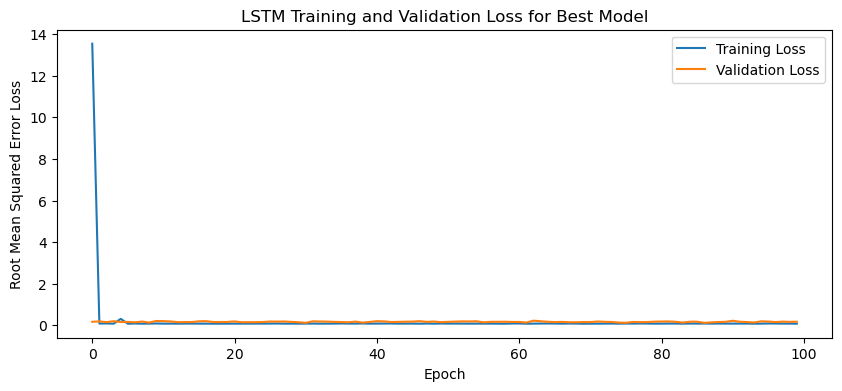

1/1 - 2s - loss: 0.0647 - 2s/epoch - 2s/step
Test Loss: 0.06471481174230576
1/1 [==============================] - 0s 31ms/step


IndexError: index 10 is out of bounds for axis 0 with size 10

In [3]:
n_batch = 1
nb_epoch = 100

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def mape (y_true, y_pred):
    return 100*K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def pearson (y_true, y_pred):
    return (K.square(K.mean((y_true - K.mean(y_true))*(y_pred - K.mean(y_pred)))))/(K.mean(K.square(y_true - K.mean(y_true)))*K.mean(K.square(y_pred - K.mean(y_pred))))
 
# fit an LSTM network to training data
#Adapted from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch):

    cv_accuracies = []
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters to be tuned by Optuna (taken from Javier Leon's dissertation 'Fruit Prices')
    lr = trial.suggest_float('lr', 1e-3, 1, log=True)
    optimizer_name = trial.suggest_categorical('optimizer', ['Adam', 'RMSprop', 'SGD'])
    if optimizer_name == 'Adam':
        optimizer = Adam(learning_rate=lr)
    elif optimizer_name == 'RMSprop':
        optimizer = RMSprop(learning_rate=lr)
    else:
        optimizer = SGD(learning_rate=lr)
    
    #Optuna will try either Rectified Linear Unit (ReLU) = max(0, x), tanh, or sigmoid functions
    activation_function = trial.suggest_categorical('activation_function', ['relu', 'tanh', 'sigmoid'])
    
    lstm_units = trial.suggest_categorical('lstm_units', [256, 512, 1024])
    dropout_rate = trial.suggest_float('dropout_rate', 0.1, 0.5)

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer)
        
    return model

# make forecast with the LSTM best model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # invert first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # propagate difference forecast using inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create array from forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i - 1
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(test, forecasts, n_lag, n_seq):
    rmse_list = []
    mae_list = []
    mape_list = []
    r2_list = []
    for i in range(n_seq):
        actual = [row[i] for row in test]
        predicted = [forecast[i] for forecast in forecasts]
        rmse = sqrt(mean_squared_error(actual, predicted))
        mae = mean_absolute_error(actual, predicted)
        mse = mean_squared_error(actual, predicted)
        mape = mean_absolute_percentage_error(actual, predicted)
        r2 = r2_score(actual, predicted) 
        rmse_list.append(rmse)
        mae_list.append(mae)
        mape_list.append(mape)
        r2_list.append(r2)
        print("Month at t+"+str(i+1)+":")
        print('t+%d RMSE: %f' % ((i+1), rmse))
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d MAPE: %f' % ((i+1), mape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))

    return rmse_list, mae_list, mape_list, r2_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, n_test):
    # plot the entire dataset in blue
    plt.plot(series.values)
    # plot the forecasts in red
    for i in range(len(forecasts)):
        off_s = len(series) - n_test + i - 1
        off_e = off_s + len(forecasts[i]) + 1
        xaxis = [x for x in range(off_s, off_e)]
        yaxis = [series.values[off_s]] + forecasts[i]
        plt.plot(xaxis, yaxis, color='red')
    # show the plot
    plt.show()
    
def objective(trial):
    
    cv_accuracies = []
        
    for i in range(5):
        train1 = train[i]
        test1 = test[i]
        validation1 = validation[i]

        X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
        X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
        X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq:]
        X = X.reshape(X.shape[0], 1, X.shape[1])
        X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
        X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])
    
        model = create_model(trial, X, y, n_lag, n_seq, n_batch, nb_epoch)

        history = model.fit(X, y, validation_data=(X_val, y_val), epochs=nb_epoch, verbose=0)

        cv_accuracy = model.evaluate(X_test, y_test, verbose=0)
    
        loss = history.history['val_loss'][-1]
    
        # Plotting the training and validation loss
        #plt.figure(figsize=(10, 4))
        #plt.plot(history.history['loss'], label='Training Loss')
        #plt.plot(history.history['val_loss'], label='Validation Loss')
        #title1 = "LSTM Training and Validation Loss for Fold " + str(i+1)
        #plt.title(title1)
        #plt.xlabel('Epoch')
        #plt.ylabel('Root Mean Squared Error Loss')
        #plt.legend()
        #plt.show()
            
        cv_accuracies.append(cv_accuracy)
    
    print("Cross Validation Accuracies:")
    print(cv_accuracies)
    print("Mean Cross Validation Accuracy:")
    print(np.mean(cv_accuracies))
    print("Standard Deviation of Cross Validation Accuracy:")
    print(np.std(cv_accuracies))
        
    return np.mean(cv_accuracies)

n_batch = 1
nb_epoch = 100

# optimize and fit model
study = optuna.create_study(direction='minimize')
study.optimize(objective, n_trials=100)
print('Number of finished trials:', len(study.trials))

print('Best trial:', study.best_trial.params)
best_params = study.best_params
print("Best hyperparameters: ", best_params)

for i in range(5):
    print("Fold "+str(i+1)+":")
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X, y = train1[:, 0:-n_seq], train1[:, -n_seq:]
    X_test, y_test = test1[:, 0:-n_seq], test1[:, -n_seq:]
    X_val, y_val = validation1[:, 0:-n_seq], validation1[:, -n_seq]

    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)
    
    X = X.reshape(X.shape[0], 1, X.shape[1])
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_model(optuna.trial.FixedTrial(best_params), X, y, n_lag, n_seq, n_batch, nb_epoch)
    history=best_model.fit(X, y, epochs=nb_epoch, batch_size=n_batch, validation_data=(X_val, y_val))

    # Plotting the training and validation loss
    plt.figure(figsize=(10, 4))
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title1 = "LSTM Training and Validation Loss for Best Model"
    plt.title(title1)
    plt.xlabel('Epoch')
    plt.ylabel('Root Mean Squared Error Loss')
    plt.legend()
    plt.show()

    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test+2, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test+2, n_seq)

    rmse_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores root mean squared errors for each future time prediction
    mape_list = [] # list stores root mean squared errors for each future time prediction
    r2_list = [] # list stores root mean squared errors for each future time prediction
    
    # evaluate forecasts
    rmse_list, mae_list, mape_list, r2_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    for j in range(len(X_test)):
        print("Weather Station "+str(j+1)+":")
        dataset_df = pd.DataFrame(y_test[j].flatten())
        dataset = dataset_df.values
        dataset = dataset[:, 0]
        dataset = np.array(dataset).reshape(-1, 1)
        dataset = dataset.flatten()
        dataset = pd.DataFrame(dataset)
        series = scaler[i].inverse_transform(dataset)
        series = pd.Series(series.flatten())

    # plot forecasts
    plot_forecasts(series, forecasts, 1)
    
    best_model.summary()

    # Print out table of actual and predicted values for each weather station
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")

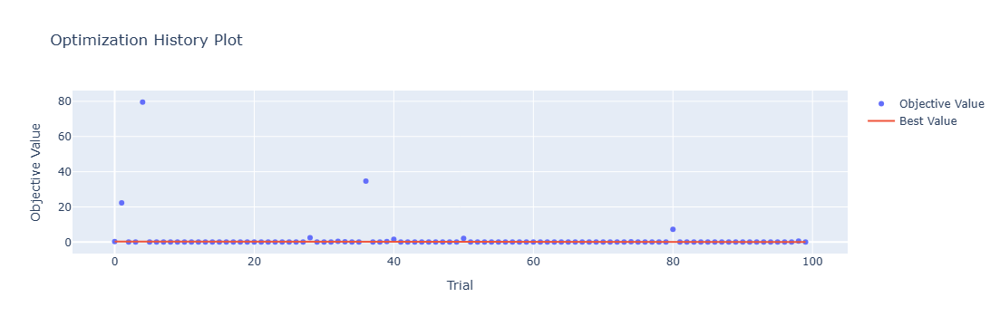

In [4]:
optuna.visualization.plot_optimization_history(study)

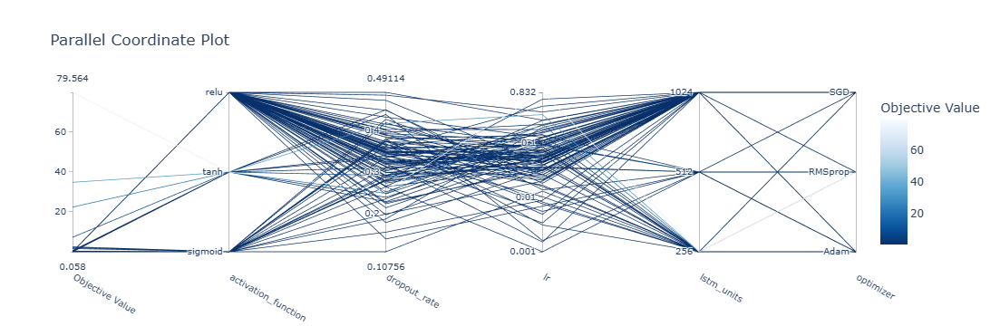

In [5]:
optuna.visualization.plot_parallel_coordinate(study)

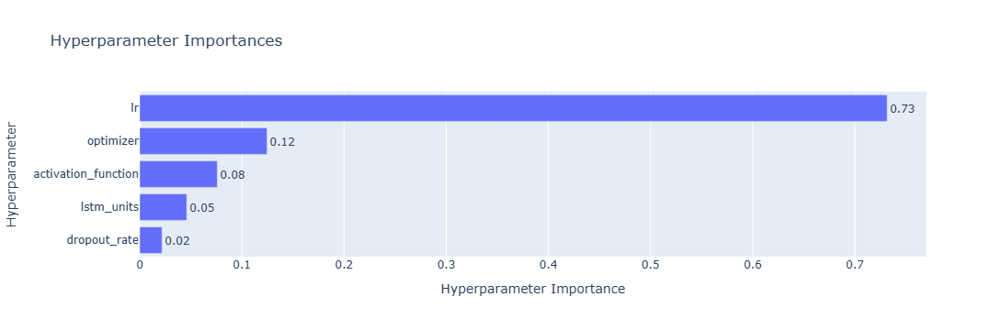

In [6]:
optuna.visualization.plot_param_importances(study)

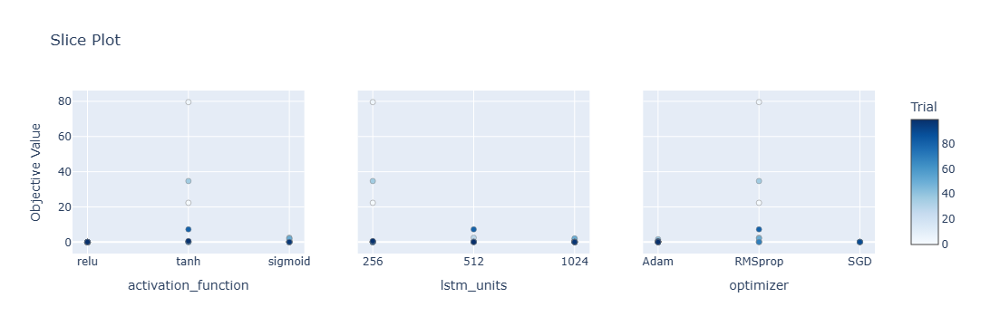

In [7]:
optuna.visualization.plot_slice(study, params=['optimizer', 'activation_function', 'lstm_units'])

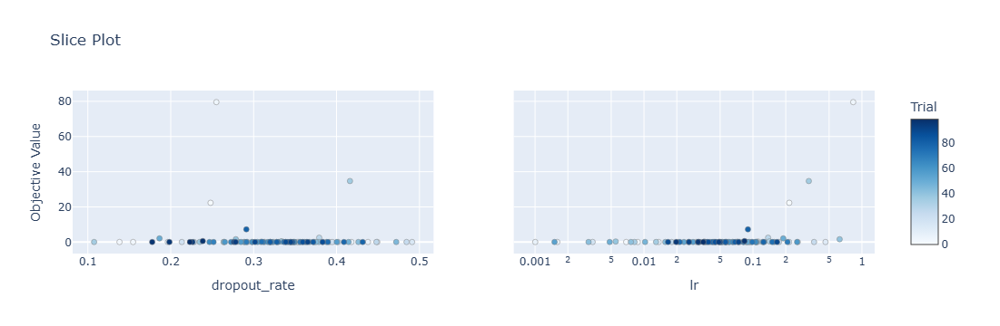

In [8]:
optuna.visualization.plot_slice(study, params=['lr', 'dropout_rate'])

[[12.21  8.17 15.68 ... 23.86 20.59 15.82]
 [14.52 12.85 16.77 ... 26.49 23.17 21.15]
 [ 8.91  6.23 11.39 ... 22.62 16.72 14.05]
 ...
 [ 7.87  5.76 10.62 ... 21.07 15.24 12.04]
 [ 6.49  2.73  9.77 ... 21.93 16.5  11.44]
 [ 5.29  1.27  5.84 ... 22.11 15.37  9.87]]
Epoch 1/100
84/84 [==============================] - 51s 404ms/step - loss: 11.9964 - accuracy: 0.5119 - mae: 11.7512 - rmse: 11.9964 - mape: 2674.0933 - pearson: 0.6019 - val_loss: 0.1121 - val_accuracy: 0.6000 - val_mae: 0.0845 - val_rmse: 0.1121 - val_mape: 18.8542 - val_pearson: 0.7012
Epoch 2/100
84/84 [==============================] - 23s 278ms/step - loss: 0.2298 - accuracy: 0.6310 - mae: 0.1966 - rmse: 0.2298 - mape: 41.9235 - pearson: 0.7466 - val_loss: 0.0882 - val_accuracy: 0.6000 - val_mae: 0.0731 - val_rmse: 0.0882 - val_mape: 16.8743 - val_pearson: 0.7579
Epoch 3/100
84/84 [==============================] - 26s 306ms/step - loss: 0.0773 - accuracy: 0.6548 - mae: 0.0616 - rmse: 0.0773 - mape: 13.7095 - pearson: 0

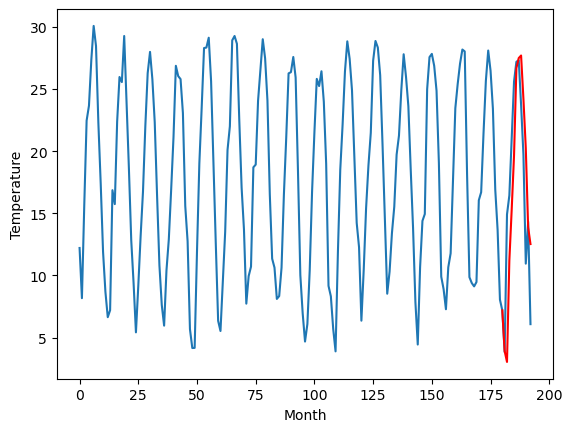

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.87		10.84		-2.03
12.78		9.96		-2.82
17.84		18.11		0.27
19.24		22.22		2.98
23.26		26.60		3.34
26.74		33.60		6.86
27.96		34.41		6.45
28.30		34.62		6.32
26.17		31.11		4.94
23.54		27.17		3.63
18.03		20.80		2.77
17.79		19.45		1.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[13.23, 10.836262664794923, 9.96073677301407, 18.108231089115144, 22.219202539920808, 26.59530832529068, 33.60362245798111, 34.41353984832764, 34.61963803231716, 31.109295195937158, 27.165901965498925, 20.79982740342617, 19.44546861112118]


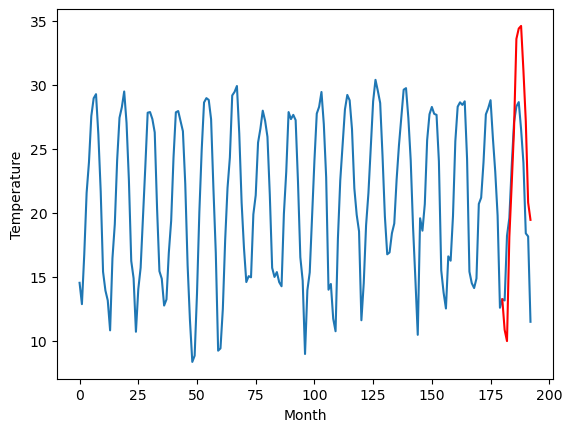

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.34		13.15		-2.19
16.20		12.27		-3.93
22.18		20.42		-1.76
23.82		24.53		0.71
27.80		28.91		1.11
31.94		35.91		3.97
33.70		36.72		3.02
33.98		36.93		2.95
30.41		33.42		3.01
26.53		29.48		2.95
18.17		23.11		4.94
20.35		21.76		1.41
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.18, 13.146262664794921, 12.270736773014068, 20.418231089115142, 24.529202539920806, 28.90530832529068, 35.913622457981106, 36.72353984832763, 36.92963803231716, 33.41929519593715, 29.47590196549892, 23.109827403426166, 21.755468611121174]


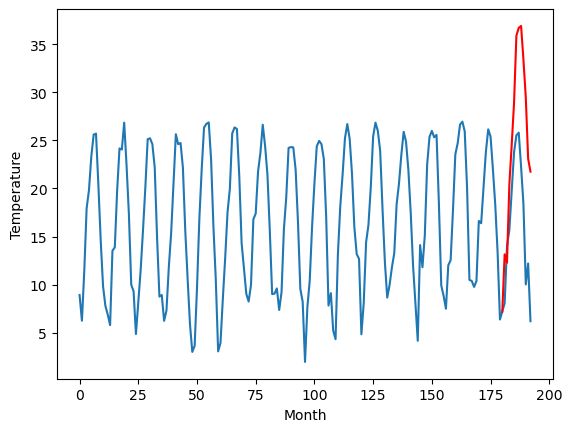

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.00		7.54		-1.46
7.43		6.66		-0.77
15.34		14.81		-0.53
17.13		18.92		1.79
21.10		23.30		2.20
24.38		30.30		5.92
25.01		31.11		6.10
25.06		31.32		6.26
22.55		27.81		5.26
20.24		23.87		3.63
12.15		17.50		5.35
14.92		16.15		1.23
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.46, 7.536262664794922, 6.660736773014069, 14.808231089115143, 18.919202539920807, 23.29530832529068, 30.30362245798111, 31.113539848327637, 31.31963803231716, 27.809295195937157, 23.865901965498924, 17.49982740342617, 16.145468611121178]


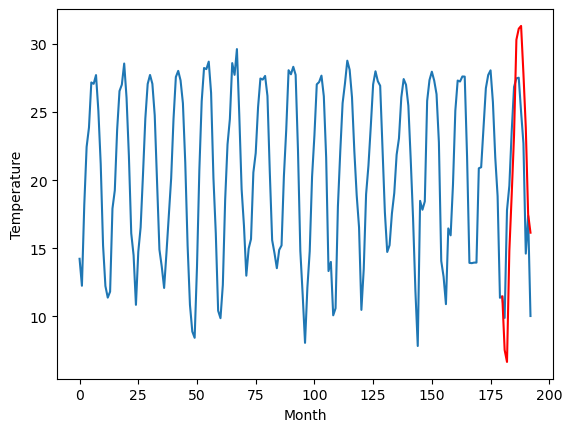

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		12.86		-0.49
10.26		11.98		1.72
20.16		20.13		-0.03
22.09		24.24		2.15
25.95		28.62		2.67
31.15		35.62		4.47
31.58		36.43		4.85
32.34		36.64		4.30
30.33		33.13		2.80
25.98		29.19		3.21
18.41		22.82		4.41
20.74		21.47		0.73
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.27, 12.856262664794922, 11.980736773014069, 20.128231089115143, 24.239202539920807, 28.61530832529068, 35.623622457981114, 36.43353984832764, 36.639638032317166, 33.12929519593716, 29.18590196549893, 22.819827403426174, 21.46546861112118]


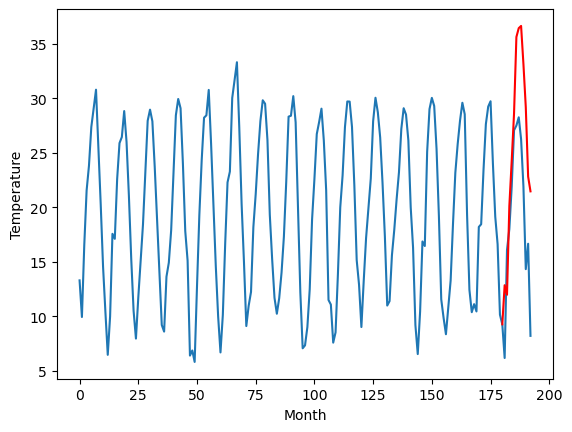

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.52		11.93		0.41
12.17		11.05		-1.12
17.07		19.20		2.13
20.44		23.31		2.87
23.95		27.69		3.74
28.52		34.69		6.17
30.51		35.50		4.99
30.99		35.71		4.72
27.98		32.20		4.22
24.38		28.26		3.88
16.21		21.89		5.68
17.26		20.54		3.28
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.77, 11.926262664794923, 11.05073677301407, 19.198231089115144, 23.309202539920808, 27.68530832529068, 34.69362245798111, 35.503539848327634, 35.70963803231716, 32.199295195937154, 28.25590196549892, 21.889827403426168, 20.535468611121175]


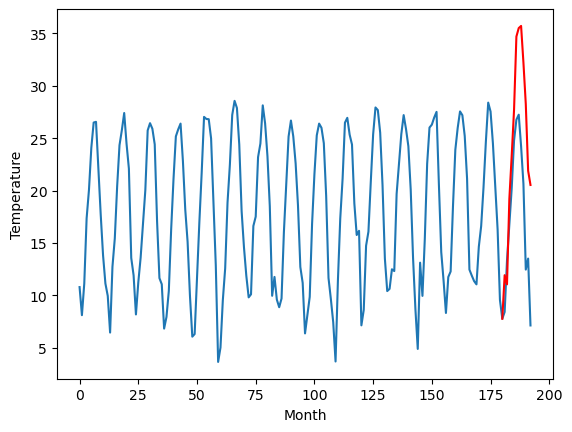

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.21		9.42		-0.79
10.85		8.54		-2.31
17.83		16.69		-1.14
18.86		20.80		1.94
22.57		25.18		2.61
26.90		32.18		5.28
28.52		32.99		4.47
28.46		33.20		4.74
24.41		29.69		5.28
21.18		25.75		4.57
12.53		19.38		6.85
14.47		18.03		3.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 9.416262664794921, 8.540736773014068, 16.688231089115142, 20.799202539920806, 25.17530832529068, 32.18362245798111, 32.993539848327636, 33.19963803231716, 29.689295195937156, 25.745901965498923, 19.37982740342617, 18.025468611121177]


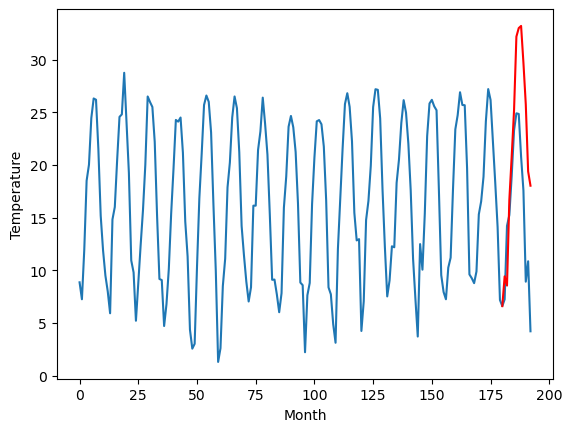

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.91		7.48		-0.43
8.53		6.60		-1.93
15.05		14.75		-0.30
18.68		18.86		0.18
21.70		23.24		1.54
26.49		30.24		3.75
28.61		31.05		2.44
28.56		31.26		2.70
24.05		27.75		3.70
20.20		23.81		3.61
10.70		17.44		6.74
12.76		16.09		3.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.3, 7.4762626647949215, 6.600736773014068, 14.748231089115142, 18.85920253992081, 23.23530832529068, 30.24362245798111, 31.053539848327638, 31.259638032317163, 27.749295195937158, 23.805901965498926, 17.43982740342617, 16.08546861112118]


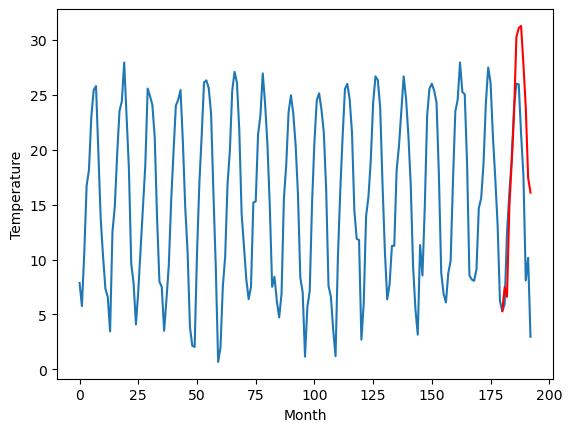

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.08		6.50		-0.58
2.81		5.62		2.81
15.28		13.77		-1.51
17.88		17.88		-0.00
22.57		22.26		-0.31
28.76		29.26		0.50
29.33		30.07		0.74
29.27		30.28		1.01
25.53		26.77		1.24
21.57		22.83		1.26
11.53		16.46		4.93
13.33		15.11		1.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.1, 6.496262664794922, 5.620736773014069, 13.768231089115144, 17.879202539920808, 22.25530832529068, 29.26362245798111, 30.073539848327638, 30.279638032317163, 26.769295195937158, 22.825901965498925, 16.45982740342617, 15.105468611121179]


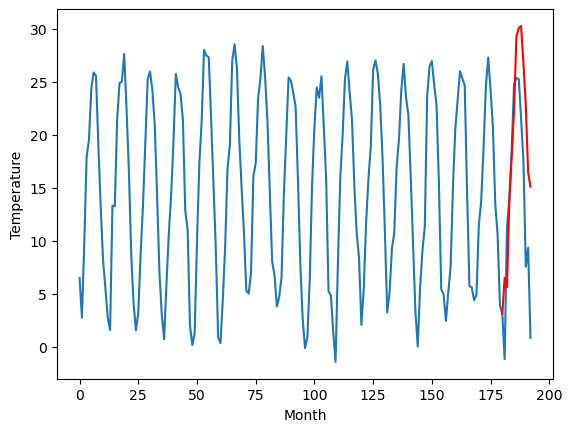

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
4.90		5.12		0.22
2.73		4.24		1.51
13.48		12.39		-1.09
16.54		16.50		-0.04
21.01		20.88		-0.13
27.49		27.88		0.39
28.50		28.69		0.19
29.10		28.90		-0.20
25.24		25.39		0.15
20.77		21.45		0.68
10.11		15.08		4.97
11.34		13.73		2.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.6, 5.116262664794922, 4.240736773014069, 12.388231089115143, 16.49920253992081, 20.875308325290682, 27.88362245798111, 28.69353984832764, 28.899638032317164, 25.38929519593716, 21.445901965498926, 15.079827403426172, 13.72546861112118]


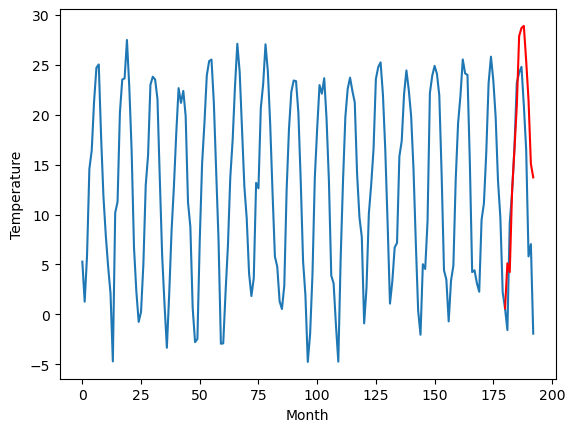

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.68		3.92		0.24
-0.63		3.04		3.67
11.10		11.19		0.09
15.07		15.30		0.23
20.22		19.68		-0.54
27.53		26.68		-0.85
28.12		27.49		-0.63
28.83		27.70		-1.13
24.78		24.19		-0.59
20.43		20.25		-0.18
9.57		13.88		4.31
8.67		12.53		3.86
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.75, 3.916262664794922, 3.0407367730140686, 11.188231089115142, 15.299202539920806, 19.67530832529068, 26.68362245798111, 27.493539848327636, 27.69963803231716, 24.189295195937156, 20.245901965498923, 13.87982740342617, 12.525468611121177]


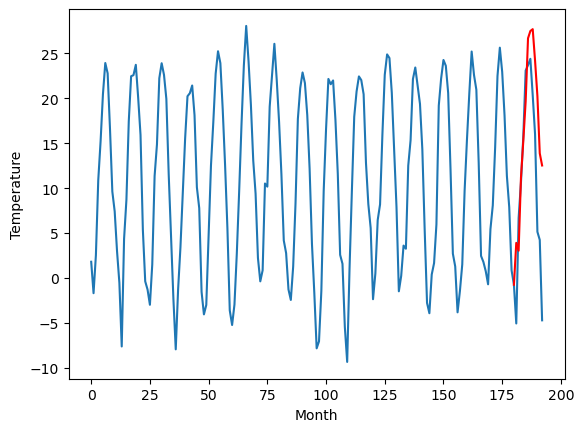

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    4.43   3.916263
1                 1   12.87  10.836263
2                 2   15.34  13.146263
3                 3    9.00   7.536263
4                 4   13.35  12.856263
5                 5   11.52  11.926263
6                 6   10.21   9.416263
7                 7    7.91   7.476263
8                 8    7.08   6.496263
9                 9    4.90   5.116263
10               10    3.68   3.916263


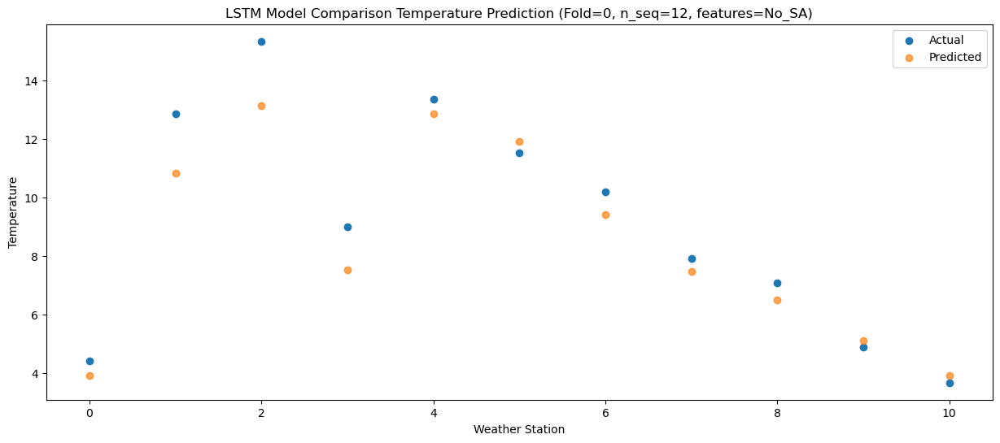

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    1.08   3.040737
1                 1   12.78   9.960737
2                 2   16.20  12.270737
3                 3    7.43   6.660737
4                 4   10.26  11.980737
5                 5   12.17  11.050737
6                 6   10.85   8.540737
7                 7    8.53   6.600737
8                 8    2.81   5.620737
9                 9    2.73   4.240737
10               10   -0.63   3.040737


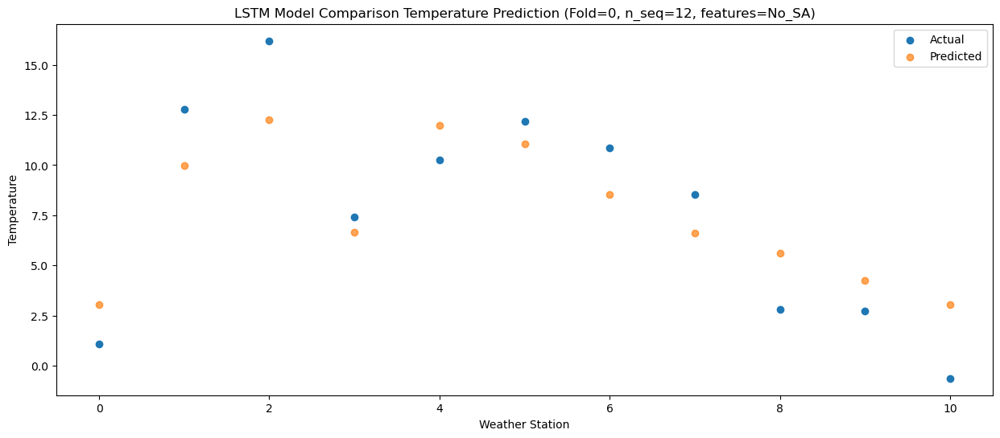

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   12.15  11.188231
1                 1   17.84  18.108231
2                 2   22.18  20.418231
3                 3   15.34  14.808231
4                 4   20.16  20.128231
5                 5   17.07  19.198231
6                 6   17.83  16.688231
7                 7   15.05  14.748231
8                 8   15.28  13.768231
9                 9   13.48  12.388231
10               10   11.10  11.188231


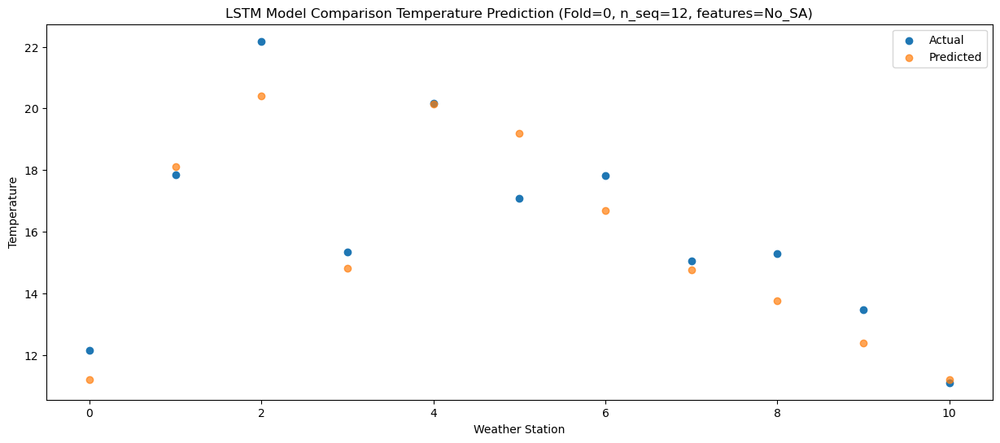

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.68  15.299203
1                 1   19.24  22.219203
2                 2   23.82  24.529203
3                 3   17.13  18.919203
4                 4   22.09  24.239203
5                 5   20.44  23.309203
6                 6   18.86  20.799203
7                 7   18.68  18.859203
8                 8   17.88  17.879203
9                 9   16.54  16.499203
10               10   15.07  15.299203


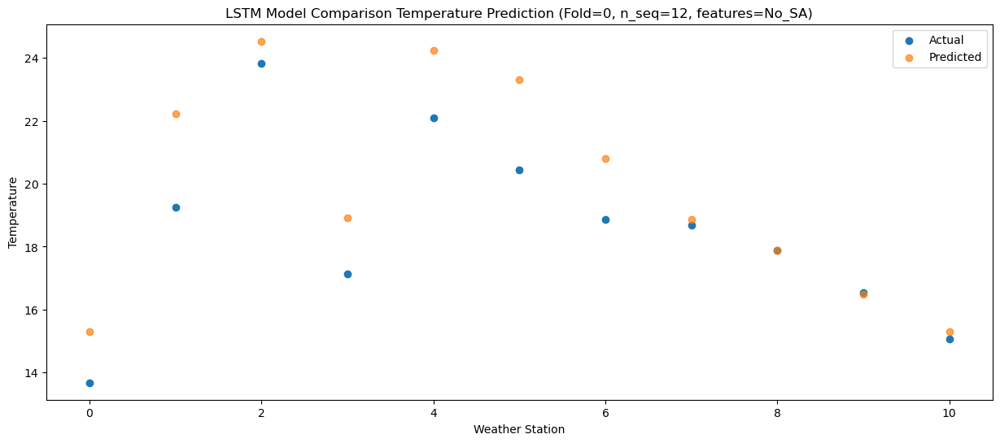

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   18.18  19.675308
1                 1   23.26  26.595308
2                 2   27.80  28.905308
3                 3   21.10  23.295308
4                 4   25.95  28.615308
5                 5   23.95  27.685308
6                 6   22.57  25.175308
7                 7   21.70  23.235308
8                 8   22.57  22.255308
9                 9   21.01  20.875308
10               10   20.22  19.675308


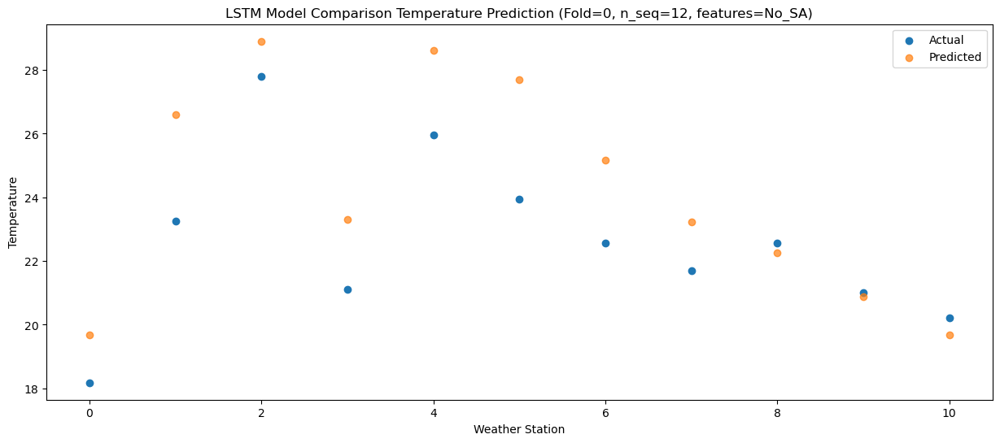

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   22.85  26.683622
1                 1   26.74  33.603622
2                 2   31.94  35.913622
3                 3   24.38  30.303622
4                 4   31.15  35.623622
5                 5   28.52  34.693622
6                 6   26.90  32.183622
7                 7   26.49  30.243622
8                 8   28.76  29.263622
9                 9   27.49  27.883622
10               10   27.53  26.683622


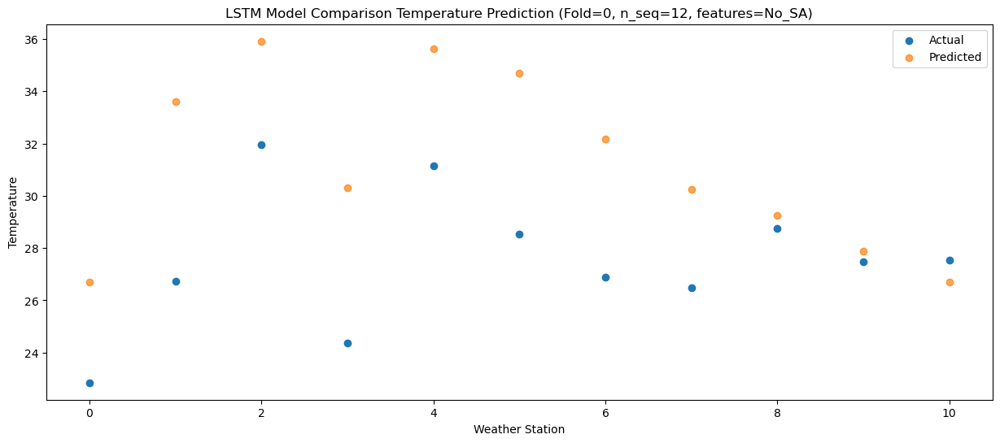

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.44   27.49354
1                 1   27.96   34.41354
2                 2   33.70   36.72354
3                 3   25.01   31.11354
4                 4   31.58   36.43354
5                 5   30.51   35.50354
6                 6   28.52   32.99354
7                 7   28.61   31.05354
8                 8   29.33   30.07354
9                 9   28.50   28.69354
10               10   28.12   27.49354


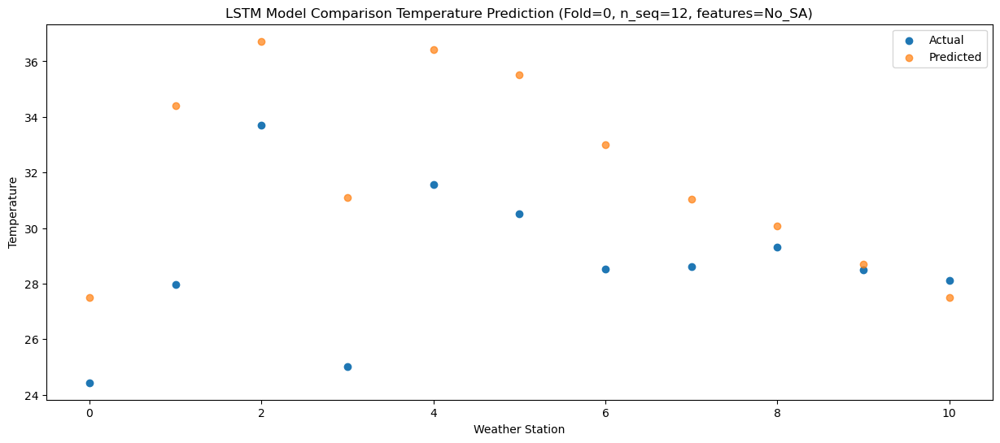

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.55  27.699638
1                 1   28.30  34.619638
2                 2   33.98  36.929638
3                 3   25.06  31.319638
4                 4   32.34  36.639638
5                 5   30.99  35.709638
6                 6   28.46  33.199638
7                 7   28.56  31.259638
8                 8   29.27  30.279638
9                 9   29.10  28.899638
10               10   28.83  27.699638


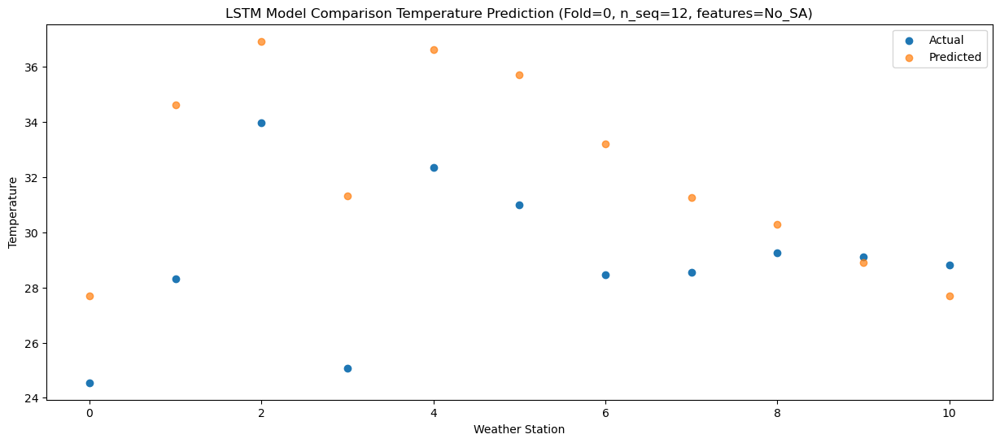

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   20.97  24.189295
1                 1   26.17  31.109295
2                 2   30.41  33.419295
3                 3   22.55  27.809295
4                 4   30.33  33.129295
5                 5   27.98  32.199295
6                 6   24.41  29.689295
7                 7   24.05  27.749295
8                 8   25.53  26.769295
9                 9   25.24  25.389295
10               10   24.78  24.189295


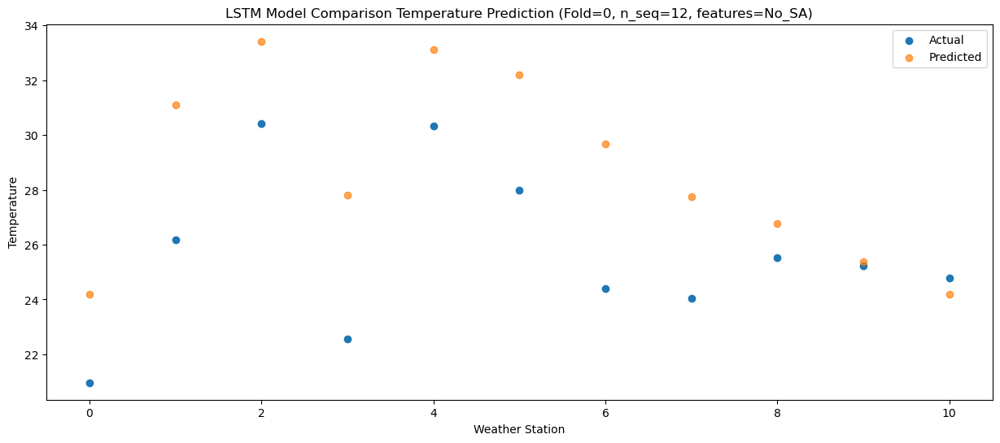

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.95  20.245902
1                 1   23.54  27.165902
2                 2   26.53  29.475902
3                 3   20.24  23.865902
4                 4   25.98  29.185902
5                 5   24.38  28.255902
6                 6   21.18  25.745902
7                 7   20.20  23.805902
8                 8   21.57  22.825902
9                 9   20.77  21.445902
10               10   20.43  20.245902


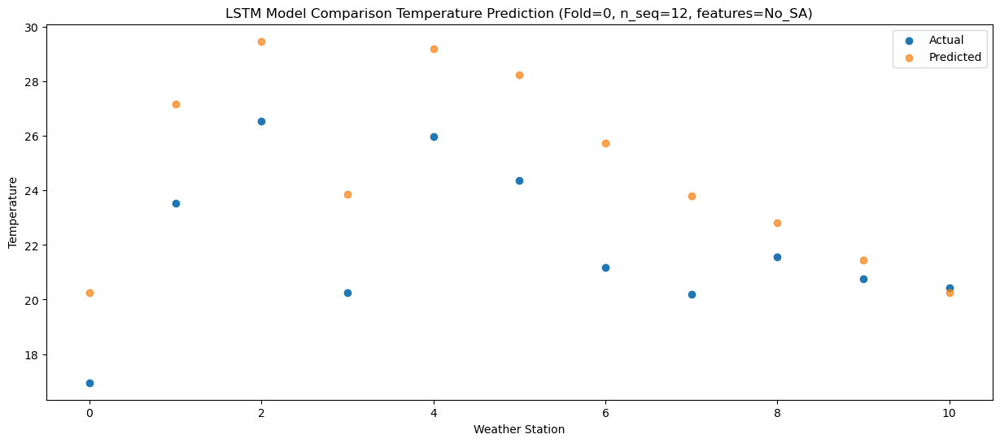

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    8.19  13.879827
1                 1   18.03  20.799827
2                 2   18.17  23.109827
3                 3   12.15  17.499827
4                 4   18.41  22.819827
5                 5   16.21  21.889827
6                 6   12.53  19.379827
7                 7   10.70  17.439827
8                 8   11.53  16.459827
9                 9   10.11  15.079827
10               10    9.57  13.879827


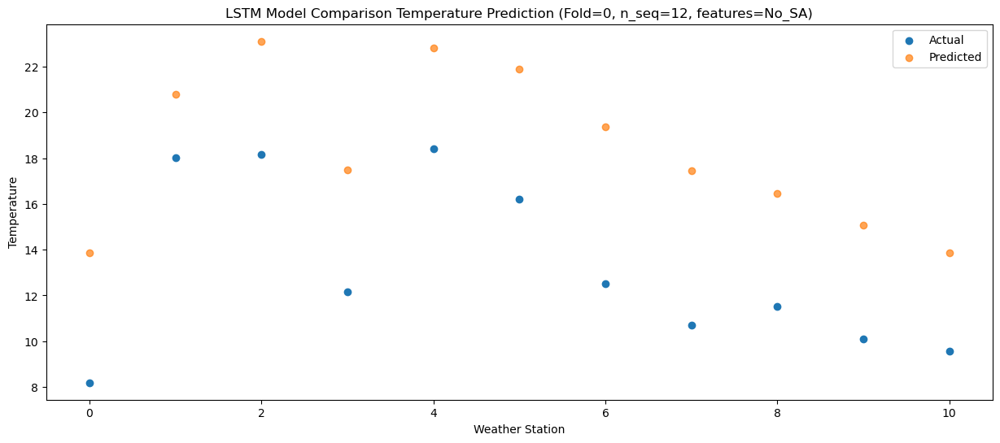

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   11.57  12.525469
1                 1   17.79  19.445469
2                 2   20.35  21.755469
3                 3   14.92  16.145469
4                 4   20.74  21.465469
5                 5   17.26  20.535469
6                 6   14.47  18.025469
7                 7   12.76  16.085469
8                 8   13.33  15.105469
9                 9   11.34  13.725469
10               10    8.67  12.525469


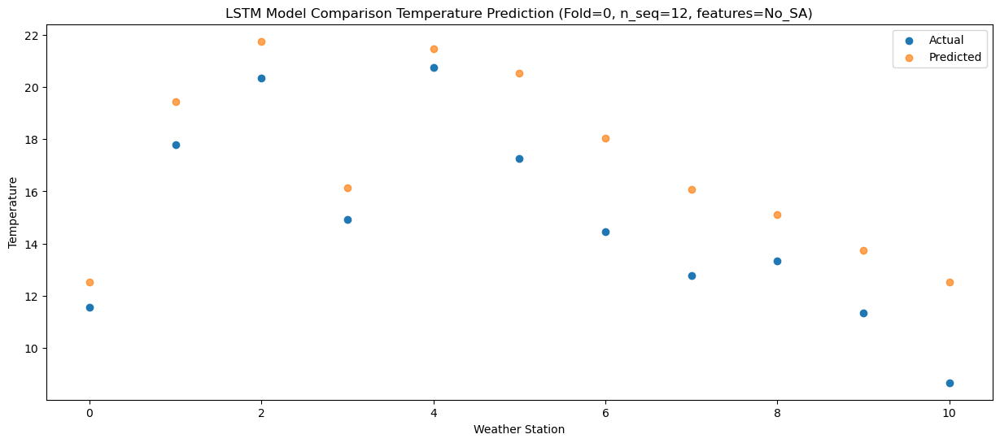

f, t:
[[ 4.43 12.87 15.34  9.   13.35 11.52 10.21  7.91  7.08  4.9   3.68]
 [ 1.08 12.78 16.2   7.43 10.26 12.17 10.85  8.53  2.81  2.73 -0.63]
 [12.15 17.84 22.18 15.34 20.16 17.07 17.83 15.05 15.28 13.48 11.1 ]
 [13.68 19.24 23.82 17.13 22.09 20.44 18.86 18.68 17.88 16.54 15.07]
 [18.18 23.26 27.8  21.1  25.95 23.95 22.57 21.7  22.57 21.01 20.22]
 [22.85 26.74 31.94 24.38 31.15 28.52 26.9  26.49 28.76 27.49 27.53]
 [24.44 27.96 33.7  25.01 31.58 30.51 28.52 28.61 29.33 28.5  28.12]
 [24.55 28.3  33.98 25.06 32.34 30.99 28.46 28.56 29.27 29.1  28.83]
 [20.97 26.17 30.41 22.55 30.33 27.98 24.41 24.05 25.53 25.24 24.78]
 [16.95 23.54 26.53 20.24 25.98 24.38 21.18 20.2  21.57 20.77 20.43]
 [ 8.19 18.03 18.17 12.15 18.41 16.21 12.53 10.7  11.53 10.11  9.57]
 [11.57 17.79 20.35 14.92 20.74 17.26 14.47 12.76 13.33 11.34  8.67]]
[[ 3.91626266 10.83626266 13.14626266  7.53626266 12.85626266 11.92626266
   9.41626266  7.47626266  6.49626266  5.11626266  3.91626266]
 [ 3.04073677  9.96073677 12

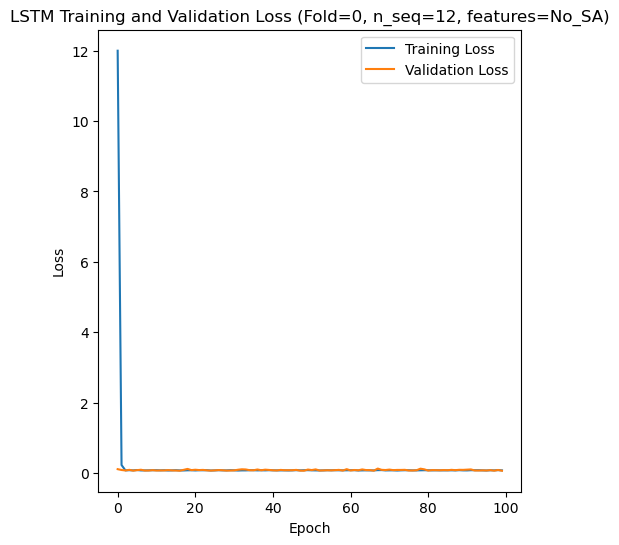

[[12.2  10.03 13.86 ... 24.46 19.58 17.03]
 [ 8.35  6.22 11.74 ... 22.47 18.02 13.98]
 [10.82  7.37 13.36 ... 24.57 19.57 16.15]
 ...
 [ 7.69  4.56 11.66 ... 25.3  19.83 13.28]
 [ 8.93  6.7  14.14 ... 25.37 21.51 12.55]
 [ 7.96  5.46 11.14 ... 25.13 20.28 10.63]]
Epoch 1/100
84/84 [==============================] - 66s 395ms/step - loss: 13.6335 - accuracy: 0.4405 - mae: 13.3200 - rmse: 13.6335 - mape: 3074.0259 - pearson: 0.5110 - val_loss: 0.0757 - val_accuracy: 0.8000 - val_mae: 0.0580 - val_rmse: 0.0757 - val_mape: 13.6692 - val_pearson: 0.8160
Epoch 2/100
84/84 [==============================] - 25s 294ms/step - loss: 0.0827 - accuracy: 0.6071 - mae: 0.0656 - rmse: 0.0827 - mape: 15.0258 - pearson: 0.7404 - val_loss: 0.0768 - val_accuracy: 0.8000 - val_mae: 0.0602 - val_rmse: 0.0768 - val_mape: 12.9713 - val_pearson: 0.8044
Epoch 3/100
84/84 [==============================] - 25s 302ms/step - loss: 0.0791 - accuracy: 0.5952 - mae: 0.0607 - rmse: 0.0791 - mape: 13.8404 - pearson: 0

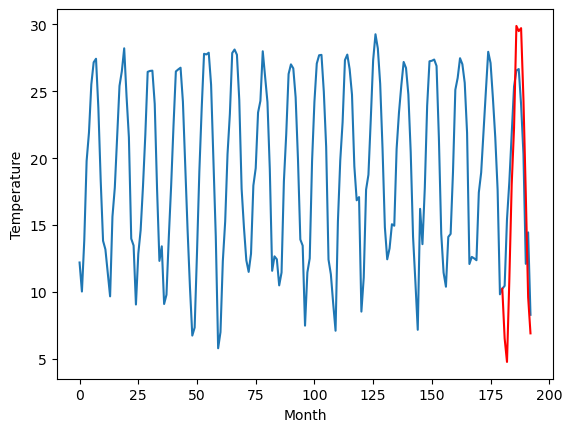

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.00		10.76		-1.24
12.66		9.01		-3.65
19.43		15.18		-4.25
21.57		22.27		0.70
25.30		26.50		1.20
29.44		34.12		4.68
30.82		33.74		2.92
31.09		33.96		2.87
27.35		28.66		1.31
23.57		21.58		-1.99
15.91		13.85		-2.06
17.54		11.14		-6.40
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.41, 10.763248395919799, 9.009080839157104, 15.184081983566283, 22.26823945045471, 26.496655893325805, 34.123280954360965, 33.73590461611748, 33.95726772844792, 28.66004940569401, 21.581225362420085, 13.853049245476726, 11.144225326180461]


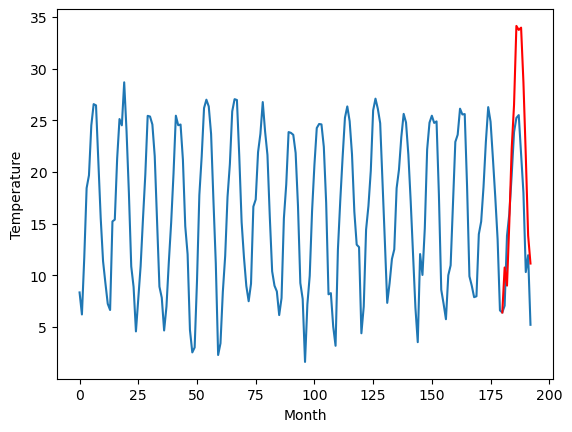

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.77		6.91		-1.86
9.26		5.16		-4.10
16.32		11.33		-4.99
17.72		18.42		0.70
21.84		22.65		0.81
25.72		30.27		4.55
26.49		29.89		3.40
27.15		30.11		2.96
24.13		24.81		0.68
20.35		17.73		-2.62
12.61		10.00		-2.61
15.21		7.29		-7.92
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.6, 6.9132483959197994, 5.159080839157104, 11.334081983566284, 18.418239450454713, 22.646655893325807, 30.273280954360963, 29.88590461611748, 30.107267728447916, 24.81004940569401, 17.731225362420084, 10.003049245476724, 7.2942253261804595]


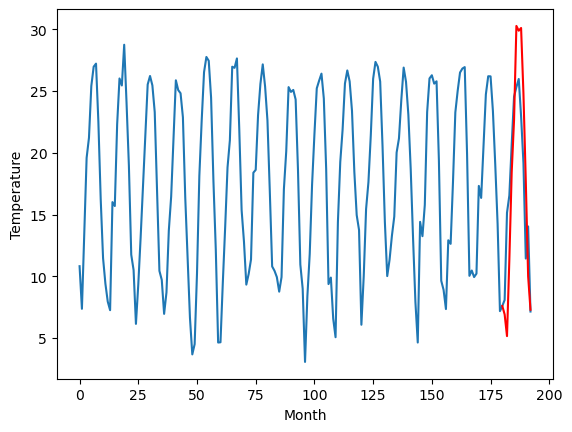

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.72		9.38		-1.34
9.13		7.63		-1.50
16.50		13.80		-2.70
18.84		20.89		2.05
22.73		25.12		2.39
26.62		32.74		6.12
26.50		32.36		5.86
27.47		32.58		5.11
24.46		27.28		2.82
21.77		20.20		-1.57
14.61		12.47		-2.14
17.98		9.76		-8.22
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.89, 9.3832483959198, 7.629080839157105, 13.804081983566284, 20.888239450454712, 25.116655893325806, 32.74328095436096, 32.35590461611748, 32.577267728447914, 27.280049405694008, 20.201225362420082, 12.473049245476723, 9.764225326180458]


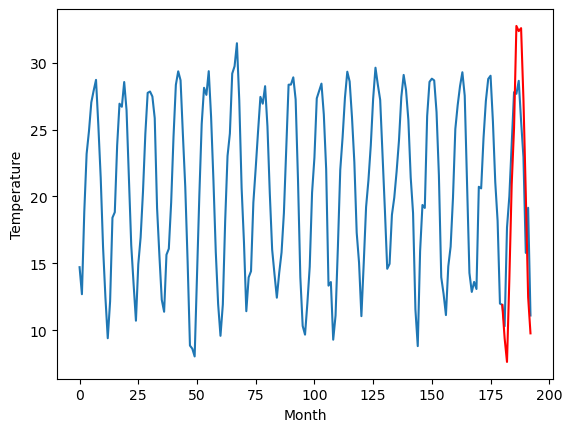

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.70		13.27		-1.43
13.00		11.52		-1.48
20.61		17.69		-2.92
22.91		24.78		1.87
27.03		29.01		1.98
30.50		36.63		6.13
30.59		36.25		5.66
31.56		36.47		4.91
27.98		31.17		3.19
24.94		24.09		-0.85
17.39		16.36		-1.03
21.27		13.65		-7.62
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.96, 13.2732483959198, 11.519080839157105, 17.694081983566285, 24.778239450454713, 29.006655893325807, 36.63328095436096, 36.24590461611748, 36.467267728447915, 31.17004940569401, 24.091225362420083, 16.363049245476724, 13.654225326180459]


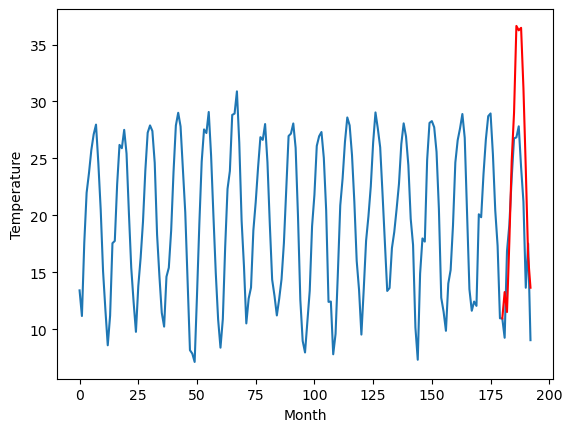

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.91		11.98		0.07
12.29		10.23		-2.06
19.63		16.40		-3.23
21.90		23.49		1.59
27.49		27.72		0.23
31.76		35.34		3.58
31.10		34.96		3.86
30.51		35.18		4.67
30.15		29.88		-0.27
25.83		22.80		-3.03
19.36		15.07		-4.29
19.62		12.36		-7.26
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 11.9832483959198, 10.229080839157104, 16.404081983566286, 23.488239450454714, 27.716655893325807, 35.343280954360964, 34.95590461611748, 35.177267728447916, 29.88004940569401, 22.801225362420084, 15.073049245476724, 12.36422532618046]


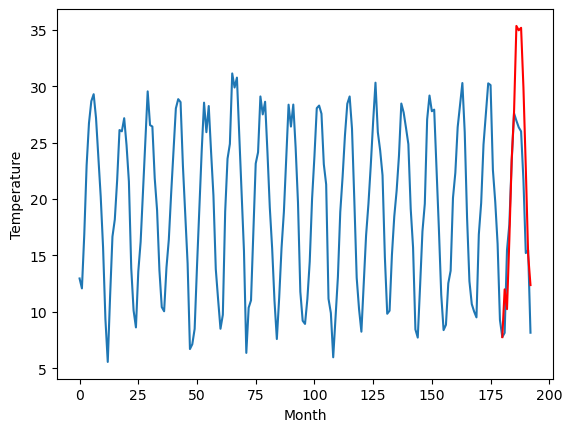

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.75		11.51		-1.24
13.53		9.76		-3.77
19.81		15.93		-3.88
22.38		23.02		0.64
26.15		27.25		1.10
30.16		34.87		4.71
31.52		34.49		2.97
31.78		34.71		2.93
28.45		29.41		0.96
24.50		22.33		-2.17
16.90		14.60		-2.30
18.42		11.89		-6.53
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.17, 11.513248395919799, 9.759080839157104, 15.934081983566283, 23.01823945045471, 27.246655893325805, 34.873280954360965, 34.48590461611748, 34.70726772844792, 29.41004940569401, 22.331225362420085, 14.603049245476726, 11.894225326180461]


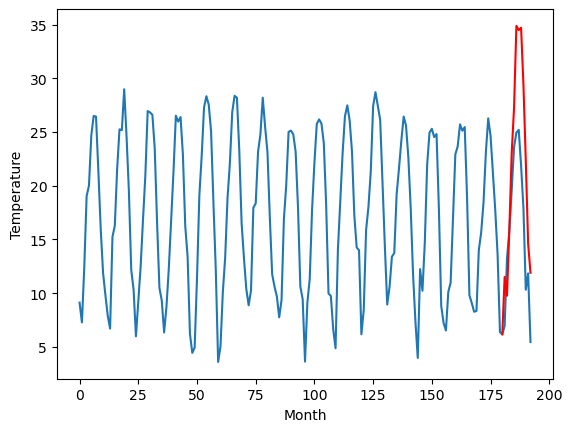

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.81		7.68		-1.13
5.81		5.93		0.12
17.13		12.10		-5.03
18.84		19.19		0.35
23.50		23.42		-0.08
29.58		31.04		1.46
30.57		30.66		0.09
31.79		30.88		-0.91
28.08		25.58		-2.50
22.88		18.50		-4.38
13.58		10.77		-2.81
15.99		8.06		-7.93
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.57, 7.683248395919799, 5.929080839157104, 12.104081983566283, 19.18823945045471, 23.416655893325803, 31.04328095436096, 30.655904616117475, 30.87726772844791, 25.580049405694005, 18.50122536242008, 10.77304924547672, 8.064225326180456]


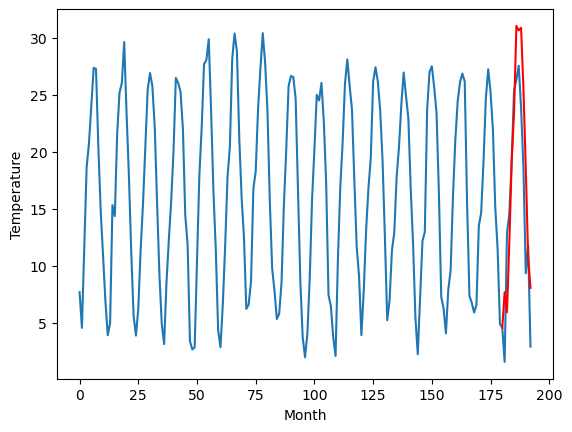

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.34		6.25		-1.09
2.56		4.50		1.94
15.12		10.67		-4.45
16.92		17.76		0.84
21.73		21.99		0.26
27.76		29.61		1.85
29.27		29.23		-0.04
29.66		29.45		-0.21
27.15		24.15		-3.00
20.90		17.07		-3.83
13.15		9.34		-3.81
12.34		6.63		-5.71
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.46, 6.2532483959198, 4.499080839157105, 10.674081983566285, 17.758239450454713, 21.986655893325807, 29.613280954360963, 29.22590461611748, 29.447267728447915, 24.15004940569401, 17.071225362420083, 9.343049245476724, 6.634225326180459]


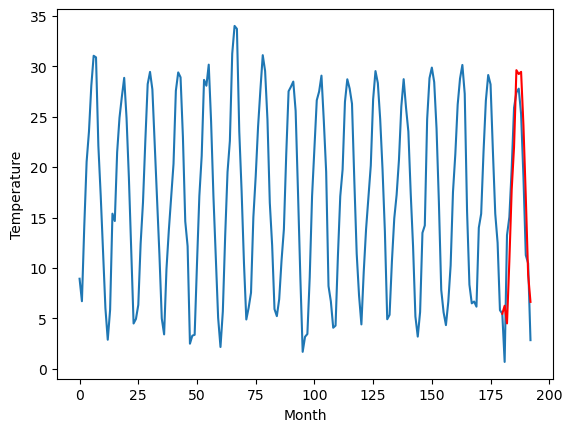

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
9.04		7.49		-1.55
4.67		5.74		1.07
15.38		11.91		-3.47
19.14		19.00		-0.14
23.69		23.23		-0.46
30.80		30.85		0.05
31.47		30.47		-1.00
31.32		30.69		-0.63
29.37		25.39		-3.98
21.93		18.31		-3.62
15.68		10.58		-5.10
14.07		7.87		-6.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.42, 7.4932483959197995, 5.739080839157104, 11.914081983566284, 18.99823945045471, 23.226655893325805, 30.85328095436096, 30.465904616117477, 30.687267728447914, 25.390049405694008, 18.311225362420082, 10.583049245476722, 7.874225326180458]


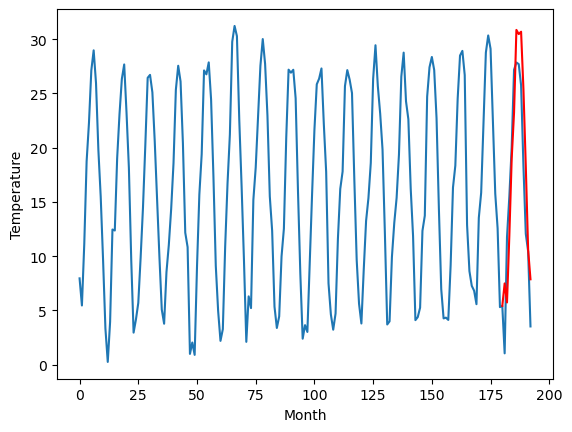

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.12		6.52		0.40
5.16		4.77		-0.39
12.38		10.94		-1.44
17.03		18.03		1.00
21.57		22.26		0.69
27.66		29.88		2.22
29.89		29.50		-0.39
29.67		29.72		0.05
25.97		24.42		-1.55
21.55		17.34		-4.21
12.23		9.61		-2.62
11.46		6.90		-4.56
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.17, 6.5232483959198, 4.7690808391571045, 10.944081983566285, 18.028239450454713, 22.256655893325807, 29.883280954360963, 29.49590461611748, 29.717267728447915, 24.42004940569401, 17.341225362420083, 9.613049245476724, 6.904225326180459]


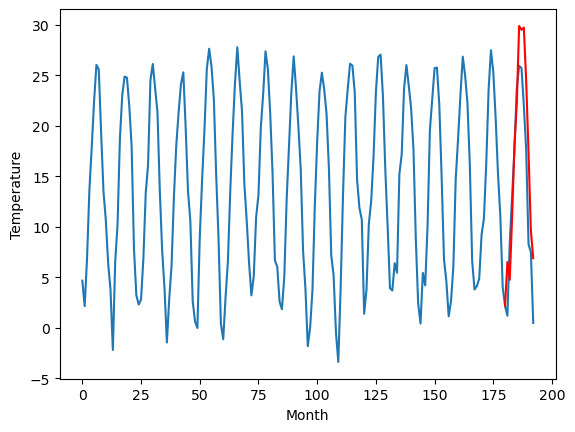

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.38   6.523248
1                 1   12.00  10.763248
2                 2    8.77   6.913248
3                 3   10.72   9.383248
4                 4   14.70  13.273248
5                 5   11.91  11.983248
6                 6   12.75  11.513248
7                 7    8.81   7.683248
8                 8    7.34   6.253248
9                 9    9.04   7.493248
10               10    6.12   6.523248


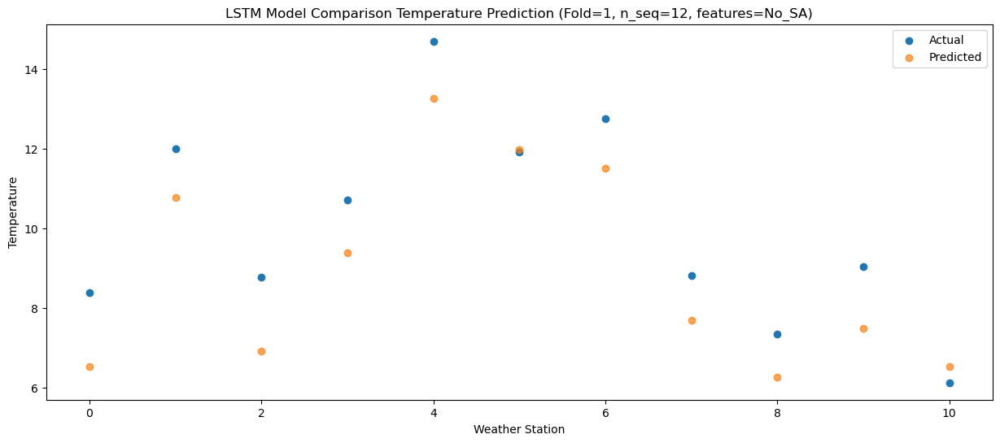

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    8.60   4.769081
1                 1   12.66   9.009081
2                 2    9.26   5.159081
3                 3    9.13   7.629081
4                 4   13.00  11.519081
5                 5   12.29  10.229081
6                 6   13.53   9.759081
7                 7    5.81   5.929081
8                 8    2.56   4.499081
9                 9    4.67   5.739081
10               10    5.16   4.769081


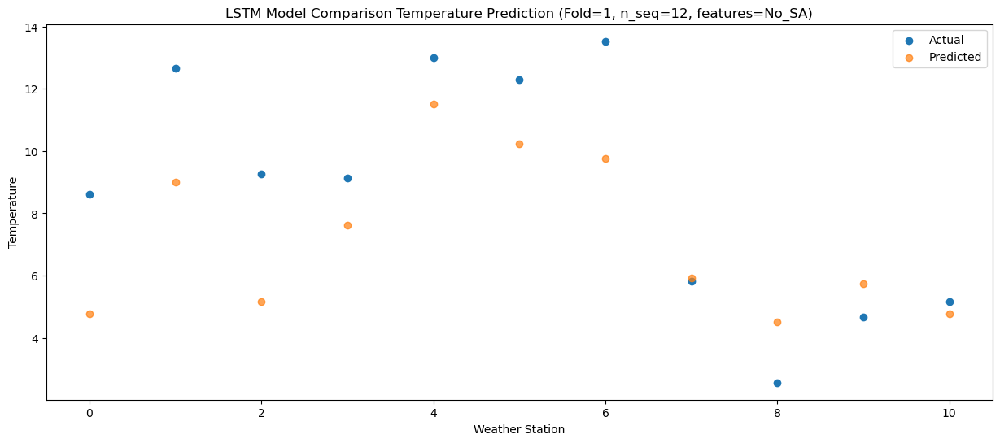

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   13.58  10.944082
1                 1   19.43  15.184082
2                 2   16.32  11.334082
3                 3   16.50  13.804082
4                 4   20.61  17.694082
5                 5   19.63  16.404082
6                 6   19.81  15.934082
7                 7   17.13  12.104082
8                 8   15.12  10.674082
9                 9   15.38  11.914082
10               10   12.38  10.944082


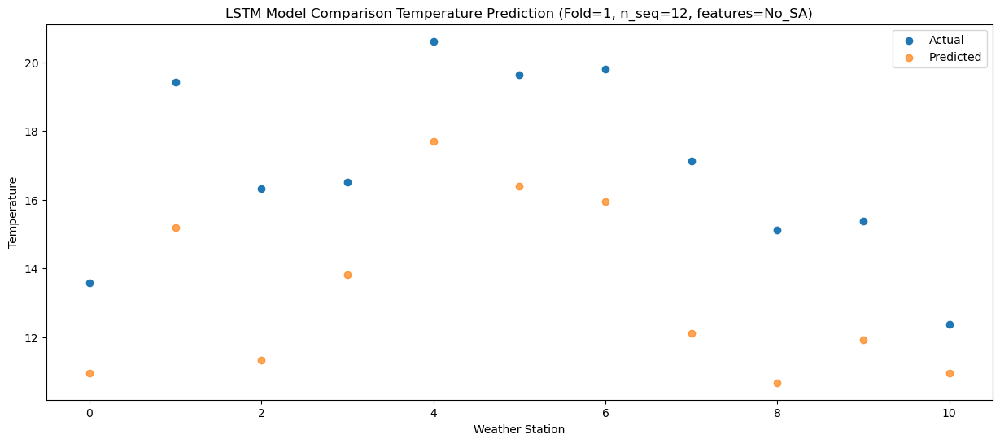

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   16.39  18.028239
1                 1   21.57  22.268239
2                 2   17.72  18.418239
3                 3   18.84  20.888239
4                 4   22.91  24.778239
5                 5   21.90  23.488239
6                 6   22.38  23.018239
7                 7   18.84  19.188239
8                 8   16.92  17.758239
9                 9   19.14  18.998239
10               10   17.03  18.028239


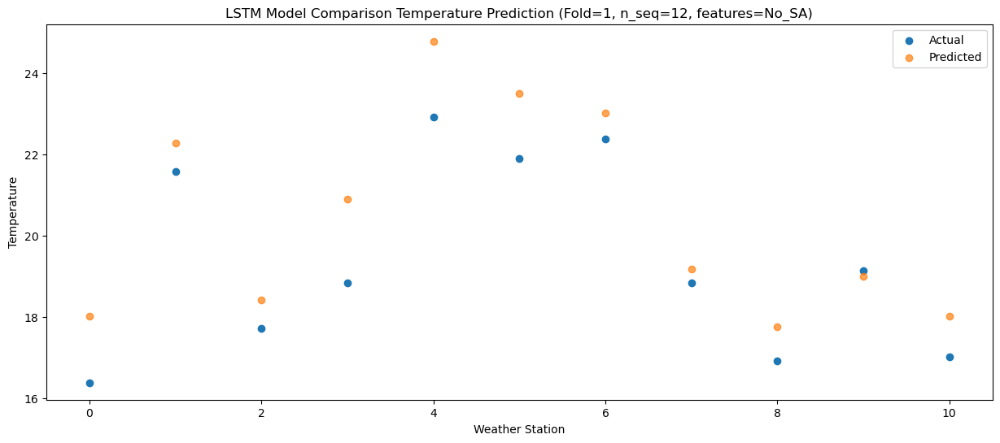

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   20.00  22.256656
1                 1   25.30  26.496656
2                 2   21.84  22.646656
3                 3   22.73  25.116656
4                 4   27.03  29.006656
5                 5   27.49  27.716656
6                 6   26.15  27.246656
7                 7   23.50  23.416656
8                 8   21.73  21.986656
9                 9   23.69  23.226656
10               10   21.57  22.256656


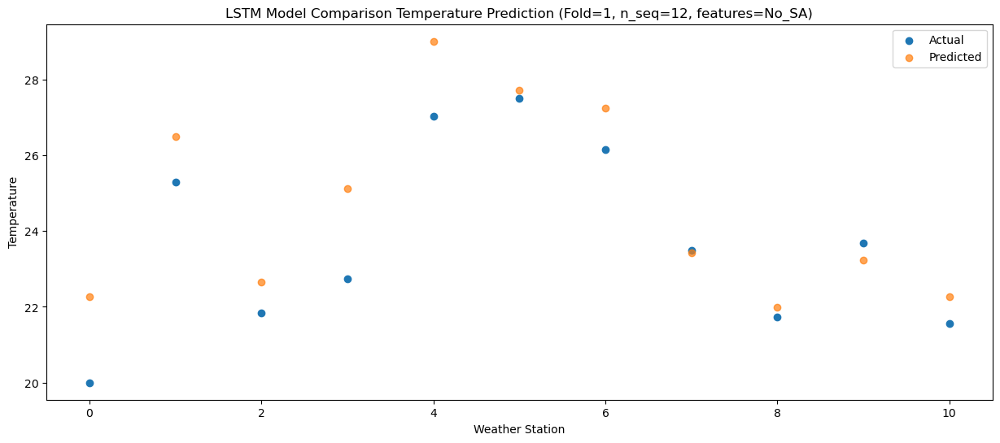

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   23.49  29.883281
1                 1   29.44  34.123281
2                 2   25.72  30.273281
3                 3   26.62  32.743281
4                 4   30.50  36.633281
5                 5   31.76  35.343281
6                 6   30.16  34.873281
7                 7   29.58  31.043281
8                 8   27.76  29.613281
9                 9   30.80  30.853281
10               10   27.66  29.883281


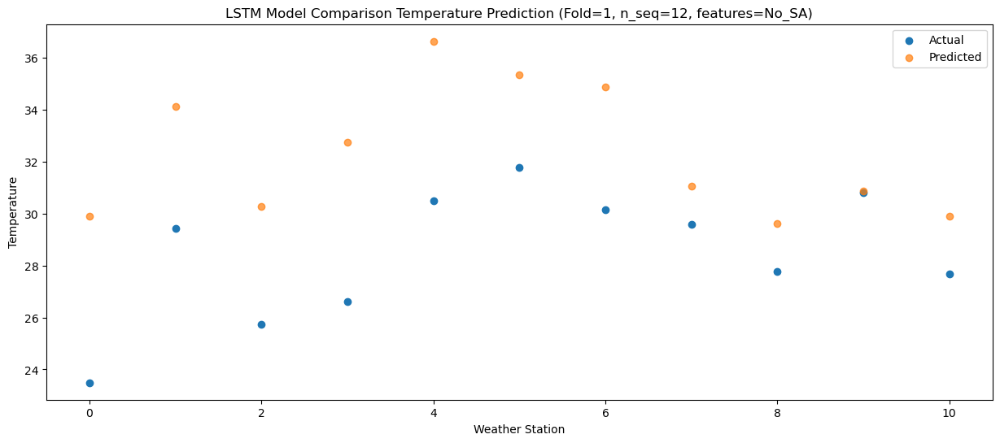

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   24.69  29.495905
1                 1   30.82  33.735905
2                 2   26.49  29.885905
3                 3   26.50  32.355905
4                 4   30.59  36.245905
5                 5   31.10  34.955905
6                 6   31.52  34.485905
7                 7   30.57  30.655905
8                 8   29.27  29.225905
9                 9   31.47  30.465905
10               10   29.89  29.495905


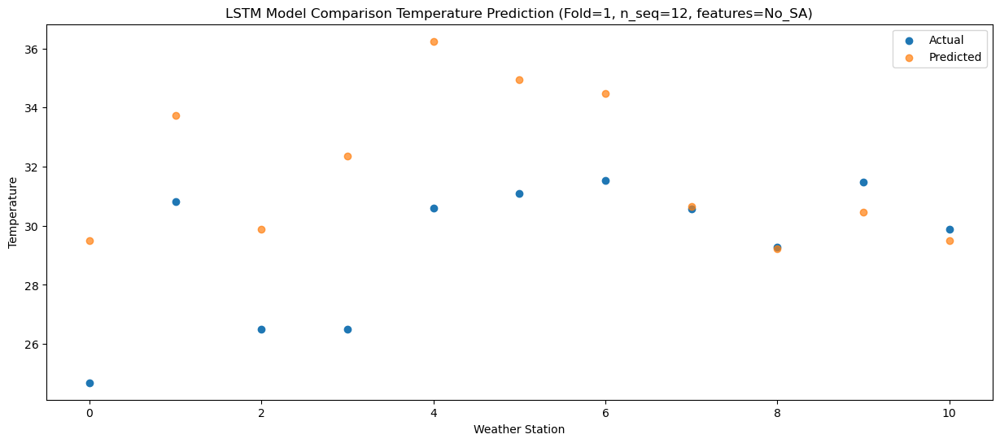

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   24.80  29.717268
1                 1   31.09  33.957268
2                 2   27.15  30.107268
3                 3   27.47  32.577268
4                 4   31.56  36.467268
5                 5   30.51  35.177268
6                 6   31.78  34.707268
7                 7   31.79  30.877268
8                 8   29.66  29.447268
9                 9   31.32  30.687268
10               10   29.67  29.717268


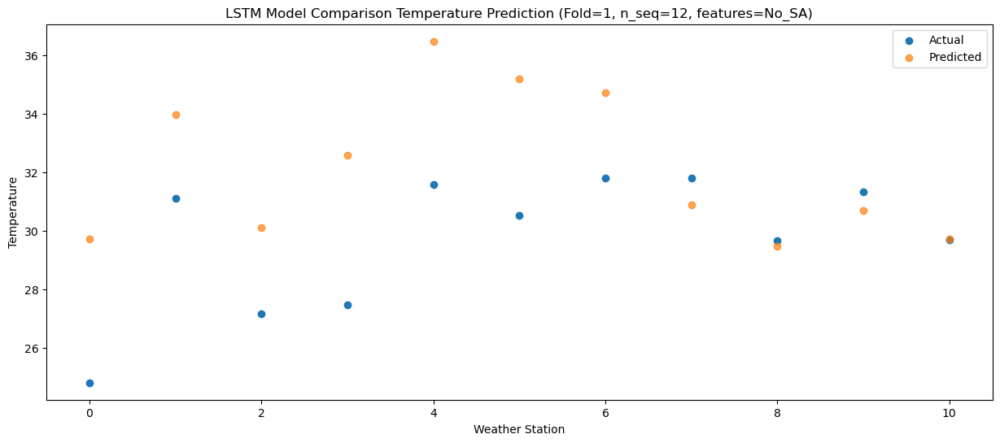

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   22.15  24.420049
1                 1   27.35  28.660049
2                 2   24.13  24.810049
3                 3   24.46  27.280049
4                 4   27.98  31.170049
5                 5   30.15  29.880049
6                 6   28.45  29.410049
7                 7   28.08  25.580049
8                 8   27.15  24.150049
9                 9   29.37  25.390049
10               10   25.97  24.420049


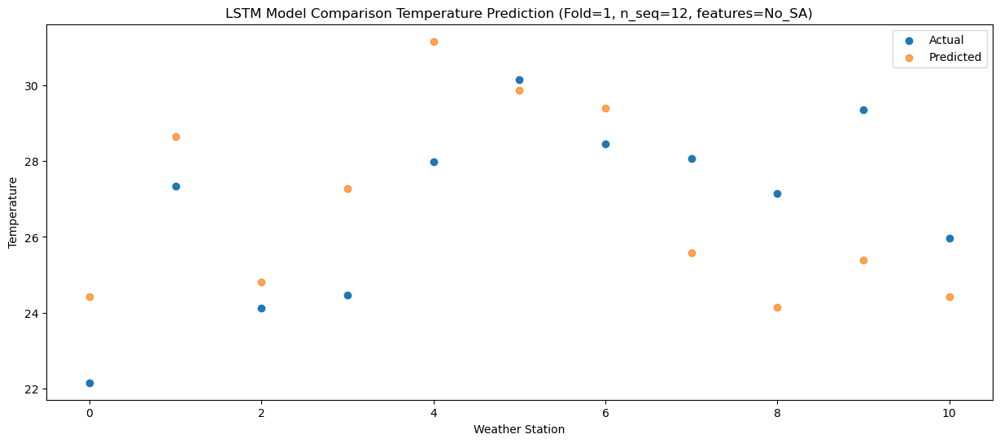

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   18.45  17.341225
1                 1   23.57  21.581225
2                 2   20.35  17.731225
3                 3   21.77  20.201225
4                 4   24.94  24.091225
5                 5   25.83  22.801225
6                 6   24.50  22.331225
7                 7   22.88  18.501225
8                 8   20.90  17.071225
9                 9   21.93  18.311225
10               10   21.55  17.341225


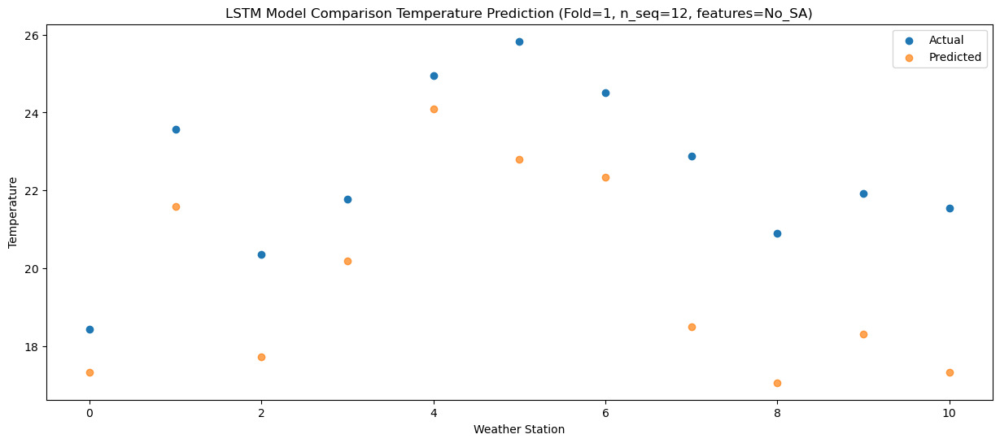

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   10.24   9.613049
1                 1   15.91  13.853049
2                 2   12.61  10.003049
3                 3   14.61  12.473049
4                 4   17.39  16.363049
5                 5   19.36  15.073049
6                 6   16.90  14.603049
7                 7   13.58  10.773049
8                 8   13.15   9.343049
9                 9   15.68  10.583049
10               10   12.23   9.613049


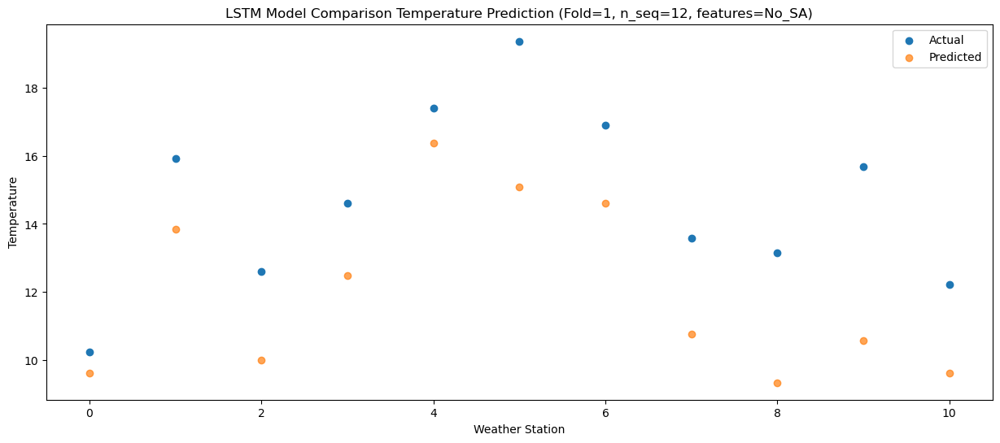

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   12.59   6.904225
1                 1   17.54  11.144225
2                 2   15.21   7.294225
3                 3   17.98   9.764225
4                 4   21.27  13.654225
5                 5   19.62  12.364225
6                 6   18.42  11.894225
7                 7   15.99   8.064225
8                 8   12.34   6.634225
9                 9   14.07   7.874225
10               10   11.46   6.904225


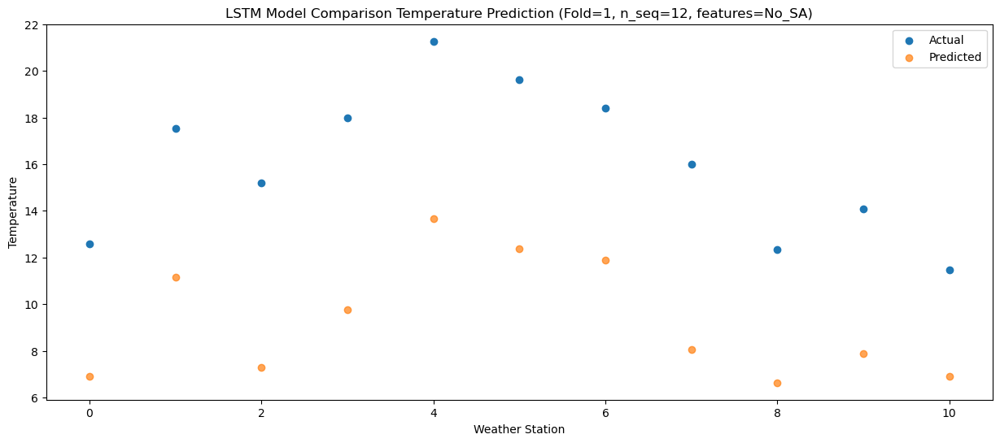

f, t:
[[ 8.38 12.    8.77 10.72 14.7  11.91 12.75  8.81  7.34  9.04  6.12]
 [ 8.6  12.66  9.26  9.13 13.   12.29 13.53  5.81  2.56  4.67  5.16]
 [13.58 19.43 16.32 16.5  20.61 19.63 19.81 17.13 15.12 15.38 12.38]
 [16.39 21.57 17.72 18.84 22.91 21.9  22.38 18.84 16.92 19.14 17.03]
 [20.   25.3  21.84 22.73 27.03 27.49 26.15 23.5  21.73 23.69 21.57]
 [23.49 29.44 25.72 26.62 30.5  31.76 30.16 29.58 27.76 30.8  27.66]
 [24.69 30.82 26.49 26.5  30.59 31.1  31.52 30.57 29.27 31.47 29.89]
 [24.8  31.09 27.15 27.47 31.56 30.51 31.78 31.79 29.66 31.32 29.67]
 [22.15 27.35 24.13 24.46 27.98 30.15 28.45 28.08 27.15 29.37 25.97]
 [18.45 23.57 20.35 21.77 24.94 25.83 24.5  22.88 20.9  21.93 21.55]
 [10.24 15.91 12.61 14.61 17.39 19.36 16.9  13.58 13.15 15.68 12.23]
 [12.59 17.54 15.21 17.98 21.27 19.62 18.42 15.99 12.34 14.07 11.46]]
[[ 6.5232484  10.7632484   6.9132484   9.3832484  13.2732484  11.9832484
  11.5132484   7.6832484   6.2532484   7.4932484   6.5232484 ]
 [ 4.76908084  9.00908084  5.

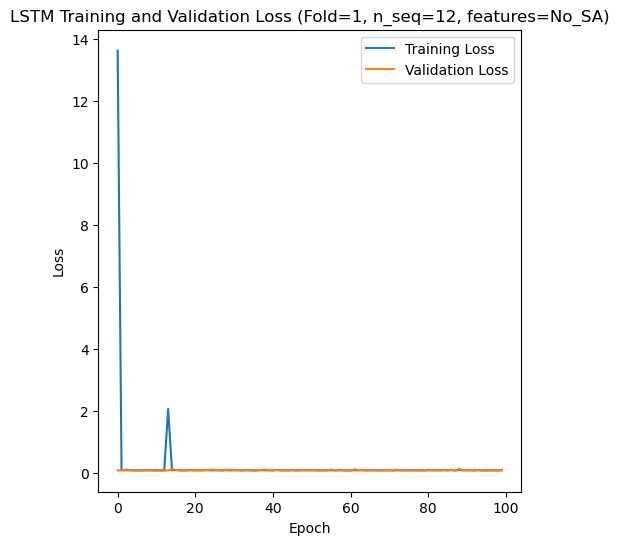

[[ 8.61  4.71 12.22 ... 22.49 18.22 13.52]
 [ 6.28  3.18  8.73 ... 22.36 17.39  7.52]
 [17.82 16.52 20.35 ... 28.79 25.32 22.93]
 ...
 [ 6.77  9.55 12.16 ... 24.55 20.29 10.24]
 [12.04 12.81 10.78 ... 23.32 20.33 13.93]
 [ 8.57  6.56 11.36 ... 21.36 16.14 12.65]]
Epoch 1/100
84/84 [==============================] - 66s 398ms/step - loss: 11.1300 - accuracy: 0.4167 - mae: 10.8763 - rmse: 11.1300 - mape: 2393.9551 - pearson: 0.5016 - val_loss: 0.0528 - val_accuracy: 0.9000 - val_mae: 0.0417 - val_rmse: 0.0528 - val_mape: 10.4473 - val_pearson: 0.9106
Epoch 2/100
84/84 [==============================] - 25s 299ms/step - loss: 0.1300 - accuracy: 0.6071 - mae: 0.1070 - rmse: 0.1300 - mape: 23.7648 - pearson: 0.7475 - val_loss: 0.0527 - val_accuracy: 0.9000 - val_mae: 0.0388 - val_rmse: 0.0527 - val_mape: 9.0742 - val_pearson: 0.9032
Epoch 3/100
84/84 [==============================] - 25s 300ms/step - loss: 0.0761 - accuracy: 0.7500 - mae: 0.0593 - rmse: 0.0761 - mape: 13.1720 - pearson: 0.

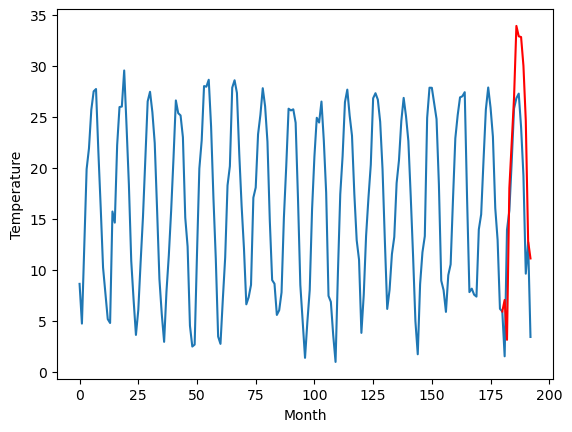

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.53		7.07		-1.46
4.49		3.16		-1.33
14.68		18.04		3.36
18.44		22.48		4.04
23.62		26.93		3.31
30.87		33.96		3.09
31.56		32.95		1.39
32.32		32.87		0.55
30.08		30.05		-0.03
21.82		24.66		2.84
15.11		12.83		-2.28
12.72		11.15		-1.57
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[2.63, 7.067944512367248, 3.158999428749084, 18.041051850318908, 22.482031807899475, 26.928992257118225, 33.962237820625305, 32.94540320396423, 32.87013583689928, 30.04864244967699, 24.661744408905506, 12.834611230194568, 11.14517896682024]


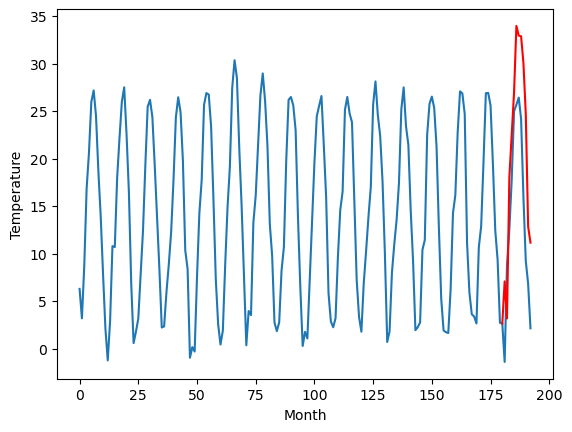

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.94		4.74		-2.20
9.67		0.83		-8.84
11.48		15.71		4.23
13.29		20.15		6.86
16.87		24.60		7.73
18.09		31.63		13.54
18.88		30.62		11.74
18.93		30.54		11.61
17.65		27.72		10.07
16.51		22.33		5.82
9.66		10.50		0.84
10.56		8.82		-1.74
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[16.55, 4.737944512367249, 0.8289994287490847, 15.71105185031891, 20.152031807899476, 24.598992257118226, 31.632237820625306, 30.615403203964235, 30.54013583689928, 27.71864244967699, 22.331744408905507, 10.50461123019457, 8.815178966820241]


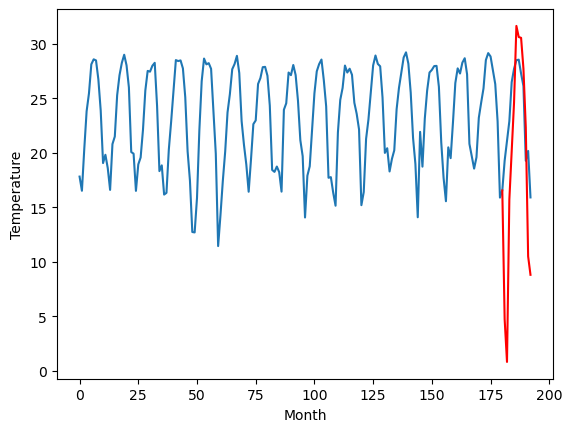

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
14.74		16.28		1.54
14.76		12.37		-2.39
18.87		27.25		8.38
23.37		31.69		8.32
28.63		36.14		7.51
34.20		43.17		8.97
36.20		42.16		5.96
37.26		42.08		4.82
34.09		39.26		5.17
30.26		33.87		3.61
22.18		22.04		-0.14
20.26		20.36		0.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.83, 16.27794451236725, 12.368999428749085, 27.25105185031891, 31.692031807899475, 36.138992257118225, 43.172237820625305, 42.155403203964234, 42.08013583689928, 39.25864244967699, 33.871744408905506, 22.04461123019457, 20.35517896682024]


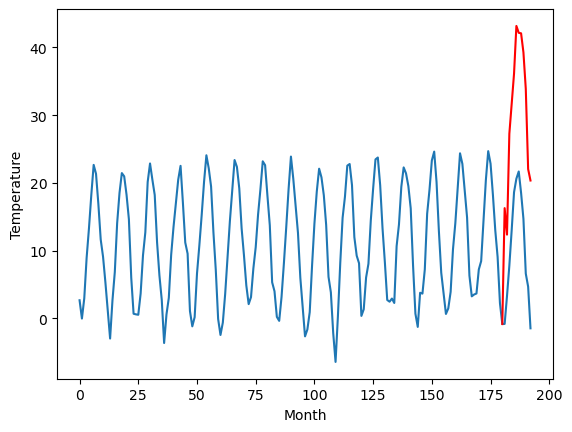

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
3.03		1.14		-1.89
2.29		-2.77		-5.06
9.62		12.11		2.49
10.49		16.55		6.06
14.96		21.00		6.04
18.44		28.03		9.59
19.03		27.02		7.99
19.20		26.94		7.74
16.66		24.12		7.46
13.92		18.73		4.81
5.65		6.90		1.25
9.06		5.22		-3.84
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.52, 1.1379445123672487, -2.7710005712509154, 12.111051850318908, 16.552031807899475, 20.998992257118225, 28.032237820625305, 27.015403203964233, 26.94013583689928, 24.11864244967699, 18.731744408905506, 6.904611230194568, 5.21517896682024]


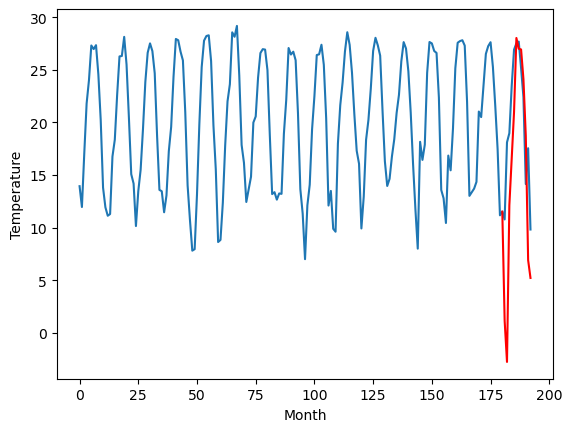

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		12.40		-0.95
11.00		8.49		-2.51
19.38		23.37		3.99
21.50		27.81		6.31
25.54		32.26		6.72
30.09		39.29		9.20
30.17		38.28		8.11
31.28		38.20		6.92
28.54		35.38		6.84
25.24		29.99		4.75
17.60		18.16		0.56
20.84		16.48		-4.36
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[11.47, 12.397944512367248, 8.488999428749084, 23.371051850318906, 27.812031807899473, 32.25899225711822, 39.2922378206253, 38.27540320396423, 38.20013583689928, 35.37864244967699, 29.991744408905504, 18.164611230194566, 16.475178966820238]


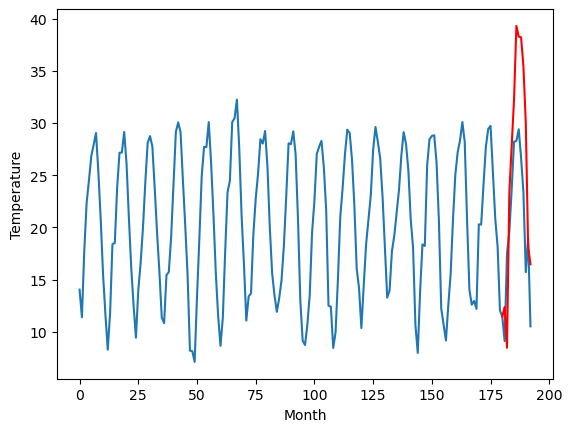

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
13.35		12.51		-0.84
10.24		8.60		-1.64
20.61		23.48		2.87
22.31		27.92		5.61
26.39		32.37		5.98
31.95		39.40		7.45
32.84		38.39		5.55
33.40		38.31		4.91
31.13		35.49		4.36
26.62		30.10		3.48
18.65		18.27		-0.38
20.94		16.59		-4.35
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.75, 12.50794451236725, 8.598999428749085, 23.48105185031891, 27.922031807899476, 32.36899225711822, 39.4022378206253, 38.38540320396423, 38.31013583689928, 35.48864244967699, 30.101744408905503, 18.274611230194566, 16.585178966820237]


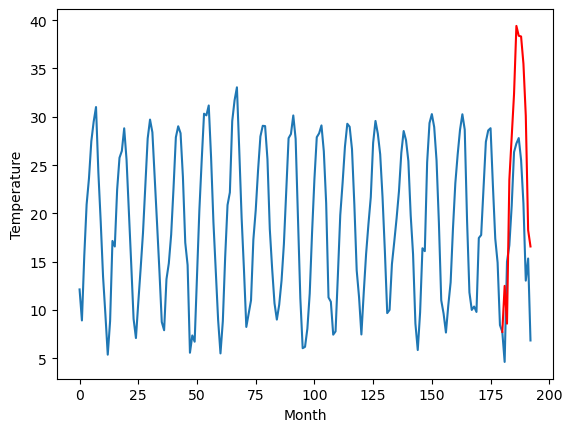

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
12.68		10.60		-2.08
15.60		6.69		-8.91
18.70		21.57		2.87
25.36		26.01		0.65
30.37		30.46		0.09
35.36		37.49		2.13
34.16		36.48		2.32
33.64		36.40		2.76
31.46		33.58		2.12
24.90		28.19		3.29
19.50		16.36		-3.14
16.15		14.68		-1.47
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[4.9, 10.597944512367249, 6.688999428749085, 21.57105185031891, 26.012031807899476, 30.458992257118226, 37.492237820625306, 36.475403203964234, 36.40013583689928, 33.57864244967699, 28.191744408905507, 16.36461123019457, 14.67517896682024]


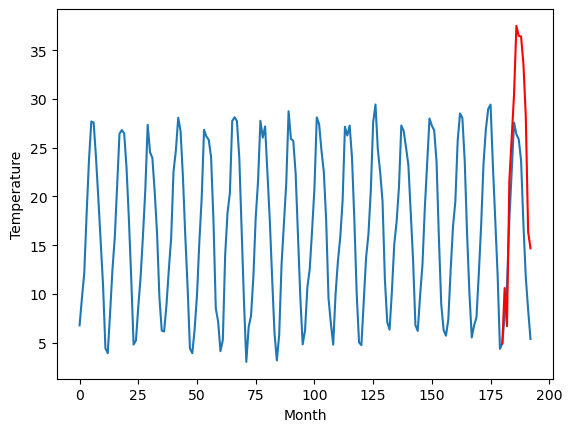

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.71		5.23		-1.48
5.79		1.32		-4.47
5.39		16.20		10.81
9.25		20.64		11.39
11.47		25.09		13.62
15.71		32.12		16.41
18.69		31.11		12.42
18.29		31.03		12.74
16.51		28.21		11.70
11.53		22.82		11.29
10.27		10.99		0.72
3.76		9.31		5.55
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.14, 5.227944512367248, 1.318999428749084, 16.20105185031891, 20.642031807899475, 25.088992257118225, 32.1222378206253, 31.10540320396423, 31.030135836899277, 28.208642449676987, 22.821744408905502, 10.994611230194565, 9.305178966820236]


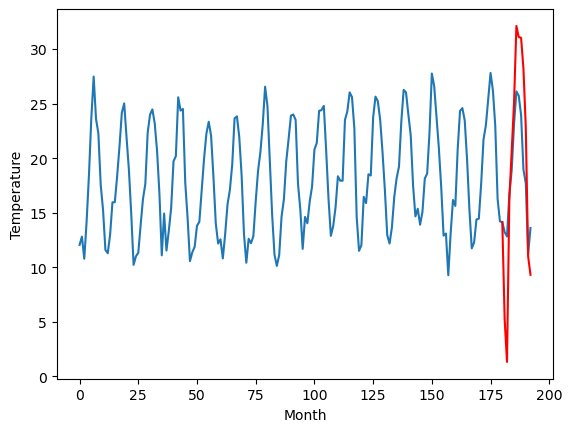

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
11.63		10.50		-1.13
12.13		6.59		-5.54
19.01		21.47		2.46
21.80		25.91		4.11
25.82		30.36		4.54
30.11		37.39		7.28
31.68		36.38		4.70
31.77		36.30		4.53
27.66		33.48		5.82
24.38		28.09		3.71
15.47		16.26		0.79
17.39		14.58		-2.81
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[5.55, 10.497944512367248, 6.588999428749084, 21.471051850318908, 25.912031807899474, 30.358992257118224, 37.392237820625304, 36.37540320396423, 36.30013583689928, 33.47864244967699, 28.091744408905505, 16.264611230194568, 14.57517896682024]


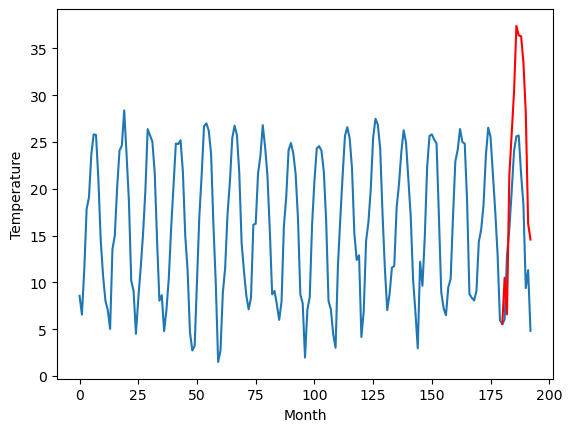

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.90		7.03		-1.87
10.25		3.12		-7.13
16.46		18.00		1.54
18.43		22.44		4.01
23.34		26.89		3.55
28.75		33.92		5.17
30.06		32.91		2.85
30.14		32.83		2.69
25.65		30.01		4.36
21.89		24.62		2.73
11.67		12.79		1.12
13.77		11.11		-2.66
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.19, 7.027944512367249, 3.1189994287490848, 18.00105185031891, 22.442031807899475, 26.888992257118225, 33.922237820625305, 32.905403203964234, 32.83013583689928, 30.00864244967699, 24.621744408905506, 12.794611230194569, 11.10517896682024]


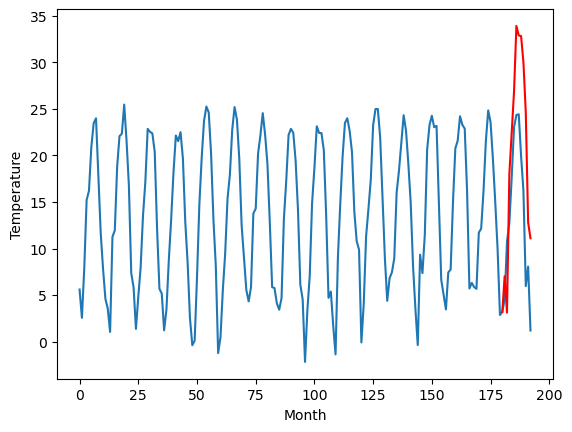

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    8.31   7.027945
1                 1    8.53   7.067945
2                 2    6.94   4.737945
3                 3   14.74  16.277945
4                 4    3.03   1.137945
5                 5   13.35  12.397945
6                 6   13.35  12.507945
7                 7   12.68  10.597945
8                 8    6.71   5.227945
9                 9   11.63  10.497945
10               10    8.90   7.027945


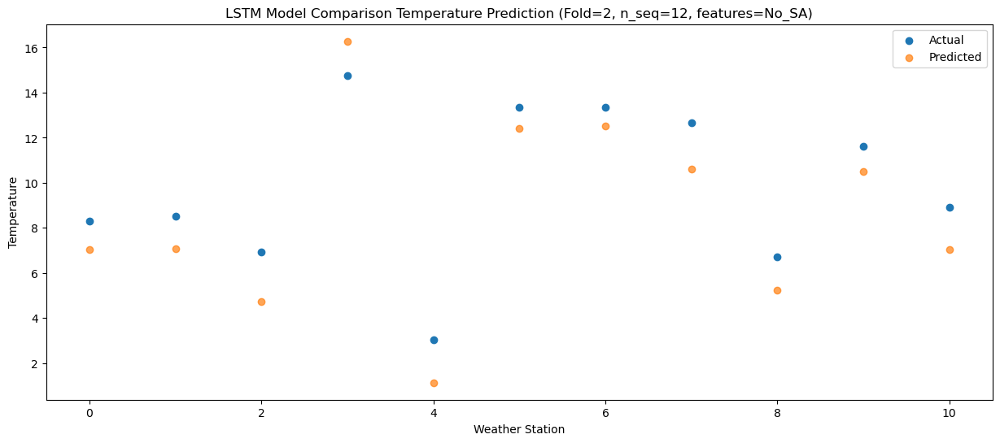

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.91   3.118999
1                 1    4.49   3.158999
2                 2    9.67   0.828999
3                 3   14.76  12.368999
4                 4    2.29  -2.771001
5                 5   11.00   8.488999
6                 6   10.24   8.598999
7                 7   15.60   6.688999
8                 8    5.79   1.318999
9                 9   12.13   6.588999
10               10   10.25   3.118999


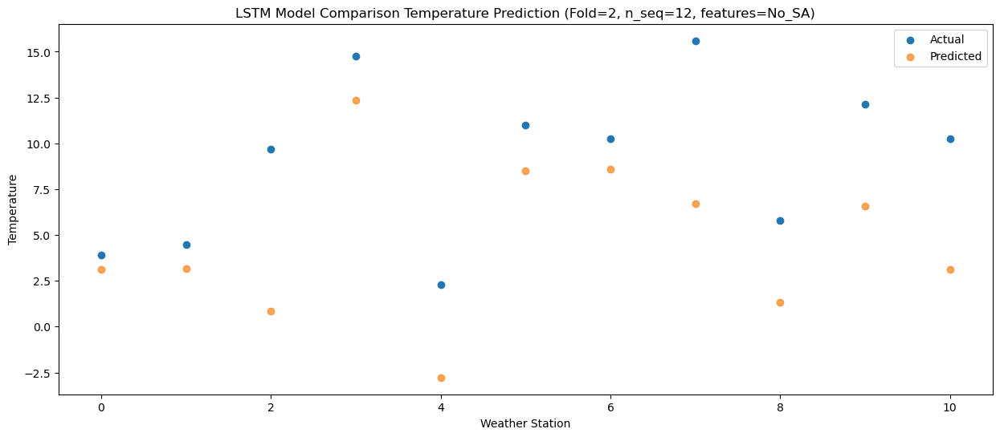

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   16.33  18.001052
1                 1   14.68  18.041052
2                 2   11.48  15.711052
3                 3   18.87  27.251052
4                 4    9.62  12.111052
5                 5   19.38  23.371052
6                 6   20.61  23.481052
7                 7   18.70  21.571052
8                 8    5.39  16.201052
9                 9   19.01  21.471052
10               10   16.46  18.001052


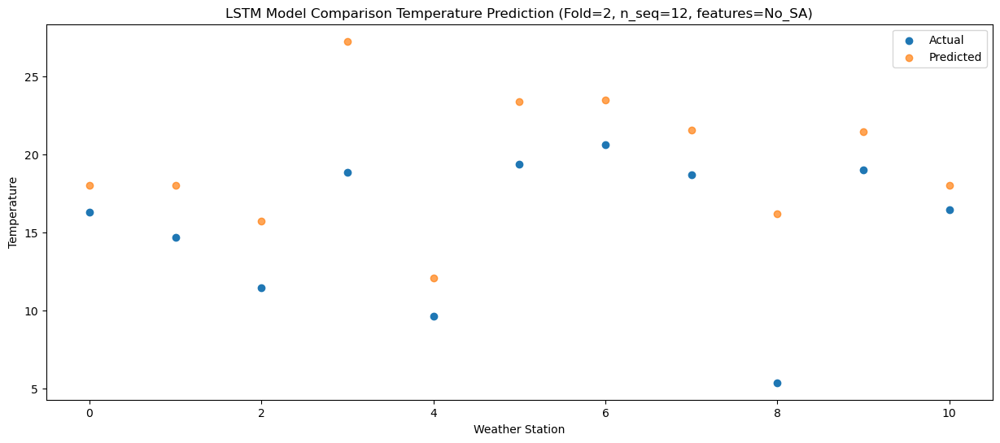

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   18.20  22.442032
1                 1   18.44  22.482032
2                 2   13.29  20.152032
3                 3   23.37  31.692032
4                 4   10.49  16.552032
5                 5   21.50  27.812032
6                 6   22.31  27.922032
7                 7   25.36  26.012032
8                 8    9.25  20.642032
9                 9   21.80  25.912032
10               10   18.43  22.442032


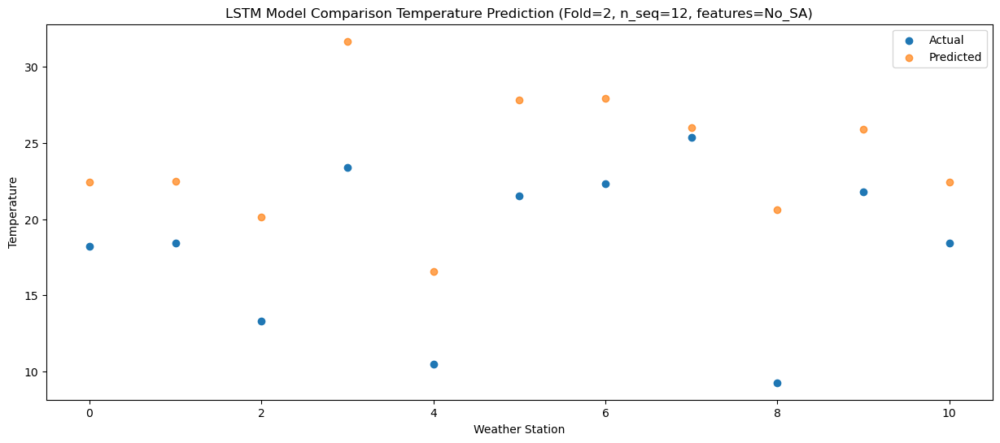

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   22.98  26.888992
1                 1   23.62  26.928992
2                 2   16.87  24.598992
3                 3   28.63  36.138992
4                 4   14.96  20.998992
5                 5   25.54  32.258992
6                 6   26.39  32.368992
7                 7   30.37  30.458992
8                 8   11.47  25.088992
9                 9   25.82  30.358992
10               10   23.34  26.888992


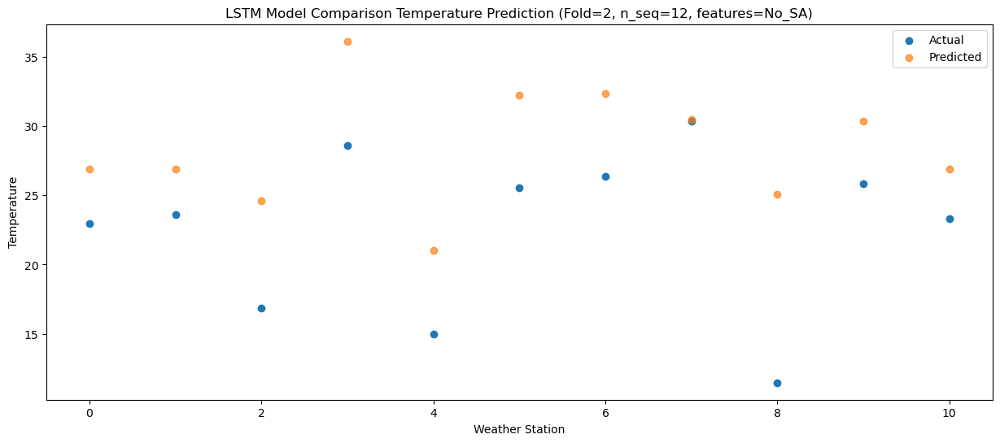

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   28.23  33.922238
1                 1   30.87  33.962238
2                 2   18.09  31.632238
3                 3   34.20  43.172238
4                 4   18.44  28.032238
5                 5   30.09  39.292238
6                 6   31.95  39.402238
7                 7   35.36  37.492238
8                 8   15.71  32.122238
9                 9   30.11  37.392238
10               10   28.75  33.922238


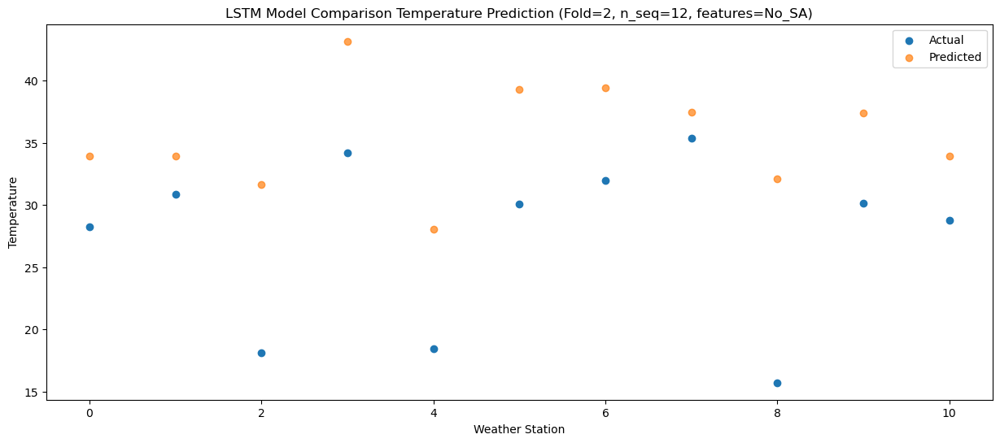

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   29.24  32.905403
1                 1   31.56  32.945403
2                 2   18.88  30.615403
3                 3   36.20  42.155403
4                 4   19.03  27.015403
5                 5   30.17  38.275403
6                 6   32.84  38.385403
7                 7   34.16  36.475403
8                 8   18.69  31.105403
9                 9   31.68  36.375403
10               10   30.06  32.905403


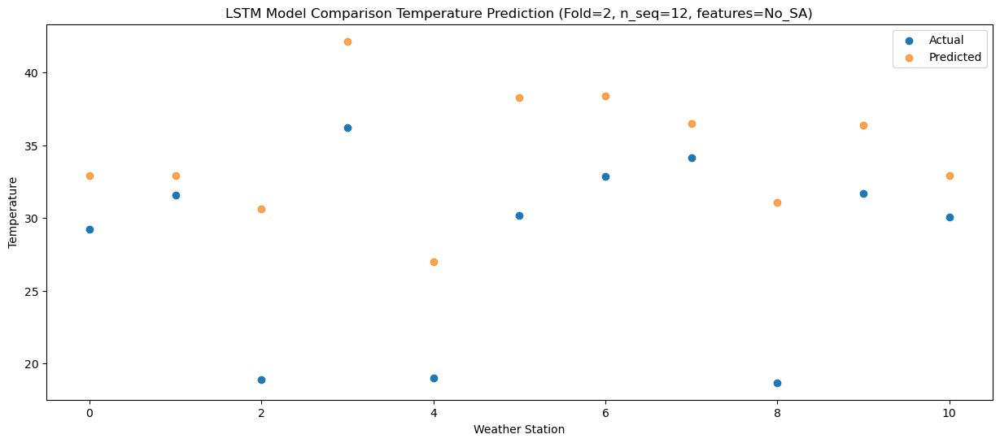

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   29.69  32.830136
1                 1   32.32  32.870136
2                 2   18.93  30.540136
3                 3   37.26  42.080136
4                 4   19.20  26.940136
5                 5   31.28  38.200136
6                 6   33.40  38.310136
7                 7   33.64  36.400136
8                 8   18.29  31.030136
9                 9   31.77  36.300136
10               10   30.14  32.830136


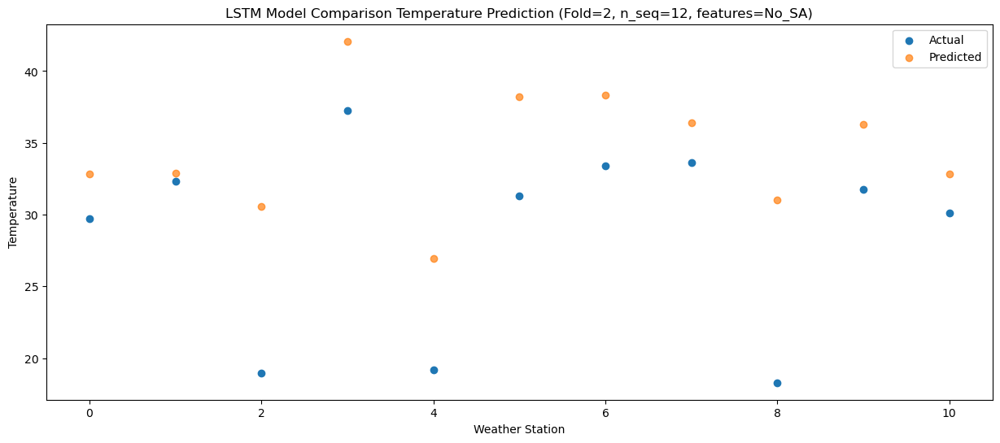

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   26.39  30.008642
1                 1   30.08  30.048642
2                 2   17.65  27.718642
3                 3   34.09  39.258642
4                 4   16.66  24.118642
5                 5   28.54  35.378642
6                 6   31.13  35.488642
7                 7   31.46  33.578642
8                 8   16.51  28.208642
9                 9   27.66  33.478642
10               10   25.65  30.008642


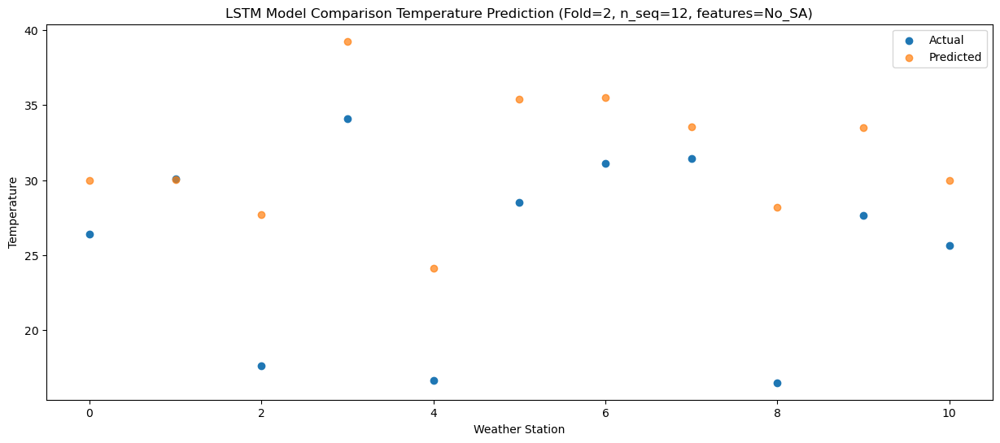

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   21.64  24.621744
1                 1   21.82  24.661744
2                 2   16.51  22.331744
3                 3   30.26  33.871744
4                 4   13.92  18.731744
5                 5   25.24  29.991744
6                 6   26.62  30.101744
7                 7   24.90  28.191744
8                 8   11.53  22.821744
9                 9   24.38  28.091744
10               10   21.89  24.621744


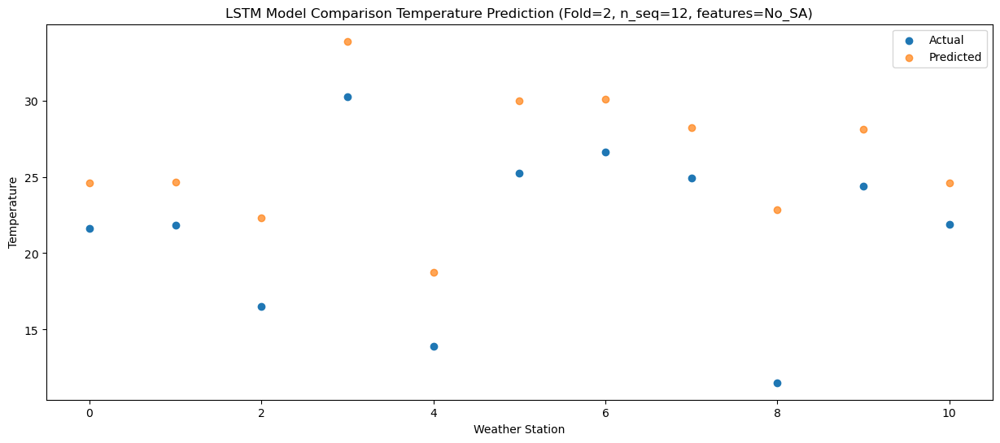

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0   12.02  12.794611
1                 1   15.11  12.834611
2                 2    9.66  10.504611
3                 3   22.18  22.044611
4                 4    5.65   6.904611
5                 5   17.60  18.164611
6                 6   18.65  18.274611
7                 7   19.50  16.364611
8                 8   10.27  10.994611
9                 9   15.47  16.264611
10               10   11.67  12.794611


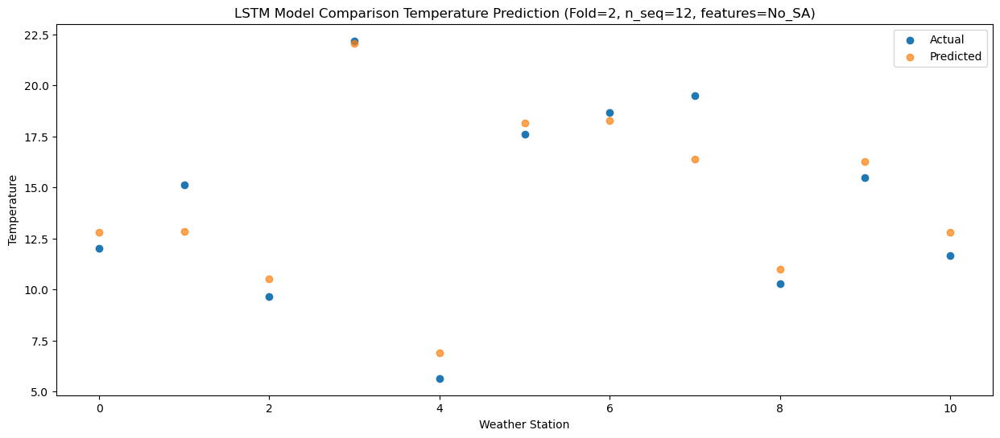

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0   15.11  11.105179
1                 1   12.72  11.145179
2                 2   10.56   8.815179
3                 3   20.26  20.355179
4                 4    9.06   5.215179
5                 5   20.84  16.475179
6                 6   20.94  16.585179
7                 7   16.15  14.675179
8                 8    3.76   9.305179
9                 9   17.39  14.575179
10               10   13.77  11.105179


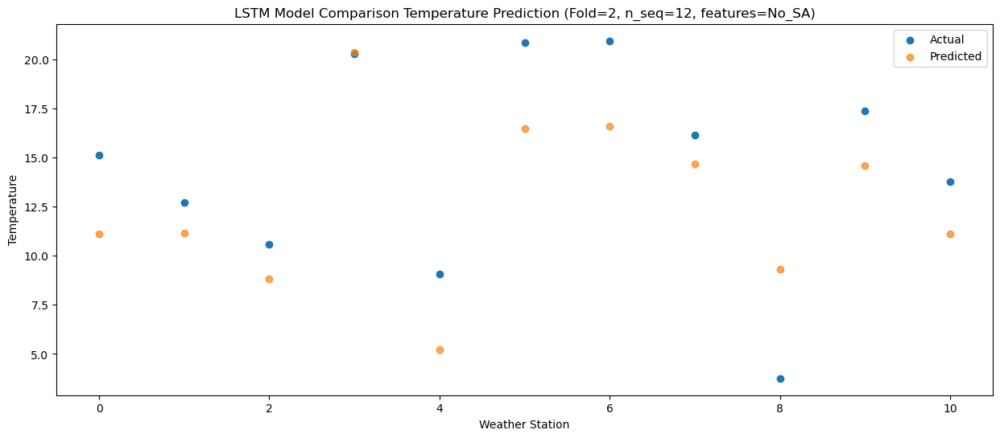

f, t:
[[ 8.31  8.53  6.94 14.74  3.03 13.35 13.35 12.68  6.71 11.63  8.9 ]
 [ 3.91  4.49  9.67 14.76  2.29 11.   10.24 15.6   5.79 12.13 10.25]
 [16.33 14.68 11.48 18.87  9.62 19.38 20.61 18.7   5.39 19.01 16.46]
 [18.2  18.44 13.29 23.37 10.49 21.5  22.31 25.36  9.25 21.8  18.43]
 [22.98 23.62 16.87 28.63 14.96 25.54 26.39 30.37 11.47 25.82 23.34]
 [28.23 30.87 18.09 34.2  18.44 30.09 31.95 35.36 15.71 30.11 28.75]
 [29.24 31.56 18.88 36.2  19.03 30.17 32.84 34.16 18.69 31.68 30.06]
 [29.69 32.32 18.93 37.26 19.2  31.28 33.4  33.64 18.29 31.77 30.14]
 [26.39 30.08 17.65 34.09 16.66 28.54 31.13 31.46 16.51 27.66 25.65]
 [21.64 21.82 16.51 30.26 13.92 25.24 26.62 24.9  11.53 24.38 21.89]
 [12.02 15.11  9.66 22.18  5.65 17.6  18.65 19.5  10.27 15.47 11.67]
 [15.11 12.72 10.56 20.26  9.06 20.84 20.94 16.15  3.76 17.39 13.77]]
[[ 7.02794451  7.06794451  4.73794451 16.27794451  1.13794451 12.39794451
  12.50794451 10.59794451  5.22794451 10.49794451  7.02794451]
 [ 3.11899943  3.15899943  0

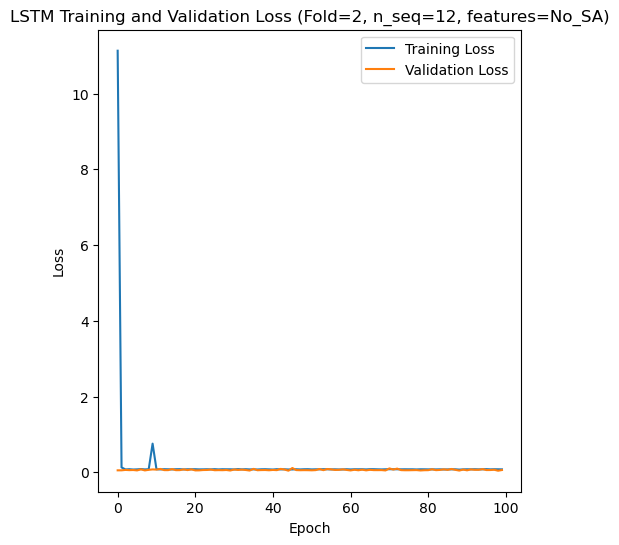

[[ 8.9   6.89 11.3  ... 22.19 16.88 13.54]
 [ 7.02  3.15 10.24 ... 22.31 18.92 11.32]
 [ 7.65  9.7   9.44 ... 25.68 20.65 11.46]
 ...
 [ 9.57 11.93 12.22 ... 30.9  25.01 12.37]
 [ 9.04  9.3   8.59 ... 17.72 17.26 10.73]
 [ 3.2   0.4   3.78 ... 18.92 14.39 10.04]]
Epoch 1/100
84/84 [==============================] - 67s 414ms/step - loss: 10.8924 - accuracy: 0.5595 - mae: 10.6171 - rmse: 10.8924 - mape: 2377.2527 - pearson: 0.6011 - val_loss: 0.1039 - val_accuracy: 0.2000 - val_mae: 0.0838 - val_rmse: 0.1039 - val_mape: 20.1618 - val_pearson: 0.6721
Epoch 2/100
84/84 [==============================] - 25s 300ms/step - loss: 0.0734 - accuracy: 0.7143 - mae: 0.0579 - rmse: 0.0734 - mape: 13.6325 - pearson: 0.8174 - val_loss: 0.0963 - val_accuracy: 0.7000 - val_mae: 0.0777 - val_rmse: 0.0963 - val_mape: 19.8786 - val_pearson: 0.6954
Epoch 3/100
84/84 [==============================] - 25s 294ms/step - loss: 0.0728 - accuracy: 0.7857 - mae: 0.0572 - rmse: 0.0728 - mape: 13.5118 - pearson: 0

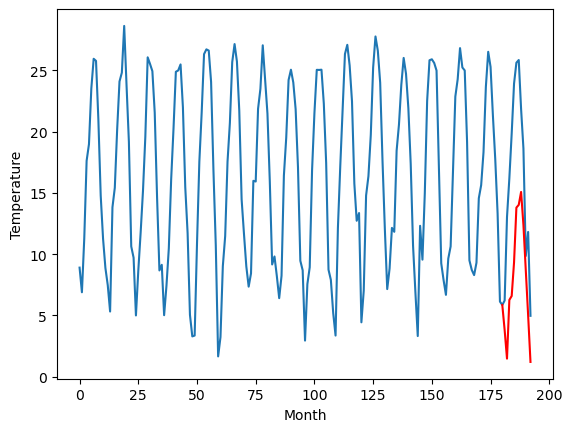

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.75		9.50		1.75
4.03		7.18		3.15
16.00		11.96		-4.04
17.86		12.29		-5.57
22.08		15.03		-7.05
28.79		19.49		-9.30
30.10		19.72		-10.38
30.67		20.77		-9.90
27.94		18.07		-9.87
21.34		14.39		-6.95
13.63		10.71		-2.92
14.94		6.91		-8.03
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.2, 9.504082763195038, 7.177866065502167, 11.963105762004853, 12.28710105419159, 15.025742554664612, 19.493586087226866, 19.718658605217932, 20.770953813195227, 18.067777076363562, 14.38613192141056, 10.708066383004187, 6.910375037789343]


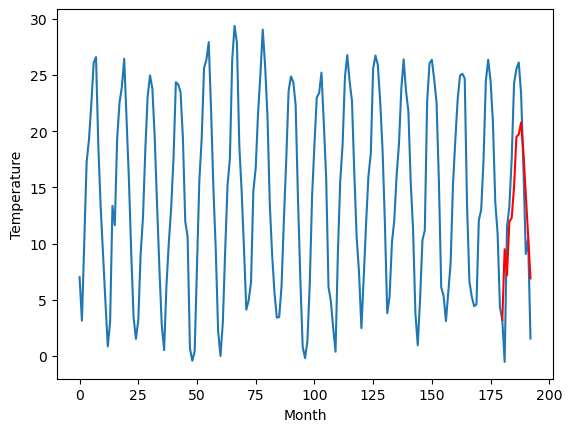

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
8.28		7.62		-0.66
10.58		5.30		-5.28
11.73		10.08		-1.65
17.46		10.41		-7.05
22.26		13.15		-9.11
27.11		17.61		-9.50
30.24		17.84		-12.40
28.04		18.89		-9.15
24.73		16.19		-8.54
16.07		12.51		-3.56
11.73		8.83		-2.90
7.81		5.03		-2.78
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[8.48, 7.624082763195037, 5.297866065502166, 10.083105762004852, 10.407101054191589, 13.145742554664611, 17.613586087226867, 17.838658605217933, 18.890953813195228, 16.187777076363563, 12.50613192141056, 8.828066383004188, 5.030375037789344]


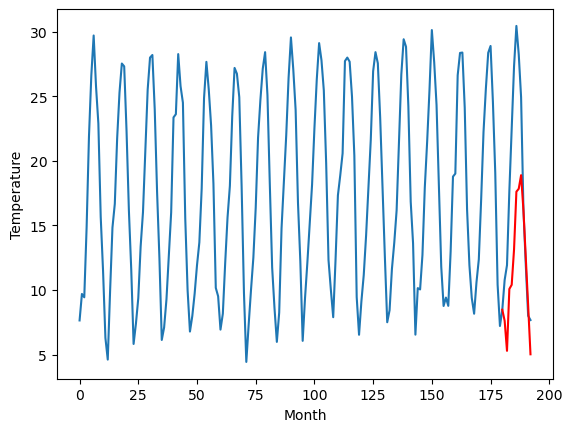

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.19		8.25		2.06
4.87		5.93		1.06
15.08		10.71		-4.37
17.43		11.04		-6.39
21.50		13.78		-7.72
27.42		18.24		-9.18
28.41		18.47		-9.94
28.93		19.52		-9.41
24.80		16.82		-7.98
21.22		13.14		-8.08
11.56		9.46		-2.10
13.05		5.66		-7.39
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.55, 8.254082763195038, 5.927866065502167, 10.713105762004853, 11.03710105419159, 13.775742554664612, 18.243586087226866, 18.468658605217932, 19.520953813195227, 16.817777076363562, 13.13613192141056, 9.458066383004187, 5.660375037789343]


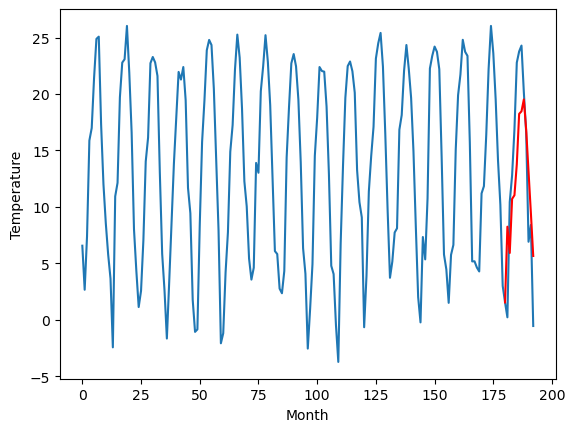

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.10		7.17		2.07
1.23		4.85		3.62
14.31		9.63		-4.68
17.60		9.96		-7.64
22.17		12.70		-9.47
29.65		17.16		-12.49
29.65		17.39		-12.26
29.77		18.44		-11.33
26.41		15.74		-10.67
20.99		12.06		-8.93
11.25		8.38		-2.87
10.89		4.58		-6.31
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[1.08, 7.174082763195038, 4.847866065502167, 9.633105762004853, 9.95710105419159, 12.695742554664612, 17.163586087226868, 17.388658605217934, 18.44095381319523, 15.737777076363564, 12.056131921410561, 8.378066383004189, 4.580375037789345]


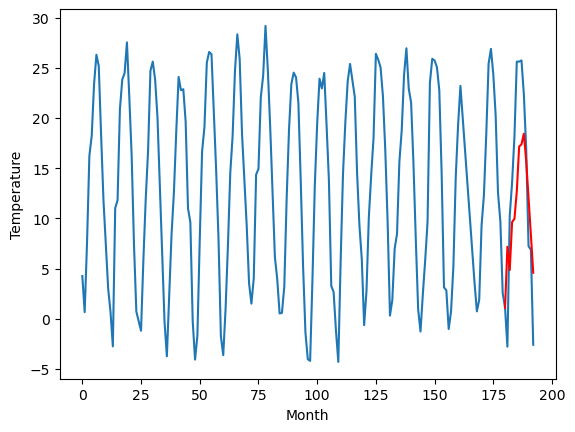

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.80		4.85		2.05
0.08		2.53		2.45
11.41		7.31		-4.10
14.86		7.64		-7.22
19.14		10.38		-8.76
25.85		14.84		-11.01
26.23		15.07		-11.16
26.55		16.12		-10.43
23.29		13.42		-9.87
18.71		9.74		-8.97
7.86		6.06		-1.80
8.91		2.26		-6.65
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.21, 4.854082763195038, 2.5278660655021667, 7.313105762004852, 7.637101054191589, 10.375742554664612, 14.843586087226868, 15.068658605217934, 16.12095381319523, 13.417777076363564, 9.73613192141056, 6.0580663830041885, 2.260375037789345]


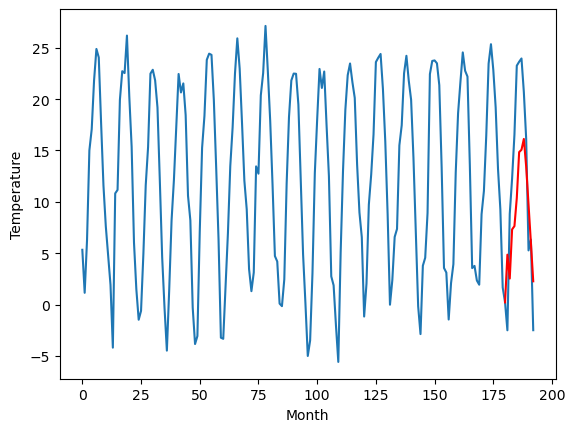

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.60		5.93		0.33
5.70		3.61		-2.09
8.67		8.39		-0.28
13.45		8.72		-4.73
18.50		11.46		-7.04
25.89		15.92		-9.97
27.73		16.15		-11.58
25.81		17.20		-8.61
23.94		14.50		-9.44
15.97		10.82		-5.15
13.23		7.14		-6.09
8.47		3.34		-5.13
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-8.22, 5.934082763195038, 3.607866065502167, 8.393105762004852, 8.71710105419159, 11.455742554664612, 15.923586087226868, 16.148658605217932, 17.200953813195227, 14.497777076363562, 10.816131921410559, 7.138066383004187, 3.340375037789343]


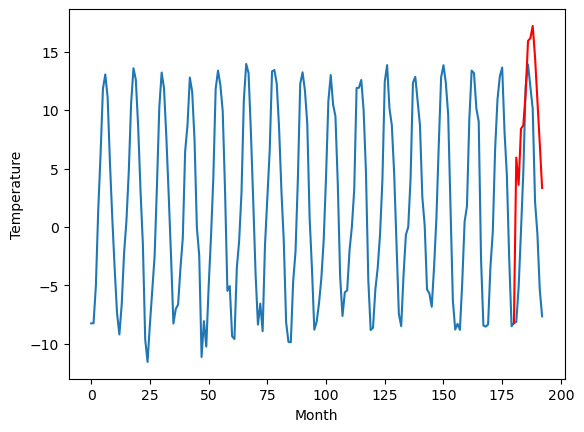

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
-7.69		-7.64		0.05
-4.84		-9.96		-5.12
-3.24		-5.18		-1.94
4.73		-4.85		-9.58
9.16		-2.11		-11.27
16.80		2.35		-14.45
17.88		2.58		-15.30
16.65		3.63		-13.02
12.68		0.93		-11.75
2.33		-2.75		-5.08
-0.19		-6.43		-6.24
-7.46		-10.23		-2.77
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[10.04, -7.635917236804962, -9.962133934497833, -5.176894237995148, -4.852898945808411, -2.1142574453353884, 2.3535860872268675, 2.5786586052179334, 3.6309538131952284, 0.9277770763635633, -2.7538680785894396, -6.431933616995812, -10.229624962210655]


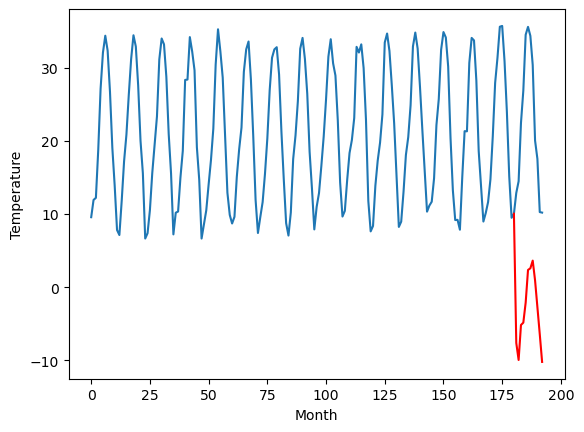

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		10.17		-0.62
11.72		7.85		-3.87
11.50		12.63		1.13
13.69		12.96		-0.73
17.98		15.70		-2.28
19.68		20.16		0.48
18.86		20.39		1.53
19.41		21.44		2.03
18.86		18.74		-0.12
16.10		15.06		-1.04
13.28		11.38		-1.90
9.58		7.58		-2.00
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.17, 10.174082763195038, 7.847866065502167, 12.633105762004853, 12.95710105419159, 15.695742554664612, 20.163586087226868, 20.388658605217934, 21.44095381319523, 18.737777076363564, 15.056131921410561, 11.378066383004189, 7.580375037789345]


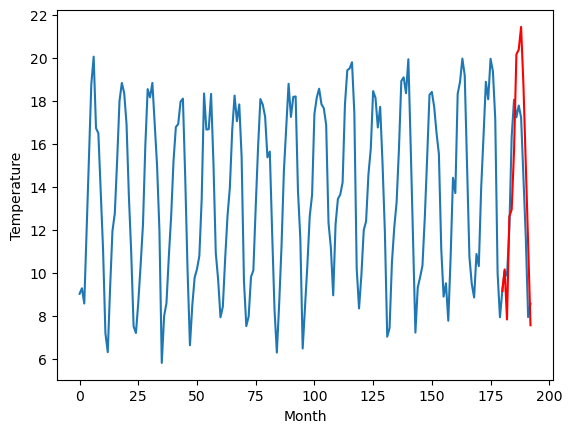

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.02		9.64		3.62
5.90		7.32		1.42
10.90		12.10		1.20
15.52		12.43		-3.09
20.35		15.17		-5.18
26.22		19.63		-6.59
28.36		19.86		-8.50
28.98		20.91		-8.07
25.66		18.21		-7.45
21.22		14.53		-6.69
12.30		10.85		-1.45
10.70		7.05		-3.65
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[0.94, 9.644082763195037, 7.317866065502166, 12.103105762004851, 12.427101054191589, 15.165742554664611, 19.633586087226867, 19.858658605217933, 20.910953813195228, 18.207777076363563, 14.52613192141056, 10.848066383004188, 7.050375037789344]


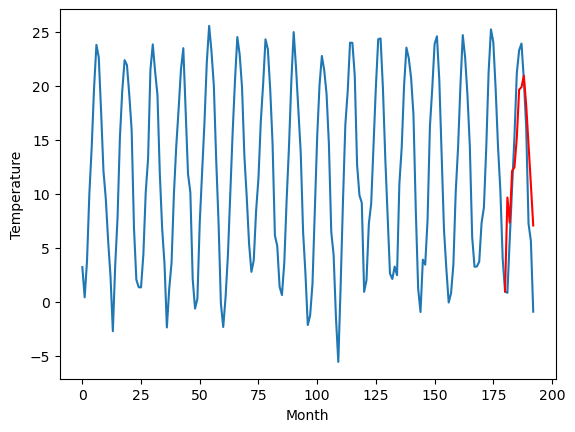

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.64		3.80		2.16
0.84		1.48		0.64
8.03		6.26		-1.77
12.90		6.59		-6.31
17.16		9.33		-7.83
23.33		13.79		-9.54
24.97		14.02		-10.95
24.70		15.07		-9.63
20.44		12.37		-8.07
16.32		8.69		-7.63
6.10		5.01		-1.09
5.69		1.21		-4.48
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.13, 3.804082763195038, 1.477866065502167, 6.2631057620048525, 6.5871010541915895, 9.325742554664611, 13.793586087226867, 14.018658605217933, 15.070953813195228, 12.367777076363563, 8.68613192141056, 5.008066383004188, 1.210375037789344]


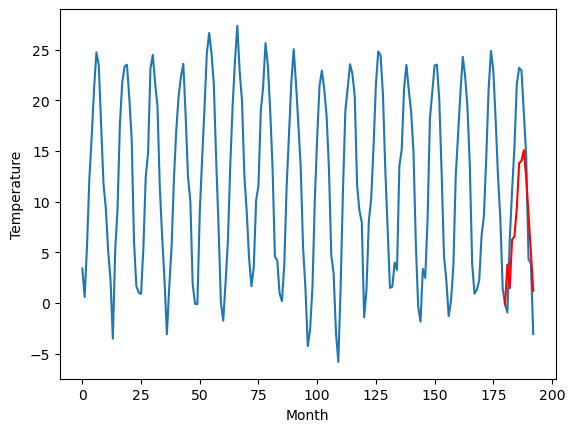

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.92   3.804083
1                 1    7.75   9.504083
2                 2    8.28   7.624083
3                 3    6.19   8.254083
4                 4    5.10   7.174083
5                 5    2.80   4.854083
6                 6    5.60   5.934083
7                 7   -7.69  -7.635917
8                 8   10.79  10.174083
9                 9    6.02   9.644083
10               10    1.64   3.804083


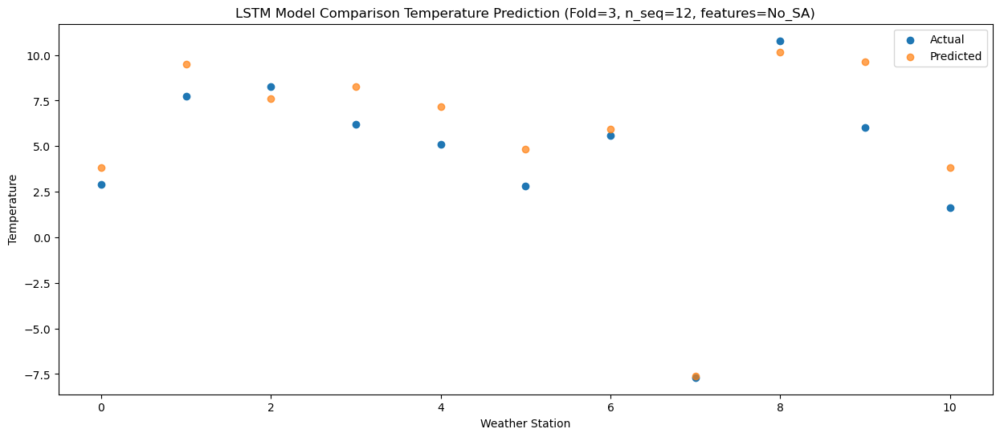

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0    3.29   1.477866
1                 1    4.03   7.177866
2                 2   10.58   5.297866
3                 3    4.87   5.927866
4                 4    1.23   4.847866
5                 5    0.08   2.527866
6                 6    5.70   3.607866
7                 7   -4.84  -9.962134
8                 8   11.72   7.847866
9                 9    5.90   7.317866
10               10    0.84   1.477866


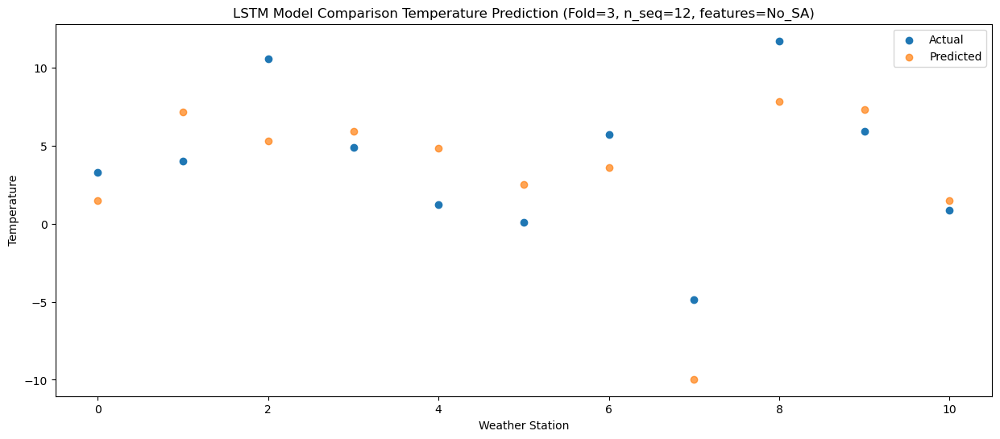

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.09   6.263106
1                 1   16.00  11.963106
2                 2   11.73  10.083106
3                 3   15.08  10.713106
4                 4   14.31   9.633106
5                 5   11.41   7.313106
6                 6    8.67   8.393106
7                 7   -3.24  -5.176894
8                 8   11.50  12.633106
9                 9   10.90  12.103106
10               10    8.03   6.263106


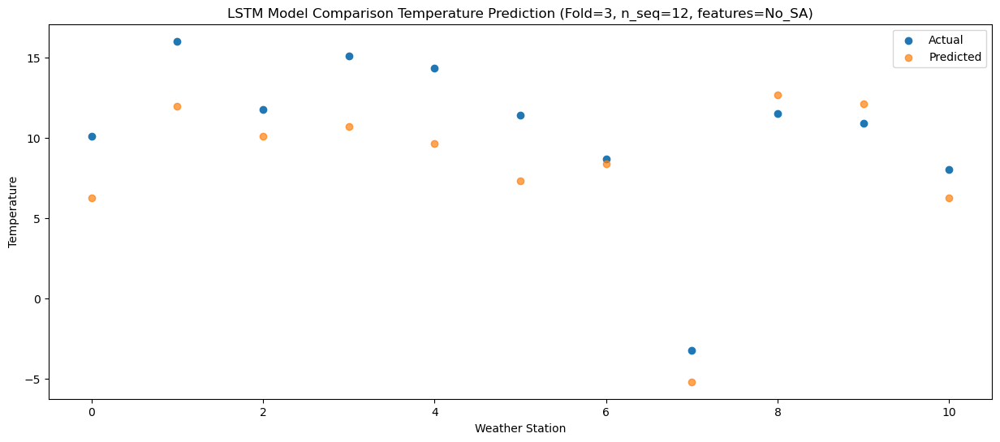

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.25   6.587101
1                 1   17.86  12.287101
2                 2   17.46  10.407101
3                 3   17.43  11.037101
4                 4   17.60   9.957101
5                 5   14.86   7.637101
6                 6   13.45   8.717101
7                 7    4.73  -4.852899
8                 8   13.69  12.957101
9                 9   15.52  12.427101
10               10   12.90   6.587101


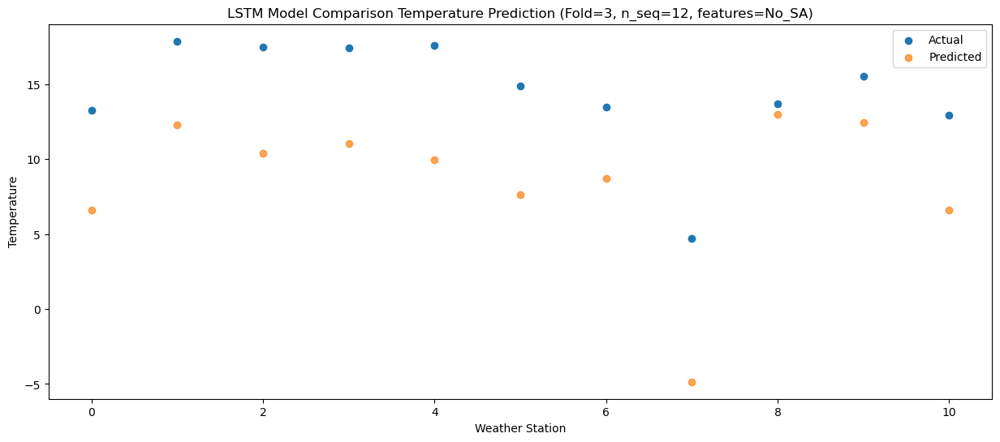

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   16.91   9.325743
1                 1   22.08  15.025743
2                 2   22.26  13.145743
3                 3   21.50  13.775743
4                 4   22.17  12.695743
5                 5   19.14  10.375743
6                 6   18.50  11.455743
7                 7    9.16  -2.114257
8                 8   17.98  15.695743
9                 9   20.35  15.165743
10               10   17.16   9.325743


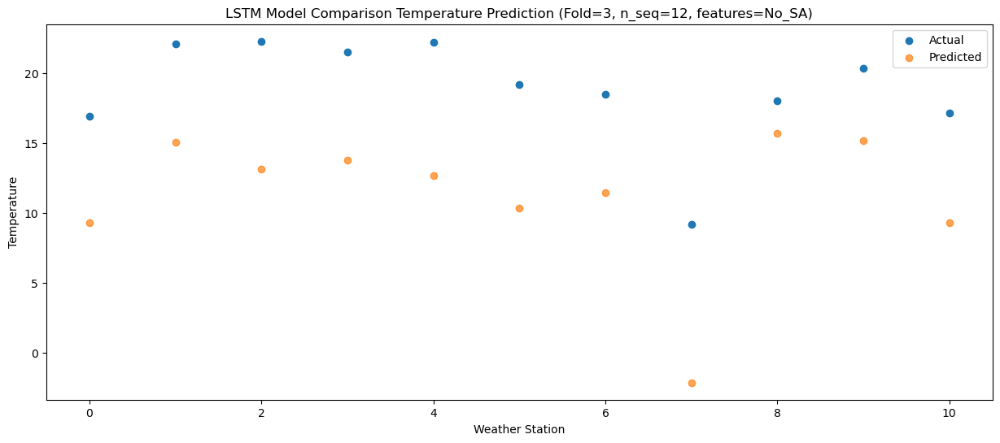

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   20.97  13.793586
1                 1   28.79  19.493586
2                 2   27.11  17.613586
3                 3   27.42  18.243586
4                 4   29.65  17.163586
5                 5   25.85  14.843586
6                 6   25.89  15.923586
7                 7   16.80   2.353586
8                 8   19.68  20.163586
9                 9   26.22  19.633586
10               10   23.33  13.793586


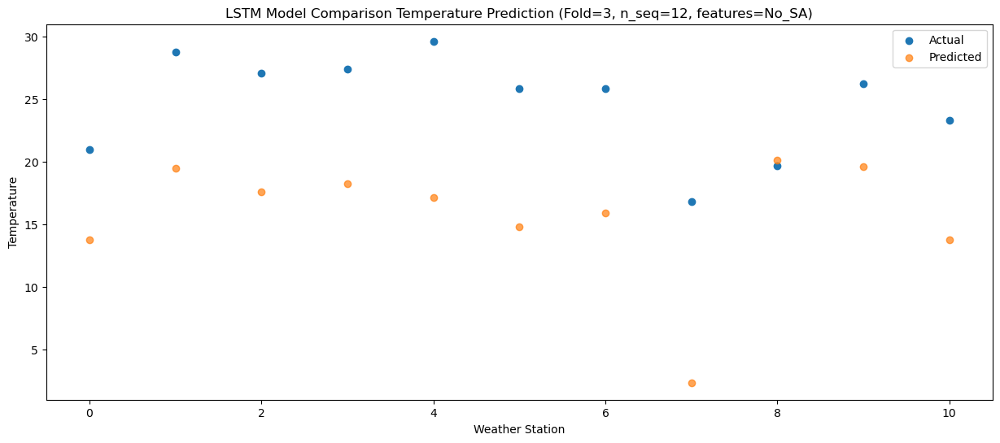

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   22.68  14.018659
1                 1   30.10  19.718659
2                 2   30.24  17.838659
3                 3   28.41  18.468659
4                 4   29.65  17.388659
5                 5   26.23  15.068659
6                 6   27.73  16.148659
7                 7   17.88   2.578659
8                 8   18.86  20.388659
9                 9   28.36  19.858659
10               10   24.97  14.018659


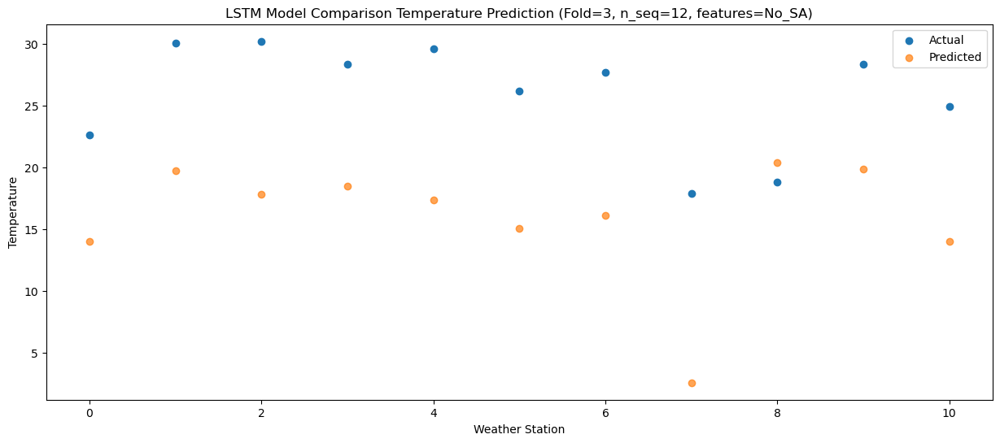

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   22.90  15.070954
1                 1   30.67  20.770954
2                 2   28.04  18.890954
3                 3   28.93  19.520954
4                 4   29.77  18.440954
5                 5   26.55  16.120954
6                 6   25.81  17.200954
7                 7   16.65   3.630954
8                 8   19.41  21.440954
9                 9   28.98  20.910954
10               10   24.70  15.070954


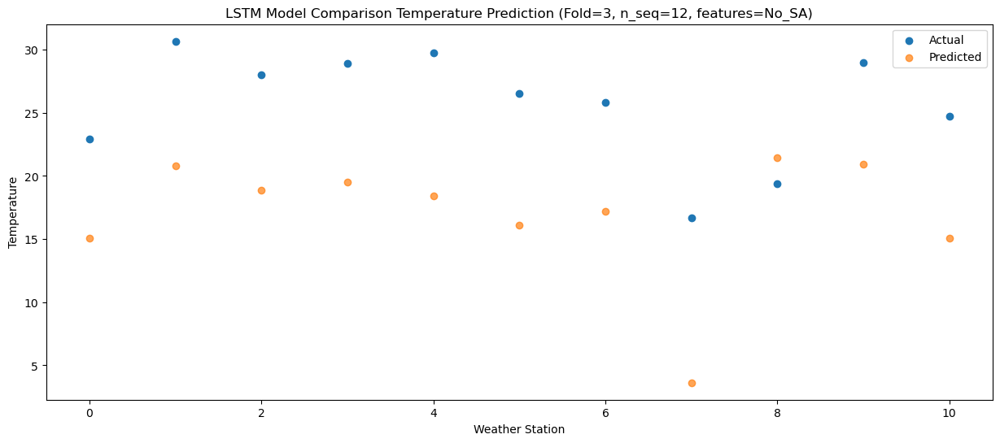

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   18.91  12.367777
1                 1   27.94  18.067777
2                 2   24.73  16.187777
3                 3   24.80  16.817777
4                 4   26.41  15.737777
5                 5   23.29  13.417777
6                 6   23.94  14.497777
7                 7   12.68   0.927777
8                 8   18.86  18.737777
9                 9   25.66  18.207777
10               10   20.44  12.367777


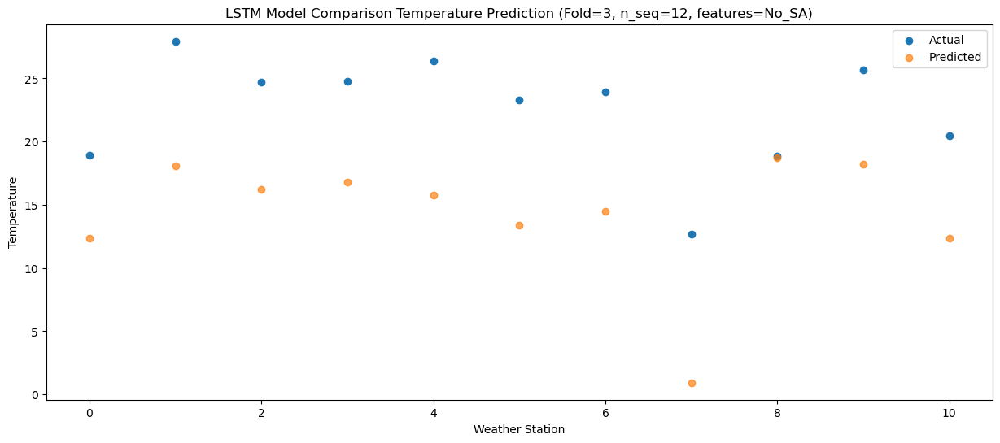

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   15.68   8.686132
1                 1   21.34  14.386132
2                 2   16.07  12.506132
3                 3   21.22  13.136132
4                 4   20.99  12.056132
5                 5   18.71   9.736132
6                 6   15.97  10.816132
7                 7    2.33  -2.753868
8                 8   16.10  15.056132
9                 9   21.22  14.526132
10               10   16.32   8.686132


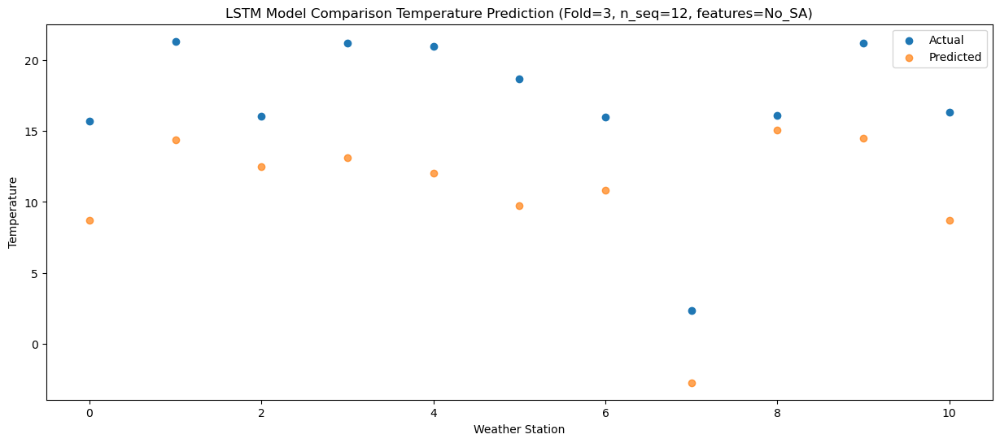

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    6.92   5.008066
1                 1   13.63  10.708066
2                 2   11.73   8.828066
3                 3   11.56   9.458066
4                 4   11.25   8.378066
5                 5    7.86   6.058066
6                 6   13.23   7.138066
7                 7   -0.19  -6.431934
8                 8   13.28  11.378066
9                 9   12.30  10.848066
10               10    6.10   5.008066


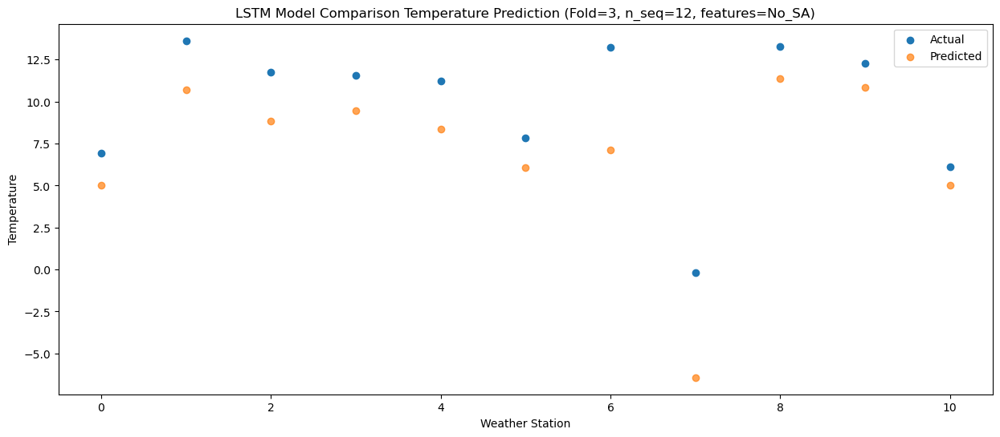

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    8.88   1.210375
1                 1   14.94   6.910375
2                 2    7.81   5.030375
3                 3   13.05   5.660375
4                 4   10.89   4.580375
5                 5    8.91   2.260375
6                 6    8.47   3.340375
7                 7   -7.46 -10.229625
8                 8    9.58   7.580375
9                 9   10.70   7.050375
10               10    5.69   1.210375


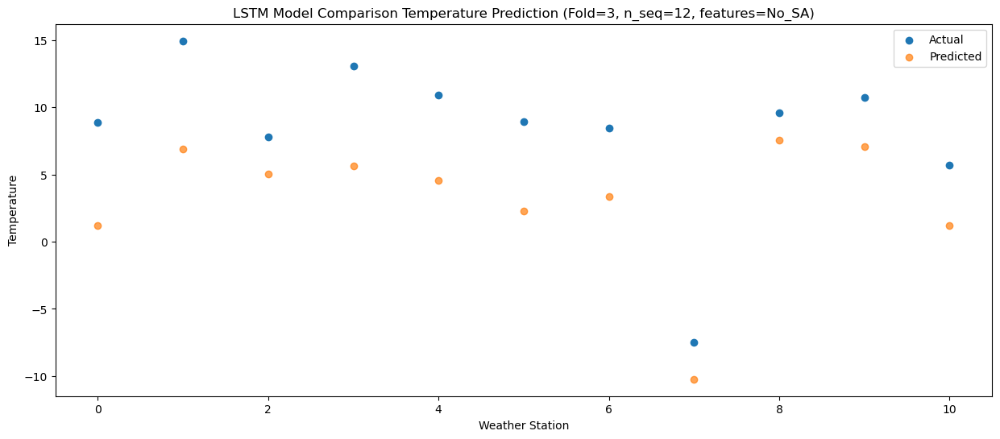

f, t:
[[ 2.92  7.75  8.28  6.19  5.1   2.8   5.6  -7.69 10.79  6.02  1.64]
 [ 3.29  4.03 10.58  4.87  1.23  0.08  5.7  -4.84 11.72  5.9   0.84]
 [10.09 16.   11.73 15.08 14.31 11.41  8.67 -3.24 11.5  10.9   8.03]
 [13.25 17.86 17.46 17.43 17.6  14.86 13.45  4.73 13.69 15.52 12.9 ]
 [16.91 22.08 22.26 21.5  22.17 19.14 18.5   9.16 17.98 20.35 17.16]
 [20.97 28.79 27.11 27.42 29.65 25.85 25.89 16.8  19.68 26.22 23.33]
 [22.68 30.1  30.24 28.41 29.65 26.23 27.73 17.88 18.86 28.36 24.97]
 [22.9  30.67 28.04 28.93 29.77 26.55 25.81 16.65 19.41 28.98 24.7 ]
 [18.91 27.94 24.73 24.8  26.41 23.29 23.94 12.68 18.86 25.66 20.44]
 [15.68 21.34 16.07 21.22 20.99 18.71 15.97  2.33 16.1  21.22 16.32]
 [ 6.92 13.63 11.73 11.56 11.25  7.86 13.23 -0.19 13.28 12.3   6.1 ]
 [ 8.88 14.94  7.81 13.05 10.89  8.91  8.47 -7.46  9.58 10.7   5.69]]
[[  3.80408276   9.50408276   7.62408276   8.25408276   7.17408276
    4.85408276   5.93408276  -7.63591724  10.17408276   9.64408276
    3.80408276]
 [  1.47786607 

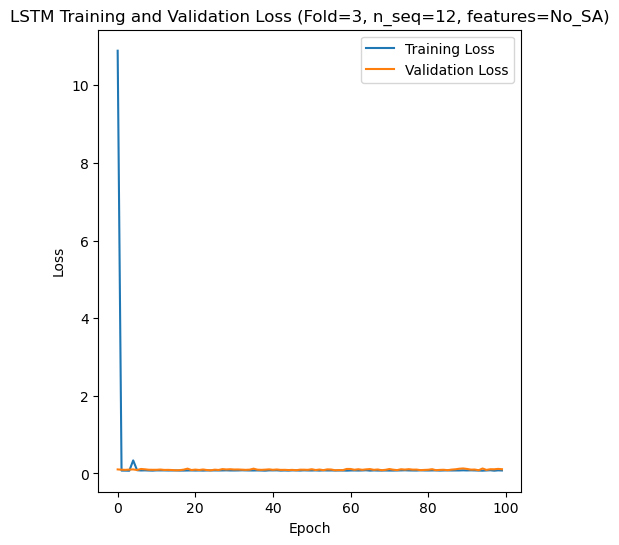

[[ 4.89  1.26  7.78 ... 22.59 18.46  9.82]
 [15.38 13.87 17.63 ... 26.66 22.89 20.2 ]
 [11.49  8.39 14.48 ... 24.97 20.83 17.82]
 ...
 [ 7.64  3.61 10.44 ... 21.3  17.62 11.34]
 [ 4.26  0.29  5.21 ... 21.47 15.54  9.34]
 [ 3.62 -0.32  6.05 ... 19.99 14.92  8.29]]
Epoch 1/100
84/84 [==============================] - 67s 390ms/step - loss: 14.5253 - accuracy: 0.4881 - mae: 14.2296 - rmse: 14.5253 - mape: 3129.0520 - pearson: 0.5093 - val_loss: 0.0885 - val_accuracy: 0.7000 - val_mae: 0.0730 - val_rmse: 0.0885 - val_mape: 15.8573 - val_pearson: 0.7887
Epoch 2/100
84/84 [==============================] - 25s 294ms/step - loss: 0.4153 - accuracy: 0.6310 - mae: 0.3727 - rmse: 0.4153 - mape: 82.8517 - pearson: 0.7272 - val_loss: 0.0929 - val_accuracy: 0.7000 - val_mae: 0.0751 - val_rmse: 0.0929 - val_mape: 17.1307 - val_pearson: 0.7920
Epoch 3/100
84/84 [==============================] - 25s 302ms/step - loss: 0.0751 - accuracy: 0.6310 - mae: 0.0591 - rmse: 0.0751 - mape: 13.2832 - pearson: 0

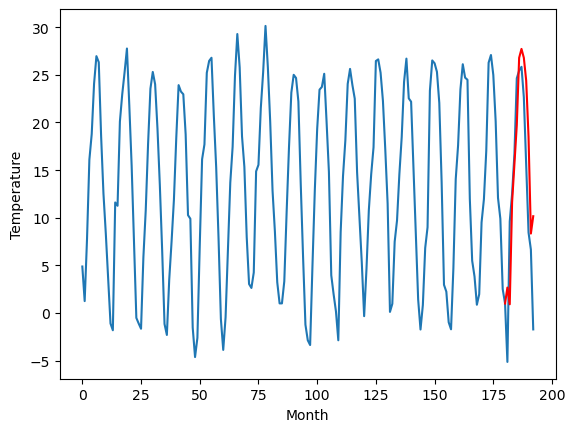

Weather Station 2:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
5.59		3.95		-1.64
9.02		2.20		-6.82
10.62		12.90		2.28
12.06		16.94		4.88
16.10		21.00		4.90
17.73		28.05		10.32
18.10		28.99		10.89
18.38		28.06		9.68
17.09		25.66		8.57
15.25		19.77		4.52
8.09		9.62		1.53
9.89		11.44		1.55
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[14.25, 3.9511357688903805, 2.196709051132202, 12.897739782333375, 16.943560972213746, 20.99668921470642, 28.053434267044068, 28.98881377220154, 28.059677078723908, 25.663219406604767, 19.765417530536652, 9.616698696613312, 11.435873820781708]


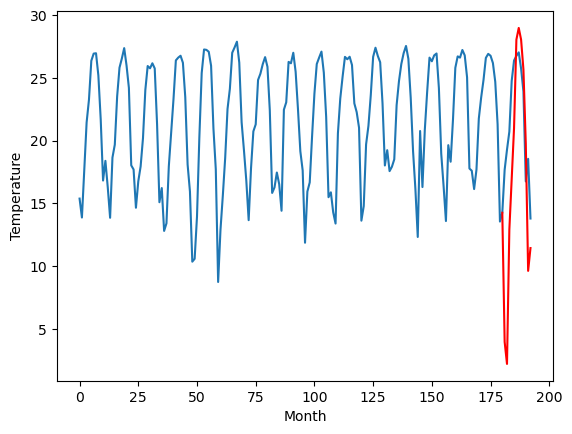

Weather Station 3:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
15.41		14.44		-0.97
13.49		12.69		-0.80
22.82		23.39		0.57
23.89		27.43		3.54
28.36		31.49		3.13
32.62		38.54		5.92
33.28		39.48		6.20
33.93		38.55		4.62
30.81		36.15		5.34
27.42		30.26		2.84
18.75		20.11		1.36
22.26		21.93		-0.33
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[9.06, 14.441135768890382, 12.686709051132203, 23.387739782333377, 27.433560972213748, 31.486689214706423, 38.54343426704407, 39.47881377220154, 38.54967707872391, 36.15321940660477, 30.255417530536654, 20.106698696613314, 21.92587382078171]


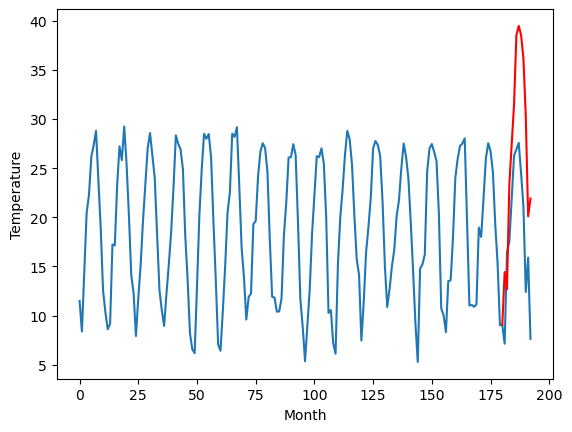

Weather Station 4:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.57		10.55		-0.02
7.11		8.80		1.69
18.07		19.50		1.43
19.76		23.54		3.78
23.92		27.60		3.68
29.60		34.65		5.05
31.19		35.59		4.40
31.56		34.66		3.10
28.77		32.26		3.49
24.12		26.37		2.25
16.12		16.22		0.10
18.12		18.04		-0.08
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.48, 10.551135768890381, 8.796709051132202, 19.497739782333376, 23.543560972213747, 27.596689214706423, 34.65343426704407, 35.58881377220154, 34.65967707872391, 32.26321940660477, 26.365417530536654, 16.216698696613314, 18.03587382078171]


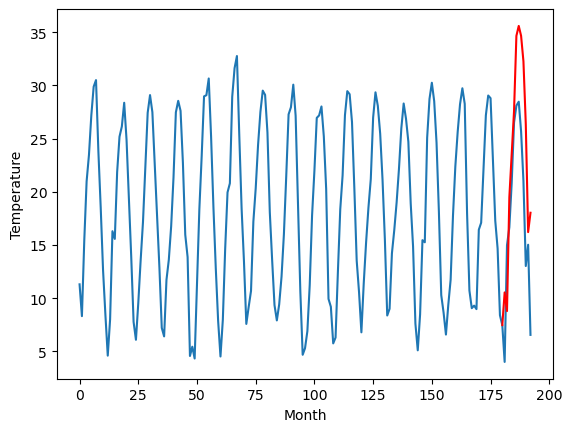

Weather Station 5:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.71		10.37		-0.34
6.82		8.62		1.80
17.74		19.32		1.58
19.92		23.36		3.44
23.45		27.42		3.97
30.30		34.47		4.17
31.79		35.41		3.62
32.16		34.48		2.32
28.73		32.08		3.35
23.86		26.19		2.33
16.02		16.04		0.02
17.76		17.86		0.10
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[7.33, 10.371135768890381, 8.616709051132203, 19.317739782333376, 23.363560972213747, 27.416689214706423, 34.47343426704407, 35.40881377220154, 34.47967707872391, 32.08321940660477, 26.185417530536654, 16.036698696613314, 17.85587382078171]


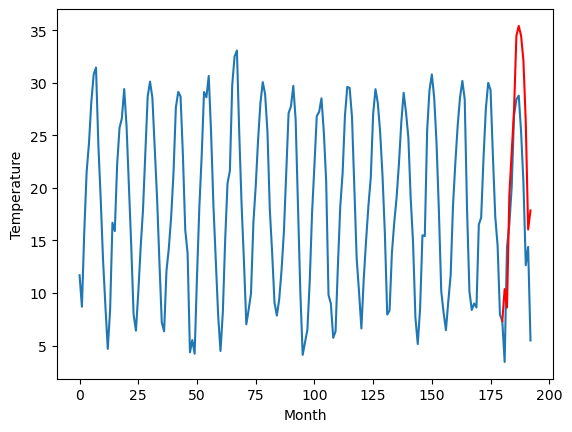

Weather Station 6:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.59		10.75		0.16
9.02		9.00		-0.02
18.27		19.70		1.43
20.50		23.74		3.24
25.99		27.80		1.81
30.95		34.85		3.90
30.69		35.79		5.10
31.01		34.86		3.85
30.32		32.46		2.14
24.62		26.57		1.95
17.68		16.42		-1.26
18.09		18.24		0.15
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.59, 10.75113576889038, 8.996709051132202, 19.69773978233337, 23.743560972213743, 27.79668921470642, 34.853434267044065, 35.788813772201536, 34.859677078723905, 32.463219406604765, 26.56541753053665, 16.41669869661331, 18.235873820781705]


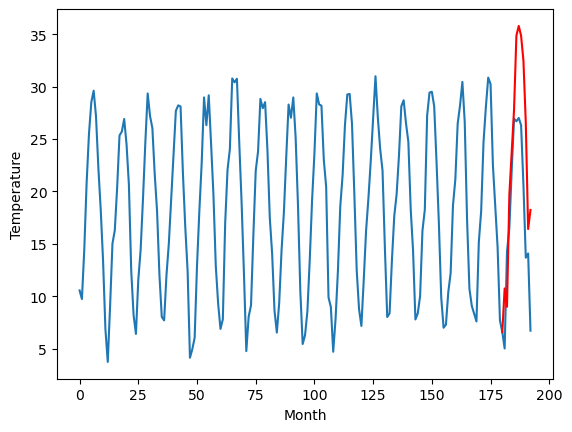

Weather Station 7:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
10.79		9.62		-1.17
11.46		7.87		-3.59
17.86		18.57		0.71
20.59		22.61		2.02
24.04		26.67		2.63
28.06		33.72		5.66
29.80		34.66		4.86
29.93		33.73		3.80
25.96		31.33		5.37
22.16		25.44		3.28
14.00		15.29		1.29
15.91		17.11		1.20
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[6.04, 9.621135768890381, 7.866709051132203, 18.567739782333376, 22.613560972213747, 26.666689214706423, 33.72343426704407, 34.65881377220154, 33.72967707872391, 31.33321940660477, 25.435417530536654, 15.286698696613314, 17.10587382078171]


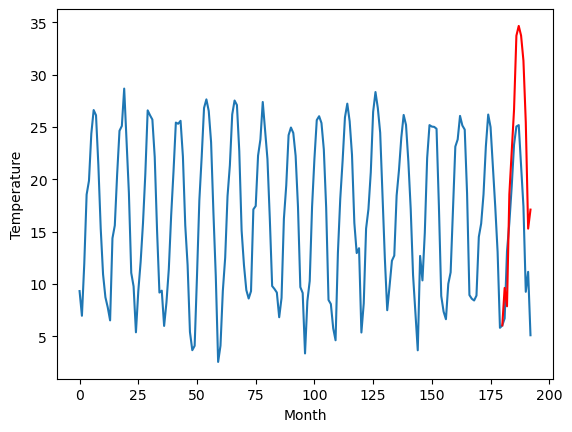

Weather Station 8:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
7.65		8.38		0.73
4.04		6.63		2.59
16.31		17.33		1.02
18.21		21.37		3.16
22.25		25.43		3.18
28.55		32.48		3.93
29.84		33.42		3.58
30.36		32.49		2.13
27.32		30.09		2.77
21.55		24.20		2.65
13.61		14.05		0.44
15.07		15.87		0.80
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[3.13, 8.381135768890381, 6.626709051132202, 17.327739782333374, 21.373560972213745, 25.42668921470642, 32.48343426704407, 33.41881377220154, 32.48967707872391, 30.093219406604767, 24.195417530536652, 14.046698696613312, 15.865873820781708]


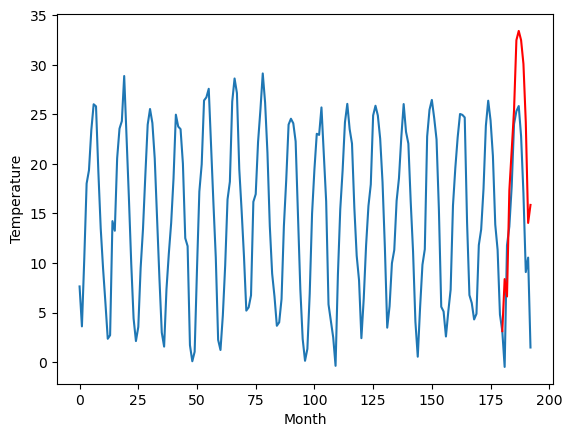

Weather Station 9:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
6.06		6.70		0.64
2.70		4.95		2.25
14.67		15.65		0.98
18.32		19.69		1.37
22.73		23.75		1.02
29.97		30.80		0.83
30.54		31.74		1.20
31.40		30.81		-0.59
27.91		28.41		0.50
22.56		22.52		-0.04
11.70		12.37		0.67
12.02		14.19		2.17
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-0.29, 6.7011357688903805, 4.946709051132202, 15.647739782333375, 19.693560972213746, 23.74668921470642, 30.803434267044068, 31.73881377220154, 30.809677078723908, 28.413219406604767, 22.515417530536652, 12.366698696613312, 14.185873820781708]


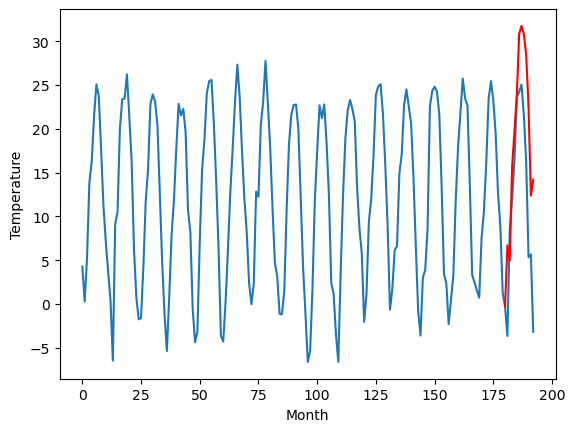

Weather Station 10:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
2.23		3.32		1.09
-2.21		1.57		3.78
11.65		12.27		0.62
15.36		16.31		0.95
20.14		20.37		0.23
27.53		27.42		-0.11
27.24		28.36		1.12
27.52		27.43		-0.09
24.41		25.03		0.62
18.95		19.14		0.19
8.64		8.99		0.35
8.39		10.81		2.42
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-1.03, 3.3211357688903806, 1.566709051132202, 12.267739782333374, 16.313560972213743, 20.36668921470642, 27.423434267044065, 28.358813772201536, 27.429677078723905, 25.033219406604765, 19.13541753053665, 8.98669869661331, 10.805873820781706]


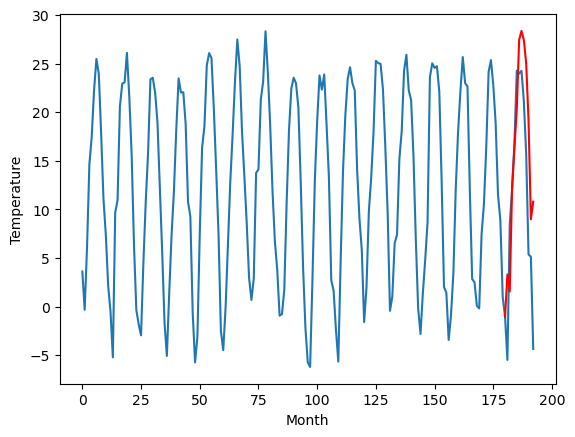

Weather Station 11:
Actual Temp	Predicted Temp	Difference
-----------	--------------	----------
1.70		2.68		0.98
-0.54		0.93		1.47
9.35		11.63		2.28
13.15		15.67		2.52
17.68		19.73		2.05
24.57		26.78		2.21
24.73		27.72		2.99
25.93		26.79		0.86
21.64		24.39		2.75
18.11		18.50		0.39
7.71		8.35		0.64
6.85		10.17		3.32
[180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192]
[-2.29, 2.681135768890381, 0.9267090511322023, 11.627739782333375, 15.673560972213746, 19.726689214706422, 26.78343426704407, 27.71881377220154, 26.78967707872391, 24.393219406604768, 18.495417530536653, 8.346698696613313, 10.165873820781709]


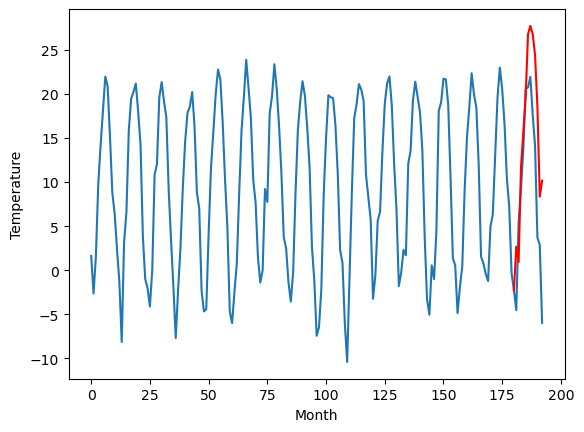

Predictions for (t+0):
    Weather_Station  Actual  Predicted
0                 0    2.11   2.681136
1                 1    5.59   3.951136
2                 2   15.41  14.441136
3                 3   10.57  10.551136
4                 4   10.71  10.371136
5                 5   10.59  10.751136
6                 6   10.79   9.621136
7                 7    7.65   8.381136
8                 8    6.06   6.701136
9                 9    2.23   3.321136
10               10    1.70   2.681136


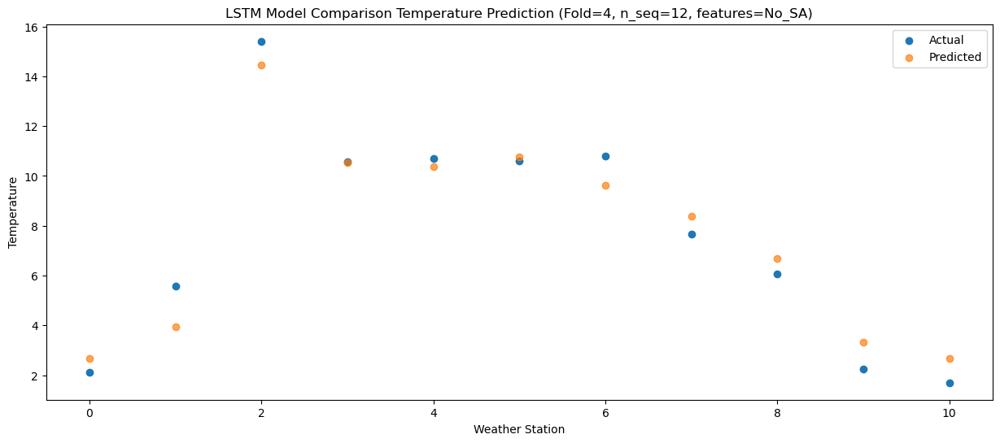

Predictions for (t+1):
    Weather_Station  Actual  Predicted
0                 0   -4.02   0.926709
1                 1    9.02   2.196709
2                 2   13.49  12.686709
3                 3    7.11   8.796709
4                 4    6.82   8.616709
5                 5    9.02   8.996709
6                 6   11.46   7.866709
7                 7    4.04   6.626709
8                 8    2.70   4.946709
9                 9   -2.21   1.566709
10               10   -0.54   0.926709


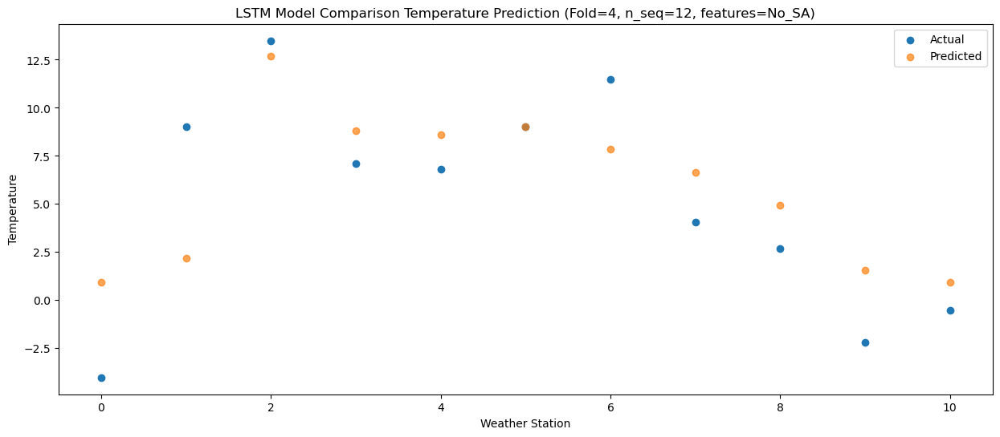

Predictions for (t+2):
    Weather_Station  Actual  Predicted
0                 0   10.71   11.62774
1                 1   10.62   12.89774
2                 2   22.82   23.38774
3                 3   18.07   19.49774
4                 4   17.74   19.31774
5                 5   18.27   19.69774
6                 6   17.86   18.56774
7                 7   16.31   17.32774
8                 8   14.67   15.64774
9                 9   11.65   12.26774
10               10    9.35   11.62774


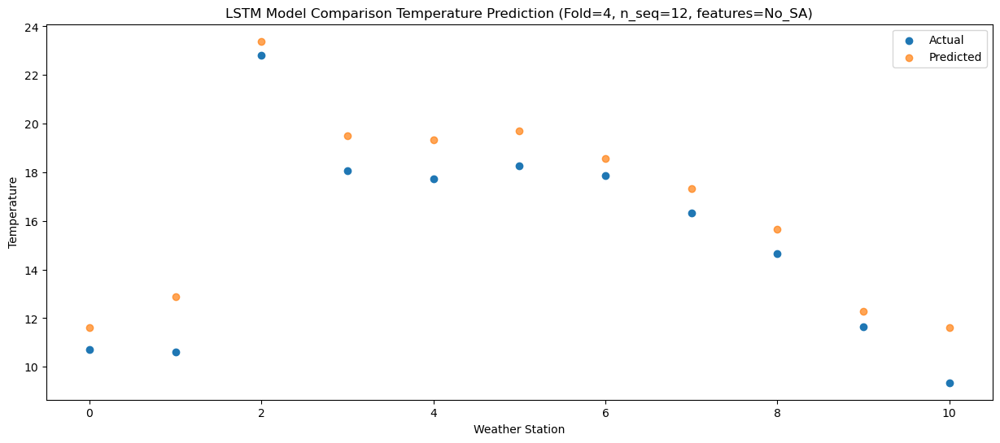

Predictions for (t+3):
    Weather_Station  Actual  Predicted
0                 0   13.62  15.673561
1                 1   12.06  16.943561
2                 2   23.89  27.433561
3                 3   19.76  23.543561
4                 4   19.92  23.363561
5                 5   20.50  23.743561
6                 6   20.59  22.613561
7                 7   18.21  21.373561
8                 8   18.32  19.693561
9                 9   15.36  16.313561
10               10   13.15  15.673561


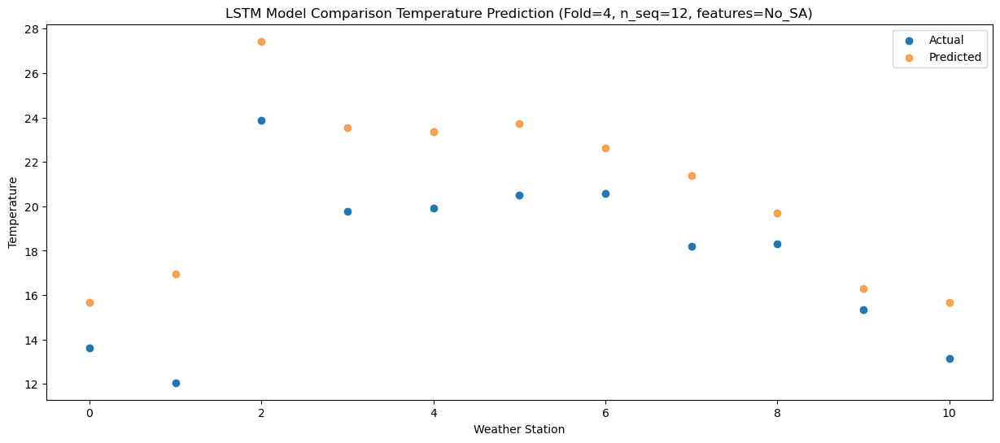

Predictions for (t+4):
    Weather_Station  Actual  Predicted
0                 0   17.83  19.726689
1                 1   16.10  20.996689
2                 2   28.36  31.486689
3                 3   23.92  27.596689
4                 4   23.45  27.416689
5                 5   25.99  27.796689
6                 6   24.04  26.666689
7                 7   22.25  25.426689
8                 8   22.73  23.746689
9                 9   20.14  20.366689
10               10   17.68  19.726689


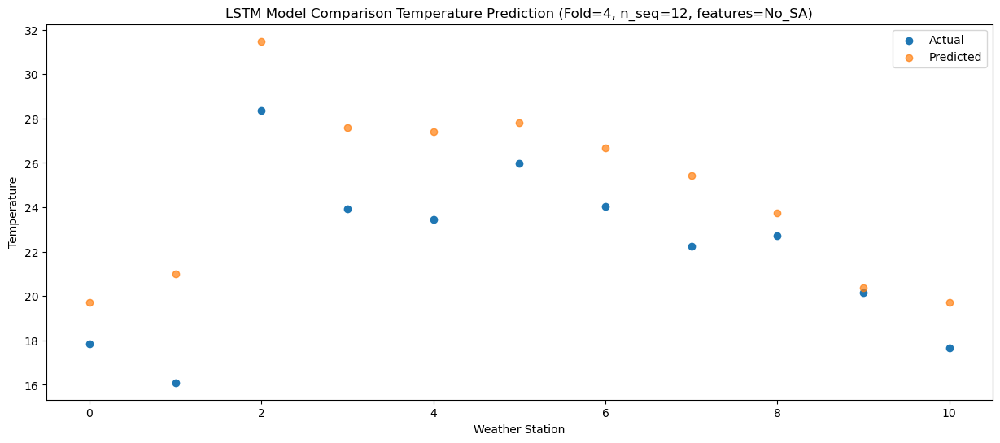

Predictions for (t+5):
    Weather_Station  Actual  Predicted
0                 0   25.74  26.783434
1                 1   17.73  28.053434
2                 2   32.62  38.543434
3                 3   29.60  34.653434
4                 4   30.30  34.473434
5                 5   30.95  34.853434
6                 6   28.06  33.723434
7                 7   28.55  32.483434
8                 8   29.97  30.803434
9                 9   27.53  27.423434
10               10   24.57  26.783434


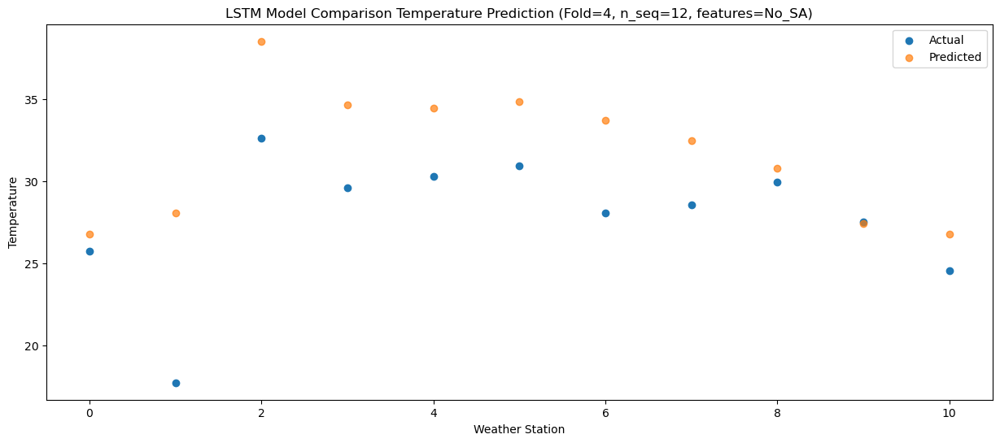

Predictions for (t+6):
    Weather_Station  Actual  Predicted
0                 0   26.54  27.718814
1                 1   18.10  28.988814
2                 2   33.28  39.478814
3                 3   31.19  35.588814
4                 4   31.79  35.408814
5                 5   30.69  35.788814
6                 6   29.80  34.658814
7                 7   29.84  33.418814
8                 8   30.54  31.738814
9                 9   27.24  28.358814
10               10   24.73  27.718814


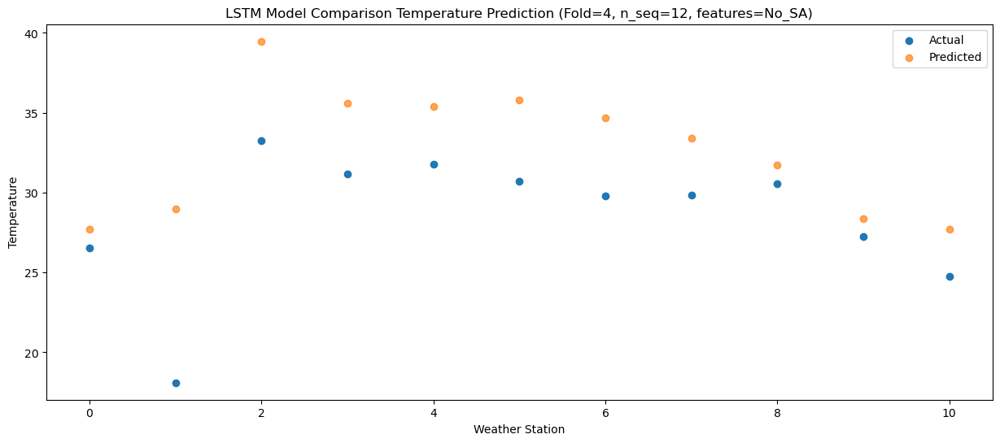

Predictions for (t+7):
    Weather_Station  Actual  Predicted
0                 0   26.94  26.789677
1                 1   18.38  28.059677
2                 2   33.93  38.549677
3                 3   31.56  34.659677
4                 4   32.16  34.479677
5                 5   31.01  34.859677
6                 6   29.93  33.729677
7                 7   30.36  32.489677
8                 8   31.40  30.809677
9                 9   27.52  27.429677
10               10   25.93  26.789677


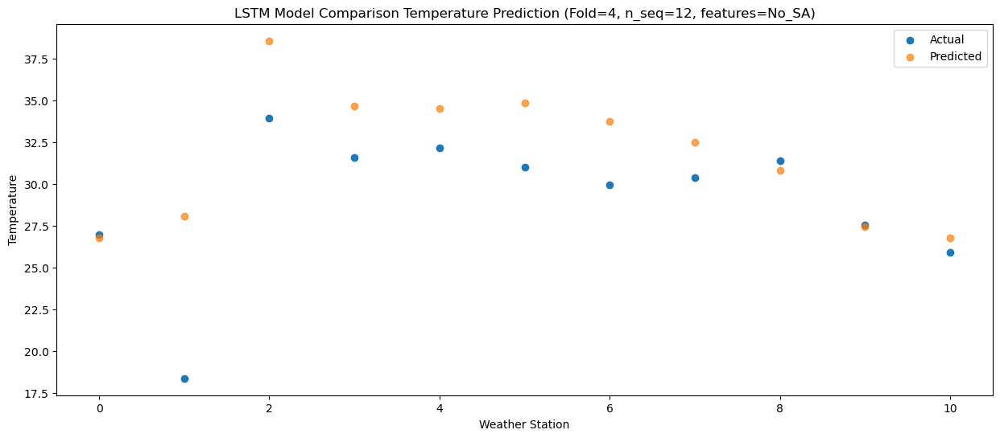

Predictions for (t+8):
    Weather_Station  Actual  Predicted
0                 0   23.75  24.393219
1                 1   17.09  25.663219
2                 2   30.81  36.153219
3                 3   28.77  32.263219
4                 4   28.73  32.083219
5                 5   30.32  32.463219
6                 6   25.96  31.333219
7                 7   27.32  30.093219
8                 8   27.91  28.413219
9                 9   24.41  25.033219
10               10   21.64  24.393219


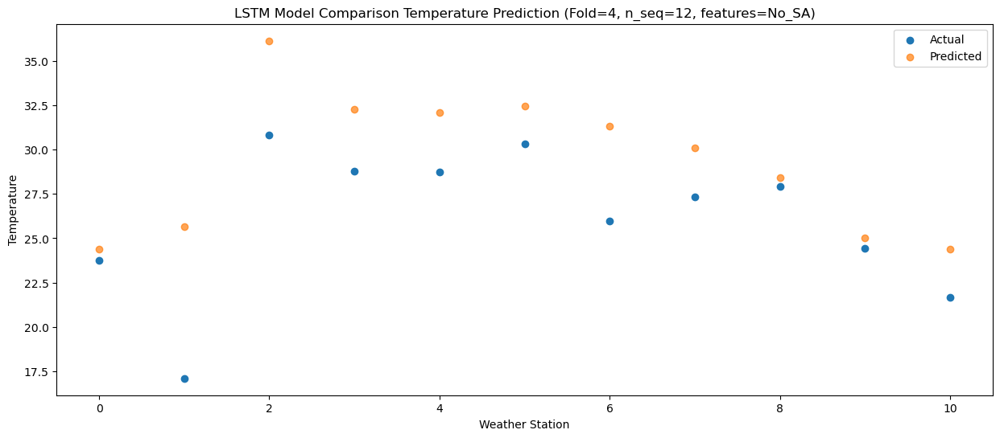

Predictions for (t+9):
    Weather_Station  Actual  Predicted
0                 0   16.62  18.495418
1                 1   15.25  19.765418
2                 2   27.42  30.255418
3                 3   24.12  26.365418
4                 4   23.86  26.185418
5                 5   24.62  26.565418
6                 6   22.16  25.435418
7                 7   21.55  24.195418
8                 8   22.56  22.515418
9                 9   18.95  19.135418
10               10   18.11  18.495418


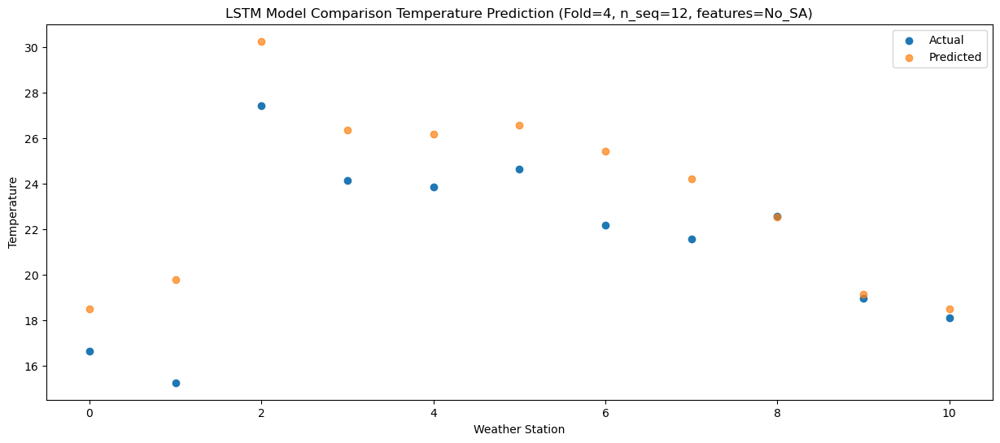

Predictions for (t+10):
    Weather_Station  Actual  Predicted
0                 0    9.56   8.346699
1                 1    8.09   9.616699
2                 2   18.75  20.106699
3                 3   16.12  16.216699
4                 4   16.02  16.036699
5                 5   17.68  16.416699
6                 6   14.00  15.286699
7                 7   13.61  14.046699
8                 8   11.70  12.366699
9                 9    8.64   8.986699
10               10    7.71   8.346699


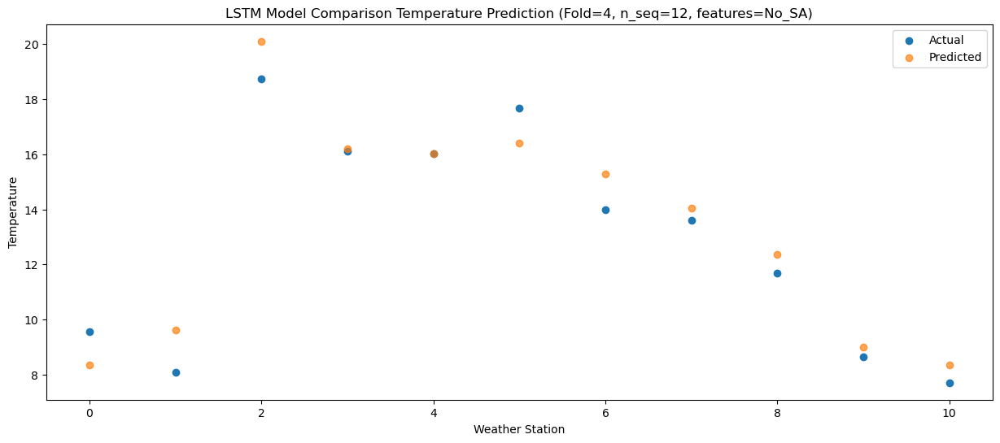

Predictions for (t+11):
    Weather_Station  Actual  Predicted
0                 0    7.77  10.165874
1                 1    9.89  11.435874
2                 2   22.26  21.925874
3                 3   18.12  18.035874
4                 4   17.76  17.855874
5                 5   18.09  18.235874
6                 6   15.91  17.105874
7                 7   15.07  15.865874
8                 8   12.02  14.185874
9                 9    8.39  10.805874
10               10    6.85  10.165874


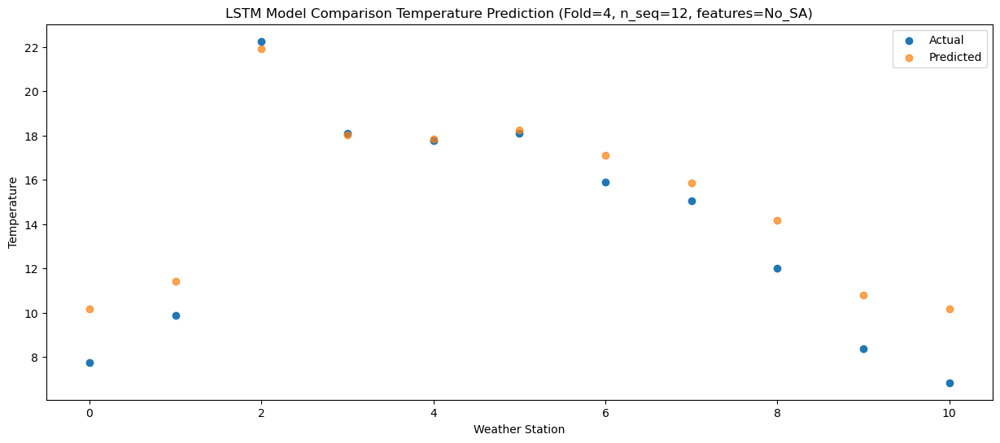

f, t:
[[ 2.11  5.59 15.41 10.57 10.71 10.59 10.79  7.65  6.06  2.23  1.7 ]
 [-4.02  9.02 13.49  7.11  6.82  9.02 11.46  4.04  2.7  -2.21 -0.54]
 [10.71 10.62 22.82 18.07 17.74 18.27 17.86 16.31 14.67 11.65  9.35]
 [13.62 12.06 23.89 19.76 19.92 20.5  20.59 18.21 18.32 15.36 13.15]
 [17.83 16.1  28.36 23.92 23.45 25.99 24.04 22.25 22.73 20.14 17.68]
 [25.74 17.73 32.62 29.6  30.3  30.95 28.06 28.55 29.97 27.53 24.57]
 [26.54 18.1  33.28 31.19 31.79 30.69 29.8  29.84 30.54 27.24 24.73]
 [26.94 18.38 33.93 31.56 32.16 31.01 29.93 30.36 31.4  27.52 25.93]
 [23.75 17.09 30.81 28.77 28.73 30.32 25.96 27.32 27.91 24.41 21.64]
 [16.62 15.25 27.42 24.12 23.86 24.62 22.16 21.55 22.56 18.95 18.11]
 [ 9.56  8.09 18.75 16.12 16.02 17.68 14.   13.61 11.7   8.64  7.71]
 [ 7.77  9.89 22.26 18.12 17.76 18.09 15.91 15.07 12.02  8.39  6.85]]
[[ 2.68113577  3.95113577 14.44113577 10.55113577 10.37113577 10.75113577
   9.62113577  8.38113577  6.70113577  3.32113577  2.68113577]
 [ 0.92670905  2.19670905 12

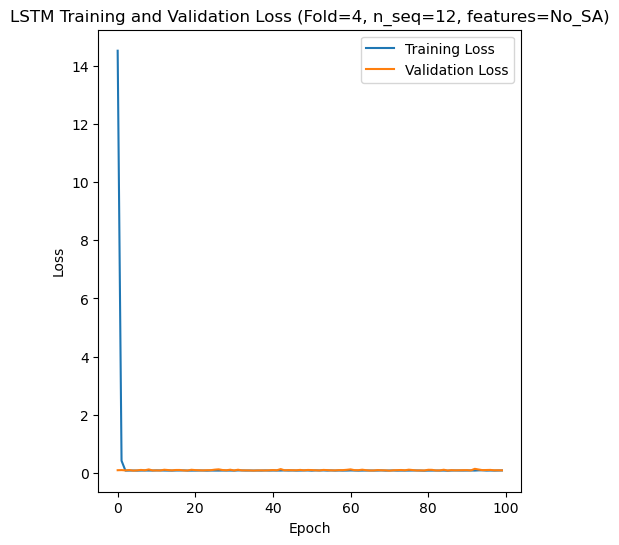

[[3.196789514114639], [3.369632855374741], [5.710888771863519], [6.985779661991722], [3.1457876357854975]]
[[array(3.19678951)], [array(3.36963286)], [array(5.71088877)], [array(6.98577966)], [array(3.14578764)]]
[[2.5788993292369633], [2.7058045747921327], [4.603124527919924], [5.934915031980385], [2.363542248064822]]
[[0.20586680232940077], [0.15327697186485628], [0.30156739341477273], [0.9034735170195507], [0.18628881378517267]]
[[0.834833813600118], [0.7975905059821031], [0.5626444973498503], [0.38885505283565514], [0.8733054746644133]]
[[array(0.11758549)], [array(0.15327697)], [array(0.30156739)], [array(0.37488749)], [array(0.10059835)]]
[[array(0.93161615)], [array(0.90663253)], [array(0.83157332)], [array(0.77571763)], [array(0.94642625)]]
[ 4.43  1.08 12.15 13.68 18.18 22.85 24.44 24.55 20.97 16.95  8.19 11.57
 12.87 12.78 17.84 19.24 23.26 26.74 27.96 28.3  26.17 23.54 18.03 17.79
 15.34 16.2  22.18 23.82 27.8  31.94 33.7  33.98 30.41 26.53 18.17 20.35
  9.    7.43 15.34 17.

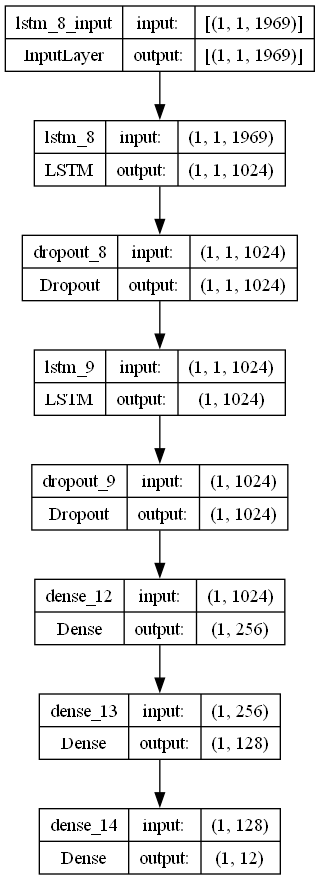

In [2]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, mean_absolute_percentage_error, r2_score
from tensorflow.keras.utils import plot_model

def rmse (y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true)))

def kmape (y_true, y_pred):
    return K.mean(K.sqrt(K.square(y_true - y_pred))/y_true)
    
def kpearson (y_true, y_pred):
    mean_true = K.mean(y_true)
    mean_pred = K.mean(y_pred)
    return (K.square(K.mean((y_true - mean_true)*(y_pred - mean_pred))))/(K.mean(K.square(y_true - mean_true))*K.mean(K.square(y_pred - mean_pred)))

# fit best LSTM model using parameters found by Optuna
def create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch):
    
    #Parameters:
    #trial (array-like): Optuna parameters.
    #train (array-like): Target values.
    #n_lag (int): Number of lag observations.
    #n_seq (int): Number of sequence observations
    #nb_epoch (int): Maximum number of epochs
    
    # Hyperparameters from best model
    lr =  0.10726989880675146
    optimizer = Adam(learning_rate = lr)
    activation_function = 'relu'
    lstm_units = 1024
    dropout_rate = 0.2894263795320246

    # design network
    model = Sequential()
    model.add(LSTM(lstm_units, return_sequences=True, batch_input_shape=(n_batch, X.shape[1], X.shape[2]), stateful=True))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(lstm_units))
    model.add(Dropout(dropout_rate))
    model.add(Dense(256, input_dim=y.shape[1], activation=activation_function))
    model.add(Dense(128, activation=activation_function))
    model.add(Dense(n_seq))
    model.compile(loss=rmse, optimizer=optimizer, metrics=['accuracy', 'mae', rmse, mape, pearson])
        
    return model

# Make one forecast with LSTM
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def forecast_lstm(model, X, n_seq, n_test):
    # reshape input pattern to [samples, timesteps, features]
    X = X.reshape(1, 1, X.shape[1])
    # make forecast
    forecast = model.predict(X)
    # convert to array
    return forecast
     
# Evaluate the persistence model
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def make_forecasts(model, X_test, y_test, n_lag, n_seq, n_test):
    forecasts = list()
    for i in range(len(X_test)):
        X, y = X_test[i, :], y_test[i, :]
        # make forecast
        forecast = forecast_lstm(model, X, n_seq, n_test)
        # store the forecast
        forecasts.append(forecast)
    return forecasts
     
# Invert differenced forecast
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_difference(last_ob, forecast):
    # Invert the first forecast
    inverted = list()
    inverted.append(forecast[0] + last_ob)
    # Propagate the difference forecast using the inverted first value
    for i in range(1, len(forecast)):
        inverted.append(forecast[i] + inverted[i-1])
    return inverted
     
# Inverse data transform on forecasts
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def inverse_transform(series, forecasts, scaler, n_test, n_seq):
    inverted = list()
    for i in range(len(forecasts)):
        # create an array from the forecast
        forecast = forecasts[i]
        forecast = forecast.reshape(1, n_seq)
        # invert scaling
        inv_scale = scaler.inverse_transform(forecast)
        inv_scale = inv_scale[0, :]
        # invert differencing
        index = len(series) - n_test + i
        last_ob = series.values[index]
        inv_diff = inverse_difference(last_ob, inv_scale)
        # store
        inverted.append(inv_diff)
    return inverted
     
# Evaluate the RMSE for each forecast time step
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def evaluate_forecasts(actual, forecasts, n_lag, n_seq):

    t = np.array(actual).transpose()
    f = np.array(forecasts).transpose()

    print("f, t:")
    print(t)
    print(f)
    rmse_list = []
    mae_list = []
    skmape_list = []
    mape_list = []
    r2_list = []
    pearson_list = []
    actual_list = []

    for i in range(n_seq):
        act = [row for row in t[i]]
        predicted = [forecast for forecast in f[i]]
        rmse1 = sqrt(mean_squared_error(act, predicted))
        rmse2 = np.array(rmse(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        mae = mean_absolute_error(act, predicted)
        mse = mean_squared_error(act, predicted)
        skmape = mean_absolute_percentage_error(act, predicted)
        kmape1 = np.array(kmape(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        kpearson1 = np.array(kpearson(tf.convert_to_tensor(np.array(act)), tf.convert_to_tensor(np.array(predicted))))
        r2 = r2_score(act, predicted) 
        avg_actual = np.mean(act)
        print("Year at t+"+str(i+1)+":")
        print('t+%d SKRMSE: %f' % ((i+1), rmse1))
        print('t+%d KRMSE: %f' % ((i+1), rmse2))        
        print('t+%d MAE: %f' % ((i+1), mae))
        print('t+%d SKMAPE: %f' % ((i+1), skmape))
        print('t+%d R2_SCORE: %f' % ((i+1), r2))
        print('t+%d KMAPE: %f' % ((i+1), kmape1))
        print('t+%d PEARSON: %f' % ((i+1), kpearson1))
        print('t+%d AVERAGE ACTUAL: %f' % ((i+1), avg_actual))

    y_true = tf.convert_to_tensor(np.array(actual).flatten())
    y_pred = tf.convert_to_tensor(np.array(forecasts).flatten())

    rmse1 = sqrt(mean_squared_error(np.array(y_true), np.array(y_pred)))
    rmse2 = np.array(rmse(y_true, y_pred))
    mae = mean_absolute_error(np.array(y_true), np.array(y_pred))
    mse = mean_squared_error(np.array(y_true), np.array(y_pred))
    skmape = mean_absolute_percentage_error(np.array(y_true), np.array(y_pred))
    kmape1 = np.array(kmape(y_true, y_pred))
    kpearson1 = np.array(kpearson(y_true, y_pred))
    r2 = r2_score(np.array(y_true), np.array(y_pred)) 
    avg_actual = np.mean(np.array(y_true))
    rmse1_list.append(rmse1)
    rmse2_list.append(rmse2)
    mae_list.append(mae)
    skmape_list.append(skmape)
    pearson_list.append(kpearson1)
    mape_list.append(kmape1)
    r2_list.append(r2)
    actual_list.append(avg_actual)
    print("Metrics for this Fold:")
    print('SKRMSE: %f' % (rmse1))
    print('KRMSE: %f' % (rmse2))        
    print('MAE: %f' % (mae))
    print('SKMAPE: %f' % (skmape))
    print('R2_SCORE: %f' % (r2))
    print('KMAPE: %f' % (kmape1))
    print('PEARSON: %f' % (kpearson1))
    print('AVERAGE ACTUAL: %f' % (avg_actual))

    return rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list
     
# plot the forecasts in the context of the original dataset
#Taken from: https://machinelearningmastery.com/multi-step-time-series-forecasting-long-short-term-memory-networks-python/
def plot_forecasts(series, forecasts, actual, n_test, n_seq, n_lag):
    # Plot the entire dataset in blue
    plt.plot(series[:n_lag+2+len(forecasts)].values)
    # Plot the forecasts in red
    off_s = n_lag + 1
    off_e = off_s + len(forecasts) + 1
    xaxis = [x for x in range(off_s, off_e)]
    yaxis = [series.values[off_s]] + forecasts
    print(xaxis)
    print(yaxis)
    plt.plot(xaxis, yaxis, color='red')
    plt.xlabel("Month")
    plt.ylabel("Temperature")
    # show the plot
    plt.show()

n_batch = 1
n_test = 11
nb_epoch = 100
    
rmse1_avg_list = []
rmse2_avg_list = []
mae_avg_list = []
skmape_avg_list = []
r2_score_avg_list = []
mape_avg_list = []
pearson_avg_list = []
actual_avg_list = []
forecast_results = []
actual_results = []
    
for i in range(5):
    train1 = train[i]
    test1 = test[i]
    validation1 = validation[i]

    X = train1[:, 0:-n_seq]
    y = train1[:, -n_seq:]
    X_test = test1[:, 0:-n_seq]
    y_test = test1[:, -n_seq:]
    X_val = validation1[:, 0:-n_seq]
    y_val = validation1[:, -n_seq:]
    
    dataset_df = pd.DataFrame(val_y[i])
    dataset_df = dataset_df.iloc[0:10, :]
    dataset = dataset_df.values

    print(dataset)

    series = pd.Series(dataset[:, 0]) # Using first column (temperatures)

    X = X.reshape(X.shape[0], 1, X.shape[1])
    X1 = X_test
    X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])
    X_val = X_val.reshape(X_val.shape[0], 1, X_val.shape[1])

    best_model = create_best_model(X, y, n_lag, n_seq, n_batch, nb_epoch)
    history = best_model.fit(X, y, epochs=100, batch_size=n_batch, validation_data=(X_val, y_val))
    
    # Evaluate the model
    loss = best_model.evaluate(X_test, y_test, verbose=2)
    print(f'Test Loss: {loss}')

    # make forecasts
    forecasts = make_forecasts(best_model, X_test, y_test, n_lag, n_seq, n_test)
    
    # inverse transform forecasts and test
    forecasts = inverse_transform(series, forecasts, scaler[i], n_test, n_seq)
    actual = [row[-n_seq:] for row in test1]
    actual = inverse_transform(series, actual, scaler[i], n_test, n_seq)

    # Print out plots of actual and predicted values for weather stations
    ws = df.index[1:12]
    print(ws)
    a = []
    f = []
    for q in range(len(actual)):
        x = actual[q]
        a.append(x[0])
    for q in range(len(forecasts)):
        x = forecasts[q]
        f.append(x[0])
    print(a)
    print(f)
    # Create a DataFrame for plotting
    results_df = pd.DataFrame({
        'ws': ws,
        'Actual': a,
        'Predicted': f
    })

    print(results_df)
    
    print("Actual and Forecasts:")
    print(actual)
    print(forecasts)
    
    for j in range(11):
        print("Weather Station "+str(j+1)+":")
        print("Actual Temp\tPredicted Temp\tDifference")
        print("-----------\t--------------\t----------")
        for k in range(n_seq):
            diff = forecasts[j][k] - actual[j][k]
            print(f"{actual[j][k]:.2f}\t\t{forecasts[j][k]:.2f}\t\t{diff:.2f}")
    
        # plot forecasts
        dataset_df = pd.DataFrame(val_y[i])
        dataset_df = dataset_df.iloc[0:11, :]
        dataset_df = dataset_df.transpose()
        dataset = dataset_df.values

        series_ws = pd.Series(dataset[:, j]) # Using first column (temperatures)
        forecasts_ws = forecasts[j]
        actual_ws = actual[j]
        
        plot_forecasts(series_ws, forecasts_ws, actual_ws, n_test, n_seq, n_lag)

    for k in range(n_seq):
        print("Predictions for (t+"+str(k)+"):")
        # Print out plots of actual and predicted values for each weather station
        results = []

        # Create a DataFrame for plotting
        for j in range(11):
            results.append([j, actual[j][k], forecasts[j][k]])
               
        results_df = pd.DataFrame(results)
        results_df.columns = ['Weather_Station', 'Actual', 'Predicted']

        print(results_df)

        # Plotting the results
        plt.figure(figsize=(15, 6))
        plt.scatter(results_df['Weather_Station'], results_df['Actual'], label='Actual')
        plt.scatter(results_df['Weather_Station'], results_df['Predicted'], label='Predicted', alpha=0.7)
        title1='LSTM Model Comparison Temperature Prediction (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
        plt.title(title1)
        plt.xlabel('Weather Station')
        plt.ylabel('Temperature')
        plt.legend()
        plt.show()

    rmse1_list = [] # list stores sklearn's root mean squared errors for each future time prediction
    rmse2_list = [] # list stores root mean squared errors for each future time prediction
    mae_list = [] # list stores mean absolute errors for each future time prediction
    skmape_list = [] # list stores sklearn's mean squared percentage errors for each future time prediction
    r2_list = [] # list stores sklearn's r2 pearson values for each future time prediction
    mape_list = [] # list stores mean squared percentage errors for each future time prediction
    pearson_list = [] # list stores r2 pearson values for each future time prediction
    actual_list = [] # list stores average actual values for each future time prediction

    # evaluate forecasts
    rmse1_list, rmse2_list, mae_list, skmape_list, r2_list, mape_list, pearson_list, actual_list = evaluate_forecasts(actual, forecasts, n_lag, n_seq)

    rmse1_avg_list.append(rmse1_list)
    rmse2_avg_list.append(rmse2_list)
    mae_avg_list.append(mae_list)
    skmape_avg_list.append(skmape_list)
    r2_score_avg_list.append(r2_list)
    mape_avg_list.append(mape_list)
    pearson_avg_list.append(pearson_list)
    actual_avg_list.append(actual_list)
    forecast_results.append(forecasts)
    actual_results.append(actual)
            
    best_model.summary()

    plt.figure(figsize=(12, 6))
    plt.subplot(1, 2, 1)
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')
    title2 = 'LSTM Training and Validation Loss (Fold='+str(i)+', n_seq='+str(n_seq)+', features=No_SA)'
    plt.title(title2)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(loc='upper right')
    plt.show()

print(rmse1_avg_list)
print(rmse2_avg_list)
print(mae_avg_list)
print(skmape_avg_list)
print(r2_score_avg_list)
print(mape_avg_list)
print(pearson_avg_list)
print(np.array(actual_results).flatten())
print(np.array(forecast_results).flatten())
a2 = np.array(actual_results).flatten()
f2 = np.array(forecast_results).flatten()
p1 = np.array(pearson(tf.convert_to_tensor(a2), tf.convert_to_tensor(f2)))
print("Accuracy Results:")
print("RMSE for each fold:")
print(rmse1_avg_list)
print("Average SKRMSE:"+str(np.mean(rmse1_avg_list)))
print("Average KRMSE:"+str(np.mean(rmse2_avg_list)))
print("Average MAE:"+str(np.mean(mae_avg_list)))
print("Average SKMAPE:"+str(np.mean(skmape_avg_list)))
print("Average MAPE:"+str(np.mean(mape_avg_list)))
print("Average PEARSON:"+str(p1))
print("Average R2 Score:"+str(np.mean(r2_score_avg_list)))

# Plot model architecture
filename = "lstm_model_optimized_CV_S12_No_SA.png"
plot_model(best_model, to_file=filename, show_shapes=True, show_layer_names=True)